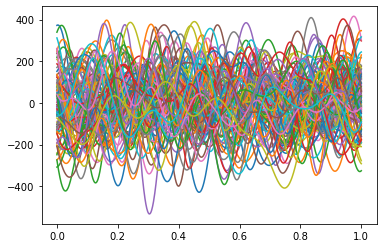

done


In [5]:
#Generating coefficients for trig functions
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.integrate import quad
#Generating a partition
Finite=20               #Maximum number of coefficients of a function
NuFuncTrig=100               #Number of functions
z=np.linspace(0,1,1000)
n=np.zeros((NuFuncTrig,Finite))
a=np.zeros((NuFuncTrig,Finite))
b=np.zeros((NuFuncTrig,Finite))
#Generating the coefficients of random continuous functions
for i in range (NuFuncTrig):
    for j in range (Finite):
        n[i][j]=np.random.randint(-50,50)
        a[i][j]=np.random.uniform(low=-50, high=50, size=None)
        b[i][j]=np.random.uniform(low=-50, high=50, size=None)
#        Lip[i]=Lip[i]+abs(n[i][j])*(abs(a[i][j])+abs(b[i][j]))
#Saving the coefficients
np.save('n.npy', n)
np.save('a.npy', a)
np.save('b.npy', b)
for i in range(NuFuncTrig):
    def f(x):
        y=0
        for j in range(Finite):
            y=y+a[i][j]*np.cos(n[i][j]*x)+b[i][j]*np.sin(n[i][j]*x)
        return(y)
    plt.plot(z,f(z))
plt.show()
print('done')

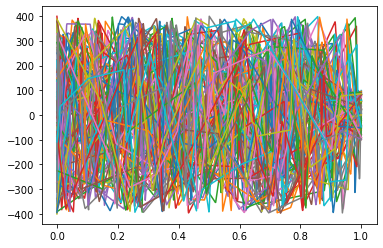

Done


In [8]:
#Generating coefficients for linear functions
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
z=np.linspace(0,1,1000)
NuFuncLinear=100
NuPoints=20
Point=np.zeros((NuFuncLinear,NuPoints))
Value=np.zeros((NuFuncLinear,NuPoints))
for i in range(NuFuncLinear):
    X=[]
    for j in range(NuPoints-2):
        X.append(np.random.uniform(low=0, high=1, size=None))
        Y=np.random.uniform(low=-400, high=400, size=None)
        Value[i][j]=Y
    X.append(0)
    X.append(1)
    X=np.sort(X, axis=-1, kind=None, order=None)
    Point[i]=X
    Value[i][NuPoints-2]=np.random.uniform(low=-100, high=100, size=None)
    Value[i][NuPoints-1]=np.random.uniform(low=-100, high=100, size=None)
np.save('Point', Point)
np.save('Value',Value)
for i in range(NuFuncLinear):
    f=interp1d(Point[i],Value[i], kind='linear')
    plt.plot(z,f(z))
plt.show()
print('Done')

In [2]:
#Combining trig & linear to generate Time & Errortables
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.interpolate import lagrange
from scipy.integrate import quad
from scipy.interpolate import make_interp_spline
from scipy.interpolate import splrep
from scipy.interpolate import PchipInterpolator
from scipy.interpolate import BarycentricInterpolator as baryinterpolation
#Generating a partition
Finite=20               #Maximum number of coefficients of a function
NuFuncTrig=20               #Number of functions made by trigs
NuFuncLinear=20
NuFunc=NuFuncTrig+NuFuncLinear
NuPoints=100
MaxNuPoint=200           #Max Number of points in partition
Count=100           #Min Number of points in partition 
Jump=1                #The jump in terms of points between each 2 partitions
#epsilon=1000  #Allowed error
#Lip=[0]*(NuFunc) #Lipschizt value 
z=np.linspace(0,1,1000)
n=np.load('n.npy')
a=np.load('a.npy')
b=np.load('b.npy')
Point=np.load('Point.npy')
Value=np.load('Value.npy')
NuPar=MaxNuPoint-Count
print('The number of Partitions is:', NuPar)
Partition=[]
PartitionList=[]
Timetable=np.zeros((NuPar,7))
EncodeTimetable=np.zeros((NuPar,7))
Errortable=np.zeros((NuPar,7))
#Generating a partition with the allowed error(epsilon)
for p in range(NuPar):
    step=1/Count
    X=[0]
    count=1
    x=0
####Defining the time arrays#####################################################
    timelinear=[]
    timequadratic=[]
    timecubic=[]
    timefifthpower=[]
    timeseventhpower=[]
    timelargepower=[]
#    timebaryinterpolation=[]
    timemonocubic=[]
#Generating partition#############################################################
    while (x<1-step):
        x=x+step
        X.append(x)
        count=count+1
    X.append(1)
    PartitionList.append(X)
    count=count+1
    Count+=1
    #Computing the values at the partition points#################################
    Partition.append(Count)
    Y=np.zeros((NuFuncTrig+NuFuncLinear,count))
    start=time.time()
    for i in range(NuFuncTrig):
        for j in range(count):
            for k in range(Finite):
                Y[i][j]=Y[i][j]+a[i][k]*np.cos(n[i][k]*X[j])+b[i][k]*np.sin(n[i][k]*X[j])
    end=time.time()
    encodetime=end-start
    for i in range(NuFuncLinear):
        f=interp1d(Point[i],Value[i], kind='linear')
        start=time.time()
        k=i+NuFuncTrig
        for j in range(count):
            Y[k][j]=f(X[j])
        end=time.time()
        encodetime+=end-start
#####Interpolation & cost##################################################################
    ilinear=[0]*(NuFunc)
    iquadratic=[0]*(NuFunc)
    icubic=[0]*(NuFunc)
    ififthpower=[0]*(NuFunc)
    iseventhpower=[0]*(NuFunc)
    ilargepower=[0]*(NuFunc)
#    ibaryinterpolation=[0]*NuFunc
    imonocubic=[0]*(NuFunc)
####Defining the functions#################################################################    
    for i in range(NuFuncTrig):
        def f(x):
            y=0
            for j in range(Finite):
                y=y+a[i][j]*np.cos(n[i][j]*x)+b[i][j]*np.sin(n[i][j]*x)
            return(y)
########Computing the cost##################################################################
        #Linear##############################################################
        start = time.time()
        Linear=interp1d(X,Y[i], kind='linear')
        end = time.time()
        timelinear.append(end-start)
        #Quadratic###########################################################
        start = time.time()
        quadratic=make_interp_spline(X, Y[i], k=2, t=None, bc_type=None, axis=0)
        end = time.time()
        timequadratic.append(end-start)
        #Cubic###############################################################
        start = time.time()
        Cubic=CubicSpline(X,Y[i], bc_type='natural')
        end = time.time()
        timecubic.append(end-start)
        #fifthpower###############################################################
        start = time.time()
        fifthpower=make_interp_spline(X, Y[i], k=5, t=None, bc_type=None, axis=0)
        end = time.time()
        timefifthpower.append(end-start)
        #seventhpower###############################################################
        start = time.time()
        seventhpower=make_interp_spline(X, Y[i], k=7, t=None, bc_type=None, axis=0)
        end = time.time()
        timeseventhpower.append(end-start)
        #largepower###############################################################
        start = time.time()
        largepower=make_interp_spline(X, Y[i], k=17, t=None, bc_type=None, axis=0)
        end = time.time()
        timelargepower.append(end-start)
#        #Baryinterpolation########################################################
#        start = time.time()
#        Baryinterpolation=baryinterpolation(X,Y[i])
#        end = time.time()
#        timebaryinterpolation.append(end-start)
        #monocubic###############################################################
        start = time.time()
        monocubic=PchipInterpolator(X,Y[i], axis=0, extrapolate=None)
        end = time.time()
        timemonocubic.append(end-start)
        #Define the error####################################################
        def Flinear(x):
            return(pow(f(x)-Linear(x),2))
        def Fquadratic(x):
            return(pow(f(x)-quadratic(x),2))
        def Fcubic(x):
            return(pow(f(x)-Cubic(x),2))
        def Ffifthpower(x):
            return(pow(f(x)-fifthpower(x),2))
        def Fseventhpower(x):
            return(pow(f(x)-seventhpower(x),2))
        def Flargepower(x):
            return(pow(f(x)-largepower(x),2))
#        def Fbaryinterpolation(x):
#            return(pow(f(x)-Baryinterpolation(x),2))
        def Fmonocubic(x):
            return(pow(f(x)-monocubic(x),2))
        #Taking the error####################################################
        ilinear[i]= pow(quad(Flinear,0,1)[0],0.5)
        iquadratic[i]= pow(quad(Fquadratic,0,1)[0],0.5)
        icubic[i] = pow(quad(Fcubic,0,1)[0],0.5)
        ififthpower[i] = pow(quad(Ffifthpower,0,1)[0],0.5)
        iseventhpower[i] = pow(quad(Fseventhpower,0,1)[0],0.5)
        ilargepower[i] = pow(quad(Flargepower,0,1)[0],0.5)
#        ibaryinterpolation[i] = pow(quad(Fbaryinterpolation,0,1)[0],0.5)
        imonocubic[i] = pow(quad(Fmonocubic,0,1)[0],0.5)
####Defining the functions#################################################################    
    for i in range(NuFuncTrig,NuFunc):
        f=interp1d(Point[i-NuFuncTrig],Value[i-NuFuncTrig], kind='linear')
########Computing the cost##################################################################
        #Linear##############################################################
        start = time.time()
        Linear=interp1d(X,Y[i], kind='linear')
        end = time.time()
        timelinear.append(end-start)
        #Quadratic###########################################################
        start = time.time()
        quadratic=make_interp_spline(X, Y[i], k=2, t=None, bc_type=None, axis=0)
        end = time.time()
        timequadratic.append(end-start)
        #Cubic###############################################################
        start = time.time()
        Cubic=CubicSpline(X,Y[i], bc_type='natural')
        end = time.time()
        timecubic.append(end-start)
        #fifthpower###############################################################
        start = time.time()
        fifthpower=make_interp_spline(X, Y[i], k=5, t=None, bc_type=None, axis=0)
        end = time.time()
        timefifthpower.append(end-start)
        #seventhpower###############################################################
        start = time.time()
        seventhpower=make_interp_spline(X, Y[i], k=7, t=None, bc_type=None, axis=0)
        end = time.time()
        timeseventhpower.append(end-start)
        #largepower###############################################################
        start = time.time()
        largepower=make_interp_spline(X, Y[i], k=17, t=None, bc_type=None, axis=0)
        end = time.time()
        timelargepower.append(end-start)
#        #Baryinterpolation########################################################
#        start = time.time()
#        Baryinterpolation=baryinterpolation(X,Y[i])
#        end = time.time()
#        timebaryinterpolation.append(end-start)
        #monocubic###############################################################
        start = time.time()
        monocubic=PchipInterpolator(X,Y[i], axis=0, extrapolate=None)
        end = time.time()
        timemonocubic.append(end-start)
        #Define the error####################################################
        def Flinear(x):
            return(pow(f(x)-Linear(x),2))
        def Fquadratic(x):
            return(pow(f(x)-quadratic(x),2))
        def Fcubic(x):
            return(pow(f(x)-Cubic(x),2))
        def Ffifthpower(x):
            return(pow(f(x)-fifthpower(x),2))
        def Fseventhpower(x):
            return(pow(f(x)-seventhpower(x),2))
        def Flargepower(x):
            return(pow(f(x)-largepower(x),2))
#        def Fbaryinterpolation(x):
#            return(pow(f(x)-Baryinterpolation(x),2))
        def Fmonocubic(x):
            return(pow(f(x)-monocubic(x),2))
        #Taking the error####################################################
        ilinear[i]= pow(quad(Flinear,0,1)[0],0.5)
        iquadratic[i]= pow(quad(Fquadratic,0,1)[0],0.5)
        icubic[i] = pow(quad(Fcubic,0,1)[0],0.5)
        ififthpower[i] = pow(quad(Ffifthpower,0,1)[0],0.5)
        iseventhpower[i] = pow(quad(Fseventhpower,0,1)[0],0.5)
        ilargepower[i] = pow(quad(Flargepower,0,1)[0],0.5)
#        ibaryinterpolation[i] = pow(quad(Fbaryinterpolation,0,1)[0],0.5)
        imonocubic[i] = pow(quad(Fmonocubic,0,1)[0],0.5)
#####Finding the mean error###################################################################   
    #Linear#############################################
    Ilinear=np.mean(ilinear)
    Errortable[p][0]=Ilinear
    #Quadratic#############################################
    Iquadratic=np.mean(iquadratic)
    Errortable[p][1]=Iquadratic
    #Cubic#############################################
    Icubic=np.mean(icubic)
    Errortable[p][2]=Icubic
    #Fifthpower#############################################
    Ififthpower=np.mean(ififthpower)
    Errortable[p][3]=Ififthpower
    #Fifthpower#############################################
    Iseventhpower=np.mean(iseventhpower)
    Errortable[p][4]=Iseventhpower
    #largepower#############################################
    Ilargepower=np.mean(ilargepower)
    Errortable[p][5]=Ilargepower
#    #baryinterpolation#############################################
#    Ibaryinterpolation=np.mean(ibaryinterpolation)
#    Errortable[p][6]=Ibaryinterpolation
    #monocubic#############################################
    Imonocubic=np.mean(imonocubic)
    Errortable[p][6]=Imonocubic
####EncodeTimetable##################################################################################
    EncodeTimetable[p][0]=np.mean(timelinear)
    EncodeTimetable[p][1]=np.mean(timequadratic)
    EncodeTimetable[p][2]=np.mean(timecubic)
    EncodeTimetable[p][3]=np.mean(timefifthpower)
    EncodeTimetable[p][4]=np.mean(timeseventhpower)
    EncodeTimetable[p][5]=np.mean(timelargepower)
#    EncodeTimetable[p][6]=np.mean(timebaryinterpolation)
    EncodeTimetable[p][6]=np.mean(timemonocubic)
####Timetable##################################################################################
    Timetable[p][0]=encodetime+np.mean(timelinear)
    Timetable[p][1]=encodetime+np.mean(timequadratic)
    Timetable[p][2]=encodetime+np.mean(timecubic)
    Timetable[p][3]=encodetime+np.mean(timefifthpower)
    Timetable[p][4]=encodetime+np.mean(timeseventhpower)
    Timetable[p][5]=encodetime+np.mean(timelargepower)
#    Timetable[p][6]=encodetime+np.mean(timebaryinterpolation)
    Timetable[p][6]=encodetime+np.mean(timemonocubic)
#Print & save###############################################
plt.show()
print('Partition count list')
print(Partition)
print('Partition list')
PartitionList=np.array(PartitionList, dtype=object)
print(PartitionList)
#################
print('Time table')
print(Timetable)
print('Errortable')
print(Errortable)
print('Encode Time table')
print(EncodeTimetable)
################################################################################
np.save('TmatrixBoth1000.npy', Timetable)
np.save('EmatrixBoth1000.npy', Errortable)
np.save('CountBoth1000.npy', Partition)
np.save('ListBoth1000.npy', PartitionList)

The number of Partitions is: 50


<ipython-input-2-dbd351591a5d>:154: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  ilinear[i]= pow(quad(Flinear,0,1)[0],0.5)
<ipython-input-2-dbd351591a5d>:225: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpo


Errortable
[[2.58128908e-04 1.33466487e-02 1.41774472e-02 1.37195516e-02
  4.98199492e-02 5.94125410e-01 1.08788872e-05]
 [2.60340896e-04 1.64989155e-02 2.87298797e-02 3.89765925e-02
  4.64420493e-02 5.81473481e-01 1.06325211e-05]
 [2.62154786e-04 1.62747743e-02 1.68577134e-02 2.44532103e-02
  5.10868991e-02 1.01548504e+00 6.69615233e-06]
 [2.57186355e-04 1.35039844e-02 3.44428849e-02 4.39933110e-02
  5.43772072e-02 5.97490091e-01 1.00183923e-05]
 [2.58820608e-04 1.50714045e-02 1.64226654e-02 2.71907457e-02
  4.56905389e-02 6.04364741e-01 6.06528007e-06]
 [2.56860484e-04 1.52236668e-02 2.97928163e-02 2.79460224e-02
  4.53647326e-02 5.91773236e-01 8.29300455e-06]
 [2.60492794e-04 6.47387600e-03 1.56556250e-02 4.89642190e-02
  5.10888317e-02 6.11583242e-01 8.88914677e-06]
 [2.58476134e-04 1.60748341e-02 2.64128287e-02 4.01706941e-02
  5.30351694e-02 9.91017168e-01 1.07290645e-05]
 [2.64629553e-04 1.54116855e-02 1.84537091e-02 3.32099914e-02
  4.70695413e-02 1.00760240e+00 5.88149664e-06

Totaltable= 0 *Timetable+ 1 *Errortable


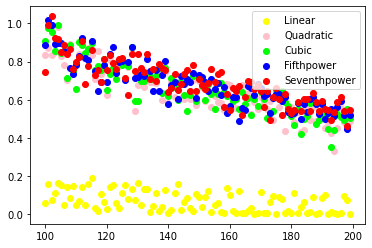

Totaltable= 0.05 *Timetable+ 0.95 *Errortable


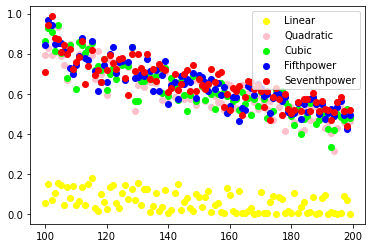

Totaltable= 0.1 *Timetable+ 0.9 *Errortable


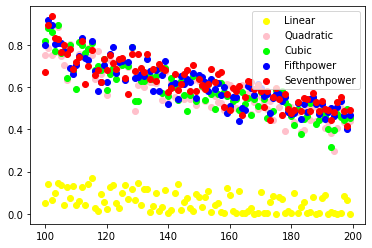

Totaltable= 0.15000000000000002 *Timetable+ 0.85 *Errortable


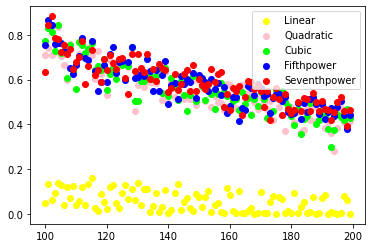

Totaltable= 0.2 *Timetable+ 0.8 *Errortable


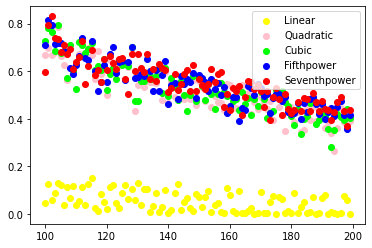

Totaltable= 0.25 *Timetable+ 0.75 *Errortable


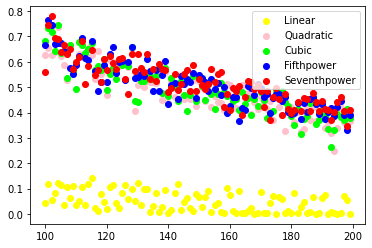

Totaltable= 0.3 *Timetable+ 0.7 *Errortable


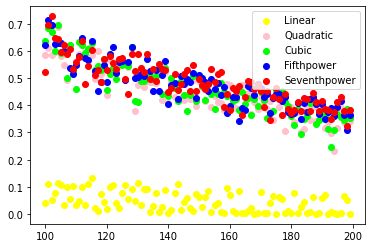

Totaltable= 0.35 *Timetable+ 0.65 *Errortable


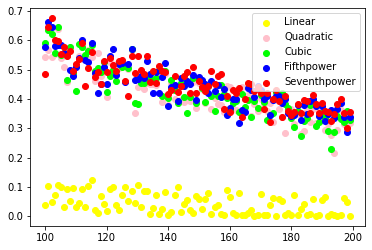

Totaltable= 0.39999999999999997 *Timetable+ 0.6000000000000001 *Errortable


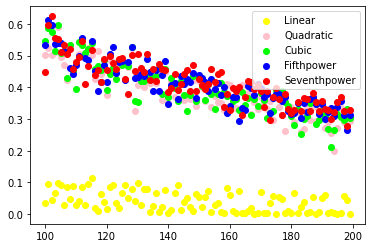

Totaltable= 0.44999999999999996 *Timetable+ 0.55 *Errortable


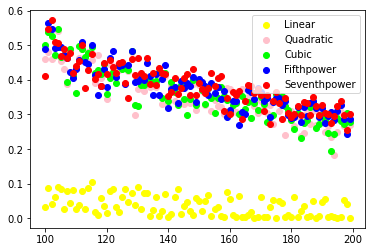

Totaltable= 0.49999999999999994 *Timetable+ 0.5 *Errortable


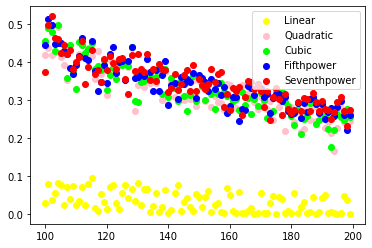

Totaltable= 0.5499999999999999 *Timetable+ 0.45000000000000007 *Errortable


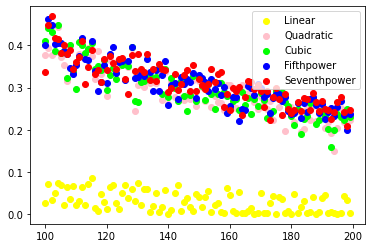

Totaltable= 0.6 *Timetable+ 0.4 *Errortable


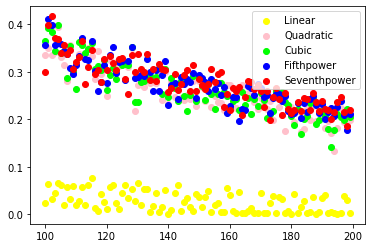

Totaltable= 0.65 *Timetable+ 0.35 *Errortable


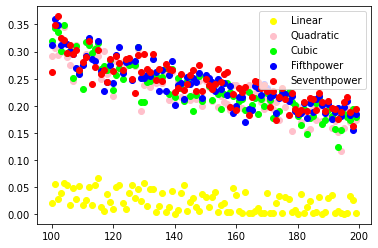

Totaltable= 0.7000000000000001 *Timetable+ 0.29999999999999993 *Errortable


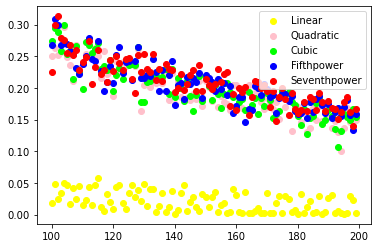

Totaltable= 0.7500000000000001 *Timetable+ 0.2499999999999999 *Errortable


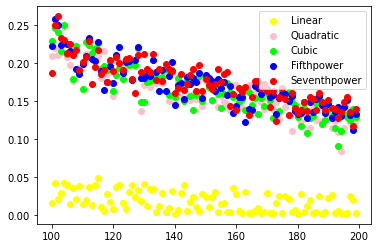

Totaltable= 0.8000000000000002 *Timetable+ 0.19999999999999984 *Errortable


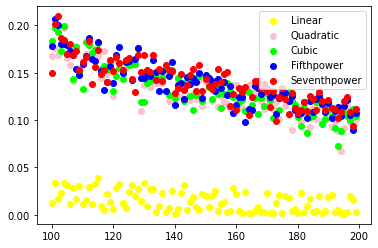

Totaltable= 0.8500000000000002 *Timetable+ 0.1499999999999998 *Errortable


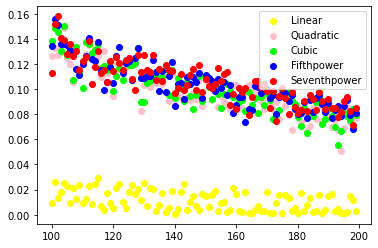

Totaltable= 0.9000000000000002 *Timetable+ 0.09999999999999976 *Errortable


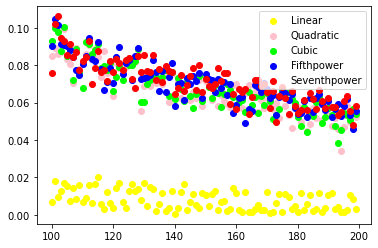

Totaltable= 0.9500000000000003 *Timetable+ 0.04999999999999971 *Errortable


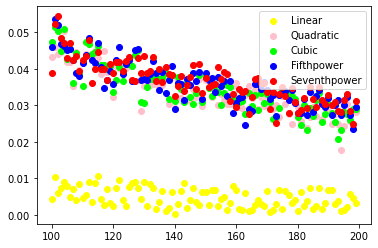

Totaltable= 1 *Timetable+ 0 *Errortable


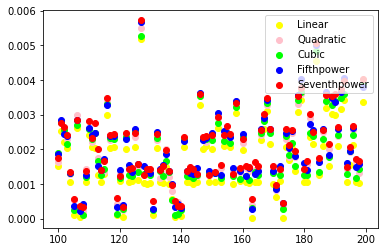

In [39]:
#Graph:x-axis is number of points in the partition, while y-axis is the value.
import numpy as np
from matplotlib import pyplot as plt
Timetable = np.load('TmatrixLinear1000j10.npy')
Errortable = np.load('EmatrixLinear1000j10.npy')
Decodetimetable=np.load('DecodeLinear1000j10.npy')
partitioncount = np.load('CountLinear1000j10.npy')
MinPar=100
MaxPar=200
NuPar=MaxPar-MinPar
#plt_1 = plt.figure(figsize=(15, 10))
i=0
e=0.05
A=[]
while i < 1:
    A.append(i)
    i=i+e
A.append(1)
for a in (A):
    b=1-a
    Totaltable=a*Timetable+b*Errortable
    print('Totaltable=',a,'*Timetable+',b,'*Errortable')
    ###############################################
    x=[]
    y=[]
    for i in range(NuPar):
        x.append(Totaltable[i][0])
        y.append(100+i)
    plt.scatter(y,x, color= 'yellow', label='Linear')
    #plt.plot(y,x,color = 'grey', linestyle = 'dashed')
    plt.legend(loc="upper right")
    #plt.show()
    ###############################################
    #plt_2 = plt.figure(figsize=(15, 15))
    x=[]
    y=[]
    for i in range(NuPar):
        x.append(Totaltable[i][1])
        y.append(100+i)
    plt.scatter(y,x, color= 'pink', label='Quadratic')
    #plt.plot(y,x,color = 'grey', linestyle = 'dashed')
    plt.legend(loc="upper right")
    #plt.show()
    ###############################################
    #plt_3 = plt.figure(figsize=(15, 15))
    x=[]
    y=[]
    for i in range(NuPar):
        x.append(Totaltable[i][2])
        y.append(100+i)
    plt.scatter(y,x, color= 'lime', label='Cubic')
    #plt.plot(y,x,color = 'grey', linestyle = 'dashed')
    plt.legend(loc="upper right")
    #plt.show()
    ###############################################
    #plt_3 = plt.figure(figsize=(15, 15))
    x=[]
    y=[]
    for i in range(NuPar):
        x.append(Totaltable[i][3])
        y.append(100+i)
    plt.scatter(y,x, color= 'blue', label='Fifthpower')
    #plt.plot(y,x,color = 'grey', linestyle = 'dashed')
    plt.legend(loc="upper right")
    #plt.show()
    ###############################################
    #plt_3 = plt.figure(figsize=(15, 15))
    #x=[]
    #y=[]
    #for i in range(NuPar):
    #    x.append(Totaltable[i][6])
    #    y.append(100+i)
    #plt.scatter(y,x, color= 'indigo', label='lagrange')
    #plt.legend(loc="upper right")
    #plt.show()
    ###############################################
    #plt_3 = plt.figure(figsize=(15, 15))
    x=[]
    y=[]
    for i in range(NuPar):
        x.append(Totaltable[i][4])
        y.append(100+i)
    plt.scatter(y,x, color= 'red', label='Seventhpower')
    #plt.plot(y,x,color = 'grey', linestyle = 'dashed')
    plt.legend(loc="upper right")
    #plt.show()
    #################################################
#    #plt_3 = plt.figure(figsize=(15, 15))
#    x=[]
#    y=[]
#    for i in range(NuPar):
#        x.append(Totaltable[i][5])
#        y.append(100+i)
#    plt.scatter(y,x, color= 'brown', label='Largepower')
#    plt.legend(loc="upper right")
    #plt.show()
    ###############################################
#    #plt_3 = plt.figure(figsize=(15, 15))
#    x=[]
#    y=[]
#    for i in range(NuPar):
#        x.append(Totaltable[i][6])
#        y.append(100+i)
#    plt.scatter(y,x, color= 'black', label='monocubic')
#    #plt.plot(y,x,color = 'grey', linestyle = 'dashed')
#    plt.legend(loc="upper right")
#    #plt.show()
    ###############################################
    plt.show()

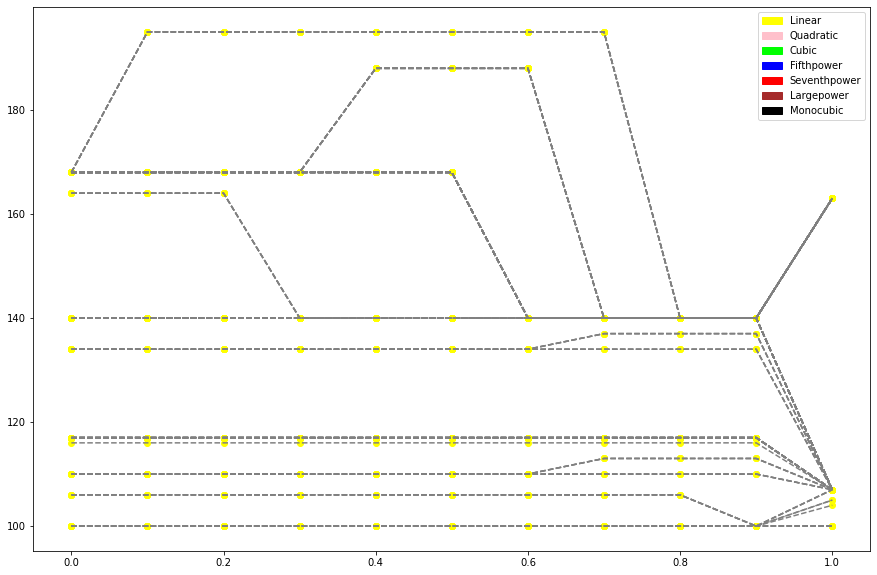

In [2]:
#Here each line represents a different matrix(from 100 to the maximum number of parition points)
#Here x-axis is value of a(the weight), and y-axis is the number of points in a partition
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import math
Colorlist=['yellow','pink','lime','blue','red','brown','black']
Interpoltionlist=['Linear','Quadratic','Cubic','Fifthpower','Seventhpower','Largepower','Monocubic']
plt_1 = plt.figure(figsize=(15, 10))
MinNuPoint=100
MaxNuPoint=200
#Creating the range of A###########################################
e=0.1
n=int(1/e)
A=[]
for i in range(n+1):
    A.append(i*e)
###################################################################
Step=1
CutNuPoint=200
NuInt=6
#Loading the tables################################################
Timetable=np.load('TmatrixLinear1000j10.npy')
Errortable=np.load('EmatrixLinear1000j10.npy')
Decodetimetable=np.load('DecodeLinear1000j10.npy')
Partition=np.load('CountLinear1000j10.npy')
#Removing the monocubic##################################################################################
Timetable=np.delete(Timetable,6,1)
Errortable=np.delete(Errortable,6,1)
Decodetimetable=np.delete(Decodetimetable,6,1)
#########################################################################################################
#Creating list of CutNuPoint#######################################
E=[]
m=int((MaxNuPoint-MinNuPoint)/Step)
for i in range(m):
    E.append(MinNuPoint+Step*(i+1))
###################################################################
for n in (E):
    CutNuPoint=n
    NuPar=CutNuPoint-MinNuPoint
    RestrictedTimetable=np.zeros((NuPar,NuInt))
    RestrictedErrortable=np.zeros((NuPar,NuInt))
    for i in range(NuPar):
        for j in range(NuInt):
            RestrictedTimetable[i][j]=Timetable[i][j]
            RestrictedErrortable[i][j]=Errortable[i][j]
    X=[]
    Y=[]
    for a in (A):
        Totaltable=a*RestrictedTimetable+(1-a)*RestrictedErrortable
        Min=np.min(Totaltable)
        for k in range(NuPar):
            for p in range(NuInt):
                if Totaltable[k][p] == Min:
                    x=100+k
                    X.append(x)
                    y=a
                    Y.append(y)
                    plt.scatter(y,x,color= Colorlist[p] )
    plt.plot(Y,X,color = 'grey', linestyle = 'dashed')
patches=[]
for i in range(7):
    patch=mpatches.Patch(color=Colorlist[i], label=Interpoltionlist[i])
    patches.append(patch)
plt.legend(handles=patches)
plt.show()

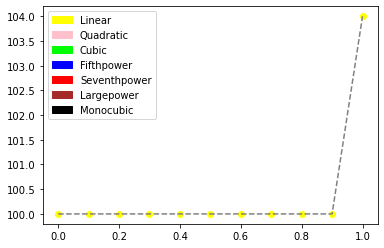

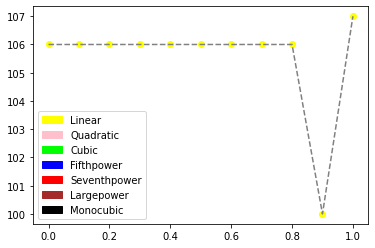

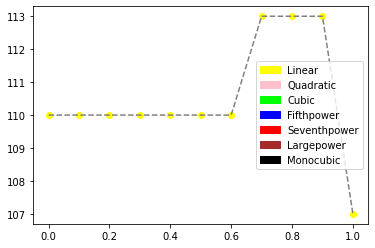

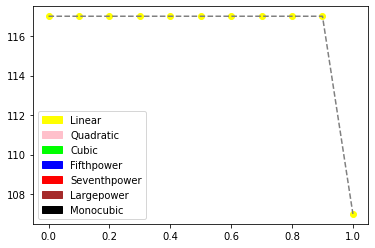

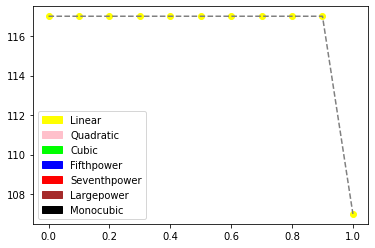

...

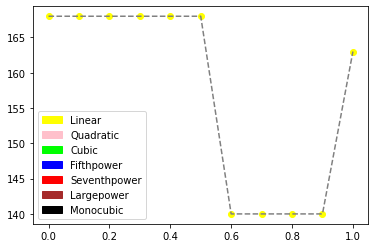

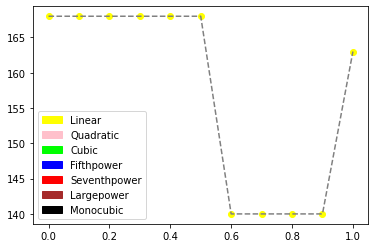

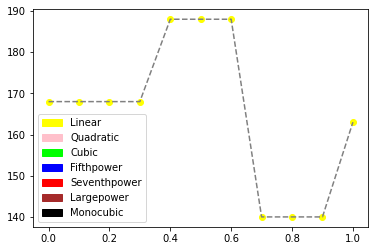

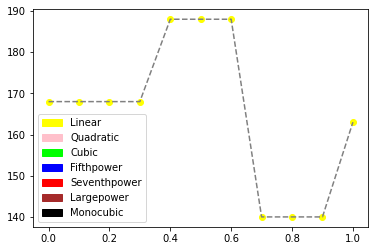

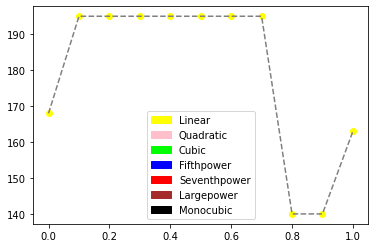

In [41]:
#Here each line represents a different matrix(from 100 to the maximum number of parition points)
#Here x-axis is value of a(the weight), and y-axis is the number of points in a partition
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import math
Colorlist=['yellow','pink','lime','blue','red','brown','black']
Interpoltionlist=['Linear','Quadratic','Cubic','Fifthpower','Seventhpower','Largepower','Monocubic']
MinNuPoint=100
MaxNuPoint=200
#Creating the range of A###########################################
e=0.1
n=int(1/e)
A=[]
for i in range(n+1):
    A.append(i*e)
###################################################################
Step=5
CutNuPoint=200
NuInt=6
#Loading the tables################################################
Timetable=np.load('TmatrixLinear1000j10.npy')
Errortable=np.load('EmatrixLinear1000j10.npy')
Decodetimetable=np.load('DecodeLinear1000j10.npy')
Partition=np.load('CountLinear1000j10.npy')
#Removing the monocubic##################################################################################
Timetable=np.delete(Timetable,6,1)
Errortable=np.delete(Errortable,6,1)
Decodetimetable=np.delete(Decodetimetable,6,1)
#########################################################################################################
#Creating list of CutNuPoint#######################################
E=[]
m=int((MaxNuPoint-MinNuPoint)/Step)
for i in range(m):
    E.append(MinNuPoint+Step*(i+1))
###################################################################
for n in (E):
    CutNuPoint=n
    NuPar=CutNuPoint-MinNuPoint
    RestrictedTimetable=np.zeros((NuPar,NuInt))
    RestrictedErrortable=np.zeros((NuPar,NuInt))
    for i in range(NuPar):
        for j in range(NuInt):
            RestrictedTimetable[i][j]=Timetable[i][j]
            RestrictedErrortable[i][j]=Errortable[i][j]
    X=[]
    Y=[]
    for a in (A):
        Totaltable=a*RestrictedTimetable+(1-a)*RestrictedErrortable
        Min=np.min(Totaltable)
        for k in range(NuPar):
            for p in range(NuInt):
                if Totaltable[k][p] == Min:
                    x=100+k
                    X.append(x)
                    y=a
                    Y.append(y)
                    plt.scatter(y,x,color= Colorlist[p] )
    plt.plot(Y,X,color = 'grey', linestyle = 'dashed')
    patches=[]
    for i in range(7):
        patch=mpatches.Patch(color=Colorlist[i], label=Interpoltionlist[i])
        patches.append(patch)
    plt.legend(handles=patches)
    plt.show()

[ 1.          3.16905656  1.6486553   4.72051613  6.03912036 14.64910661
  1.93878598]
[1.51483489e+01 1.25906017e+00 1.41321586e+00 9.16324045e+02
 2.14198561e+03 2.69270083e+05 1.00000000e+00]


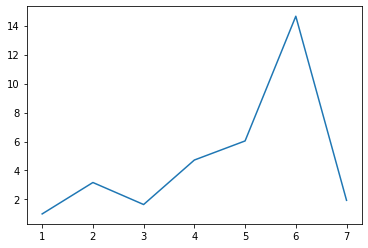

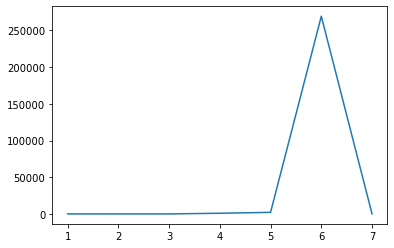

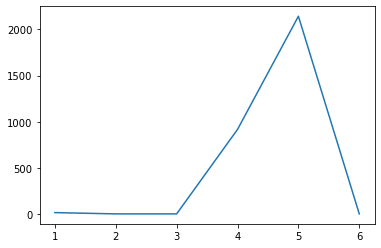

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import math
EncodingTimetable=[0.00048747, 0.00154482, 0.00080367, 0.00230111, 0.00294389, 0.007141,
  0.0009451 ]
Encoding=EncodingTimetable/np.min(EncodingTimetable)
print(Encoding)
ErrorTable=[5.61017309e-05, 4.66291445e-06, 5.23382819e-06, 3.39359525e-03,
  7.93281834e-03, 9.97238566e-01, 3.70348816e-06]
ErrorTableless=[5.61017309e-05, 4.66291445e-06, 5.23382819e-06, 3.39359525e-03,
  7.93281834e-03, 3.70348816e-06]
ErrorTable=ErrorTable/np.min(ErrorTable)
ErrorTableless=ErrorTableless/np.min(ErrorTableless)
print(ErrorTable)
X=[1,2,3,4,5,6,7]
Z=[1,2,3,4,5,6]
plt.plot(X,Encoding)
plt.show()
plt.plot(X,ErrorTable)
plt.show()
plt.plot(Z,ErrorTableless)

In [1]:
#Combining trig & linear to generate Time & Errortables, but this time the jump between partiion is different than 1
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.interpolate import lagrange
from scipy.integrate import quad
from scipy.interpolate import make_interp_spline
from scipy.interpolate import splrep
from scipy.interpolate import PchipInterpolator
from scipy.interpolate import BarycentricInterpolator as baryinterpolation
#Generating a partition
Finite=20               #Maximum number of coefficients of a function
NuFuncTrig=0               #Number of functions made by trigs
NuFuncLinear=40
NuFunc=NuFuncTrig+NuFuncLinear
NuPoints=100
MaxNuPoint=400           #Max Number of points in partition
Count=100            #Min Number of points in partition 
Jump=1                #The jump in terms of points between each 2 partitions
#epsilon=1000  #Allowed error
#Lip=[0]*(NuFunc) #Lipschizt value 
z=np.linspace(0,1,1000)
n=np.load('n.npy')
a=np.load('a.npy')
b=np.load('b.npy')
Point=np.load('Point.npy')
Value=np.load('Value.npy')
NuPar=MaxNuPoint-Count
print('The number of Partitions is:', NuPar)
Partition=[]
PartitionList=[]
Timetable=np.zeros((NuPar,7))
DecodeTimetable=np.zeros((NuPar,7))
Errortable=np.zeros((NuPar,7))
#Generating a partition with the allowed error(epsilon)
for p in range(NuPar):
    step=1/Count
    X=[0]
    count=1
    x=0
####Defining the time arrays#####################################################
    timelinear=[]
    timequadratic=[]
    timecubic=[]
    timefifthpower=[]
    timeseventhpower=[]
    timelargepower=[]
#    timebaryinterpolation=[]
    timemonocubic=[]
#Generating partition#############################################################
    while (x<1-step):
        x=x+step
        X.append(x)
        count=count+1
    X.append(1)
    PartitionList.append(X)
    count=count+1
    Count+=Jump
    #Computing the values at the partition points#################################
    Partition.append(Count)
    Y=np.zeros((NuFuncTrig+NuFuncLinear,count))
    start=time.time()
    for i in range(NuFuncTrig):
        for j in range(count):
            for k in range(Finite):
                Y[i][j]=Y[i][j]+a[i][k]*np.cos(n[i][k]*X[j])+b[i][k]*np.sin(n[i][k]*X[j])
    end=time.time()
    encodetime=end-start
    for i in range(NuFuncLinear):
        f=interp1d(Point[i],Value[i], kind='linear')
        start=time.time()
        k=i+NuFuncTrig
        for j in range(count):
            Y[k][j]=f(X[j])
        end=time.time()
        encodetime+=end-start
#####Interpolation & cost##################################################################
    ilinear=[0]*(NuFunc)
    iquadratic=[0]*(NuFunc)
    icubic=[0]*(NuFunc)
    ififthpower=[0]*(NuFunc)
    iseventhpower=[0]*(NuFunc)
    ilargepower=[0]*(NuFunc)
#    ibaryinterpolation=[0]*NuFunc
    imonocubic=[0]*(NuFunc)
####Defining the functions#################################################################    
    for i in range(NuFuncTrig):
        def f(x):
            y=0
            for j in range(Finite):
                y=y+a[i][j]*np.cos(n[i][j]*x)+b[i][j]*np.sin(n[i][j]*x)
            return(y)
########Computing the cost##################################################################
        #Linear##############################################################
        start = time.time()
        Linear=interp1d(X,Y[i], kind='linear')
        end = time.time()
        timelinear.append(end-start)
        #Quadratic###########################################################
        start = time.time()
        quadratic=make_interp_spline(X, Y[i], k=2, t=None, bc_type=None, axis=0)
        end = time.time()
        timequadratic.append(end-start)
        #Cubic###############################################################
        start = time.time()
        Cubic=CubicSpline(X,Y[i], bc_type='natural')
        end = time.time()
        timecubic.append(end-start)
        #fifthpower###############################################################
        start = time.time()
        fifthpower=make_interp_spline(X, Y[i], k=5, t=None, bc_type=None, axis=0)
        end = time.time()
        timefifthpower.append(end-start)
        #seventhpower###############################################################
        start = time.time()
        seventhpower=make_interp_spline(X, Y[i], k=7, t=None, bc_type=None, axis=0)
        end = time.time()
        timeseventhpower.append(end-start)
        #largepower###############################################################
        start = time.time()
        largepower=make_interp_spline(X, Y[i], k=17, t=None, bc_type=None, axis=0)
        end = time.time()
        timelargepower.append(end-start)
#        #Baryinterpolation########################################################
#        start = time.time()
#        Baryinterpolation=baryinterpolation(X,Y[i])
#        end = time.time()
#        timebaryinterpolation.append(end-start)
        #monocubic###############################################################
        start = time.time()
        monocubic=PchipInterpolator(X,Y[i], axis=0, extrapolate=None)
        end = time.time()
        timemonocubic.append(end-start)
        #Define the error####################################################
        def Flinear(x):
            return(pow(f(x)-Linear(x),2))
        def Fquadratic(x):
            return(pow(f(x)-quadratic(x),2))
        def Fcubic(x):
            return(pow(f(x)-Cubic(x),2))
        def Ffifthpower(x):
            return(pow(f(x)-fifthpower(x),2))
        def Fseventhpower(x):
            return(pow(f(x)-seventhpower(x),2))
        def Flargepower(x):
            return(pow(f(x)-largepower(x),2))
#        def Fbaryinterpolation(x):
#            return(pow(f(x)-Baryinterpolation(x),2))
        def Fmonocubic(x):
            return(pow(f(x)-monocubic(x),2))
        #Taking the error####################################################
        ilinear[i]= pow(quad(Flinear,0,1)[0],0.5)
        iquadratic[i]= pow(quad(Fquadratic,0,1)[0],0.5)
        icubic[i] = pow(quad(Fcubic,0,1)[0],0.5)
        ififthpower[i] = pow(quad(Ffifthpower,0,1)[0],0.5)
        iseventhpower[i] = pow(quad(Fseventhpower,0,1)[0],0.5)
        ilargepower[i] = pow(quad(Flargepower,0,1)[0],0.5)
#        ibaryinterpolation[i] = pow(quad(Fbaryinterpolation,0,1)[0],0.5)
        imonocubic[i] = pow(quad(Fmonocubic,0,1)[0],0.5)
####Defining the functions#################################################################    
    for i in range(NuFuncTrig,NuFunc):
        f=interp1d(Point[i-NuFuncTrig],Value[i-NuFuncTrig], kind='linear')
########Computing the cost##################################################################
        #Linear##############################################################
        start = time.time()
        Linear=interp1d(X,Y[i], kind='linear')
        end = time.time()
        timelinear.append(end-start)
        #Quadratic###########################################################
        start = time.time()
        quadratic=make_interp_spline(X, Y[i], k=2, t=None, bc_type=None, axis=0)
        end = time.time()
        timequadratic.append(end-start)
        #Cubic###############################################################
        start = time.time()
        Cubic=CubicSpline(X,Y[i], bc_type='natural')
        end = time.time()
        timecubic.append(end-start)
        #fifthpower###############################################################
        start = time.time()
        fifthpower=make_interp_spline(X, Y[i], k=5, t=None, bc_type=None, axis=0)
        end = time.time()
        timefifthpower.append(end-start)
        #seventhpower###############################################################
        start = time.time()
        seventhpower=make_interp_spline(X, Y[i], k=7, t=None, bc_type=None, axis=0)
        end = time.time()
        timeseventhpower.append(end-start)
        #largepower###############################################################
        start = time.time()
        largepower=make_interp_spline(X, Y[i], k=17, t=None, bc_type=None, axis=0)
        end = time.time()
        timelargepower.append(end-start)
#        #Baryinterpolation########################################################
#        start = time.time()
#        Baryinterpolation=baryinterpolation(X,Y[i])
#        end = time.time()
#        timebaryinterpolation.append(end-start)
        #monocubic###############################################################
        start = time.time()
        monocubic=PchipInterpolator(X,Y[i], axis=0, extrapolate=None)
        end = time.time()
        timemonocubic.append(end-start)
        #Define the error####################################################
        def Flinear(x):
            return(pow(f(x)-Linear(x),2))
        def Fquadratic(x):
            return(pow(f(x)-quadratic(x),2))
        def Fcubic(x):
            return(pow(f(x)-Cubic(x),2))
        def Ffifthpower(x):
            return(pow(f(x)-fifthpower(x),2))
        def Fseventhpower(x):
            return(pow(f(x)-seventhpower(x),2))
        def Flargepower(x):
            return(pow(f(x)-largepower(x),2))
#        def Fbaryinterpolation(x):
#            return(pow(f(x)-Baryinterpolation(x),2))
        def Fmonocubic(x):
            return(pow(f(x)-monocubic(x),2))
        #Taking the error####################################################
        ilinear[i]= pow(quad(Flinear,0,1)[0],0.5)
        iquadratic[i]= pow(quad(Fquadratic,0,1)[0],0.5)
        icubic[i] = pow(quad(Fcubic,0,1)[0],0.5)
        ififthpower[i] = pow(quad(Ffifthpower,0,1)[0],0.5)
        iseventhpower[i] = pow(quad(Fseventhpower,0,1)[0],0.5)
        ilargepower[i] = pow(quad(Flargepower,0,1)[0],0.5)
#        ibaryinterpolation[i] = pow(quad(Fbaryinterpolation,0,1)[0],0.5)
        imonocubic[i] = pow(quad(Fmonocubic,0,1)[0],0.5)
#####Finding the mean error###################################################################   
    #Linear#############################################
    Ilinear=np.mean(ilinear)
    Errortable[p][0]=Ilinear
    #Quadratic#############################################
    Iquadratic=np.mean(iquadratic)
    Errortable[p][1]=Iquadratic
    #Cubic#############################################
    Icubic=np.mean(icubic)
    Errortable[p][2]=Icubic
    #Fifthpower#############################################
    Ififthpower=np.mean(ififthpower)
    Errortable[p][3]=Ififthpower
    #Fifthpower#############################################
    Iseventhpower=np.mean(iseventhpower)
    Errortable[p][4]=Iseventhpower
    #largepower#############################################
    Ilargepower=np.mean(ilargepower)
    Errortable[p][5]=Ilargepower
#    #baryinterpolation#############################################
#    Ibaryinterpolation=np.mean(ibaryinterpolation)
#    Errortable[p][6]=Ibaryinterpolation
    #monocubic#############################################
    Imonocubic=np.mean(imonocubic)
    Errortable[p][6]=Imonocubic
####DecodeTimetable##################################################################################
    DecodeTimetable[p][0]=np.mean(timelinear)
    DecodeTimetable[p][1]=np.mean(timequadratic)
    DecodeTimetable[p][2]=np.mean(timecubic)
    DecodeTimetable[p][3]=np.mean(timefifthpower)
    DecodeTimetable[p][4]=np.mean(timeseventhpower)
    DecodeTimetable[p][5]=np.mean(timelargepower)
#    DecodeTimetable[p][6]=np.mean(timebaryinterpolation)
    DecodeTimetable[p][6]=np.mean(timemonocubic)
####Timetable##################################################################################
    Timetable[p][0]=encodetime+np.mean(timelinear)
    Timetable[p][1]=encodetime+np.mean(timequadratic)
    Timetable[p][2]=encodetime+np.mean(timecubic)
    Timetable[p][3]=encodetime+np.mean(timefifthpower)
    Timetable[p][4]=encodetime+np.mean(timeseventhpower)
    Timetable[p][5]=encodetime+np.mean(timelargepower)
#    Timetable[p][6]=encodetime+np.mean(timebaryinterpolation)
    Timetable[p][6]=encodetime+np.mean(timemonocubic)
#Print & save###############################################
plt.show()
print('Partition count list')
print(Partition)
print('Partition list')
PartitionList=np.array(PartitionList, dtype=object)
print(PartitionList)
#################
print('Time table')
print(Timetable)
print('Errortable')
print(Errortable)
print('Encode Time table')
print(DecodeTimetable)
################################################################################
np.save('TmatrixLinear300.npy', Timetable)
np.save('EmatrixLinear300.npy', Errortable)
np.save('CountLinear300.npy', Partition)
np.save('ListLinear300.npy', PartitionList)
np.save('DecodeLinear300.npy', DecodeTimetable)

The number of Partitions is: 300


<ipython-input-1-ced831b4181e>:225: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  ilinear[i]= pow(quad(Flinear,0,1)[0],0.5)
<ipython-input-1-ced831b4181e>:226: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpo

Partition count list
[101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296

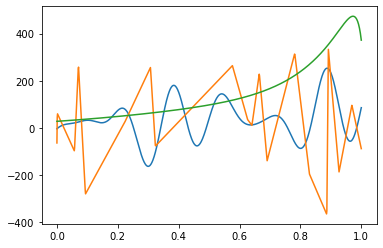

Linear encoding time for trig is  29.74987030029297
Linear decode time for trig function is  0.0
Cubic Spline decode time for trig function is  0.0
--------------------------------------------------------------------------
Encoding time for linear is  0.0
Linear decode time for linear is  10.104179382324219
Cubic Spline decode time for linear is  0.0
--------------------------------------------------------------------------
Encoding time for poly is  0.0
Linear decode time for polynomial is  9.832382202148438
Cubic Spline decode time for polynomial is  0.0
 
 
 
----------------------------------------------------------------------------


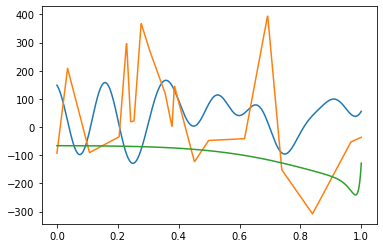

Linear encoding time for trig is  39.89219665527344
Linear decode time for trig function is  9.813308715820312
Cubic Spline decode time for trig function is  9.97304916381836
--------------------------------------------------------------------------
Encoding time for linear is  0.0
Linear decode time for linear is  0.0
Cubic Spline decode time for linear is  9.970664978027344
--------------------------------------------------------------------------
Encoding time for poly is  0.0
Linear decode time for polynomial is  9.97304916381836
Cubic Spline decode time for polynomial is  0.0
 
 
 
----------------------------------------------------------------------------


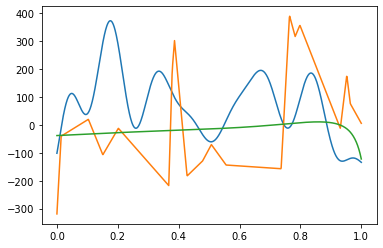

Linear encoding time for trig is  19.786357879638672
Linear decode time for trig function is  10.004043579101562
Cubic Spline decode time for trig function is  0.0
--------------------------------------------------------------------------
Encoding time for linear is  0.0
Linear decode time for linear is  0.0
Cubic Spline decode time for linear is  0.0
--------------------------------------------------------------------------
Encoding time for poly is  0.0
Linear decode time for polynomial is  0.0
Cubic Spline decode time for polynomial is  10.027885437011719
 
 
 
----------------------------------------------------------------------------


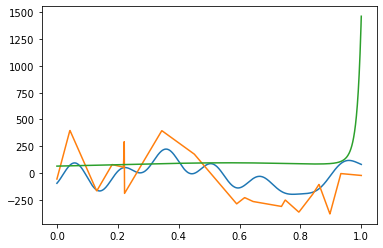

Linear encoding time for trig is  40.12107849121094
Linear decode time for trig function is  0.0
Cubic Spline decode time for trig function is  0.0
--------------------------------------------------------------------------
Encoding time for linear is  0.0
Linear decode time for linear is  0.0
Cubic Spline decode time for linear is  0.0
--------------------------------------------------------------------------
Encoding time for poly is  10.111331939697266
Linear decode time for polynomial is  0.0
Cubic Spline decode time for polynomial is  0.0
 
 
 
----------------------------------------------------------------------------


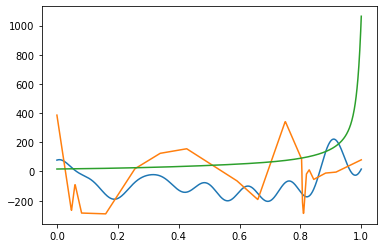

Linear encoding time for trig is  19.92940902709961
Linear decode time for trig function is  0.0
Cubic Spline decode time for trig function is  0.0
--------------------------------------------------------------------------
Encoding time for linear is  0.0
Linear decode time for linear is  10.025501251220703
Cubic Spline decode time for linear is  9.980201721191406
--------------------------------------------------------------------------
Encoding time for poly is  0.0
Linear decode time for polynomial is  0.0
Cubic Spline decode time for polynomial is  0.0
 
 
 
----------------------------------------------------------------------------


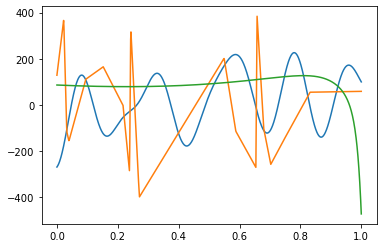

Linear encoding time for trig is  29.914379119873047
Linear decode time for trig function is  0.0
Cubic Spline decode time for trig function is  9.903907775878906
--------------------------------------------------------------------------
Encoding time for linear is  0.0
Linear decode time for linear is  9.95635986328125
Cubic Spline decode time for linear is  0.0
--------------------------------------------------------------------------
Encoding time for poly is  0.0
Linear decode time for polynomial is  0.0
Cubic Spline decode time for polynomial is  9.975433349609375
 
 
 
----------------------------------------------------------------------------


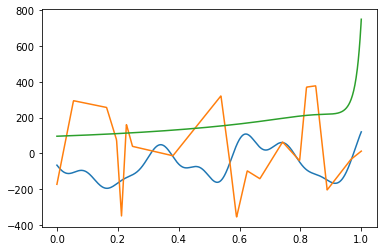

Linear encoding time for trig is  19.91748809814453
Linear decode time for trig function is  0.0
Cubic Spline decode time for trig function is  0.0
--------------------------------------------------------------------------
Encoding time for linear is  0.0
Linear decode time for linear is  0.0
Cubic Spline decode time for linear is  0.0
--------------------------------------------------------------------------
Encoding time for poly is  0.0
Linear decode time for polynomial is  0.0
Cubic Spline decode time for polynomial is  10.478496551513672
 
 
 
----------------------------------------------------------------------------


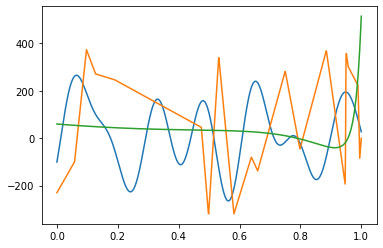

Linear encoding time for trig is  29.92868423461914
Linear decode time for trig function is  0.0
Cubic Spline decode time for trig function is  10.082721710205078
--------------------------------------------------------------------------
Encoding time for linear is  0.0
Linear decode time for linear is  0.0
Cubic Spline decode time for linear is  9.860992431640625
--------------------------------------------------------------------------
Encoding time for poly is  0.0
Linear decode time for polynomial is  0.0
Cubic Spline decode time for polynomial is  9.984970092773438
 
 
 
----------------------------------------------------------------------------


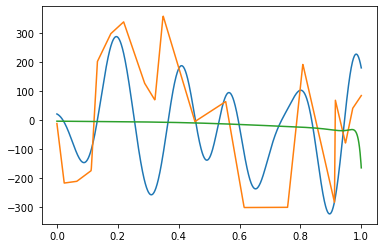

Linear encoding time for trig is  29.59728240966797
Linear decode time for trig function is  0.0
Cubic Spline decode time for trig function is  0.0
--------------------------------------------------------------------------
Encoding time for linear is  0.0
Linear decode time for linear is  0.0
Cubic Spline decode time for linear is  10.366439819335938
--------------------------------------------------------------------------
Encoding time for poly is  0.0
Linear decode time for polynomial is  0.0
Cubic Spline decode time for polynomial is  0.0
 
 
 
----------------------------------------------------------------------------


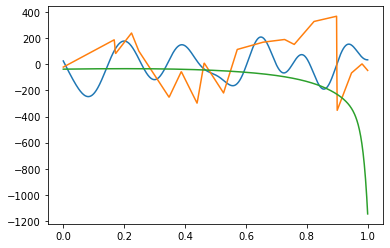

Linear encoding time for trig is  39.8707389831543
Linear decode time for trig function is  0.0
Cubic Spline decode time for trig function is  10.132789611816406
--------------------------------------------------------------------------
Encoding time for linear is  0.0
Linear decode time for linear is  0.0
Cubic Spline decode time for linear is  9.818077087402344
--------------------------------------------------------------------------
Encoding time for poly is  0.0
Linear decode time for polynomial is  0.0
Cubic Spline decode time for polynomial is  0.0
 
 
 
----------------------------------------------------------------------------


In [30]:
import time
import numpy as np
import matplotlib.pyplot as plt
import math
import colorama
from colorama import Fore
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.interpolate import lagrange
from scipy.integrate import quad
from scipy.interpolate import make_interp_spline
from scipy.interpolate import splrep
from scipy.interpolate import PchipInterpolator
from scipy.interpolate import BarycentricInterpolator as baryinterpolation
for qa in range(10):
    #################################################################################
    #Trig function###################################################################
    #################################################################################
    #Generating a partition
    Finite=20               #Maximum number of coefficients of a function
    NuFuncTrig=1              #Number of functions
    z=np.linspace(0,1,1000)
    n=np.zeros((NuFuncTrig,Finite))
    a=np.zeros((NuFuncTrig,Finite))
    b=np.zeros((NuFuncTrig,Finite))
    #Generating the coefficients of random continuous functions
    for i in range (NuFuncTrig):
        for j in range (Finite):
            n[i][j]=np.random.randint(-50,50)
            a[i][j]=np.random.uniform(low=-50, high=50, size=None)
            b[i][j]=np.random.uniform(low=-50, high=50, size=None)
    #        Lip[i]=Lip[i]+abs(n[i][j])*(abs(a[i][j])+abs(b[i][j]))
    for i in range(NuFuncTrig):
        def f(x):
            y=0
            for j in range(Finite):
                y=y+a[i][j]*np.cos(n[i][j]*x)+b[i][j]*np.sin(n[i][j]*x)
            return(y)
        plt.plot(z,f(z))
    #plt.show()
    #################################################################################
    #Linear function#################################################################
    #################################################################################
    NuFuncLinear=1
    NuPoints=20
    Point=np.zeros((NuFuncLinear,NuPoints))
    Value=np.zeros((NuFuncLinear,NuPoints))
    for i in range(NuFuncLinear):
        X=[]
        for j in range(NuPoints-2):
            X.append(np.random.uniform(low=0, high=1, size=None))
            Y=np.random.uniform(low=-400, high=400, size=None)
            Value[i][j]=Y
        X.append(0)
        X.append(1)
        X=np.sort(X, axis=-1, kind=None, order=None)
        Point[i]=X
        Value[i][NuPoints-2]=np.random.uniform(low=-100, high=100, size=None)
        Value[i][NuPoints-1]=np.random.uniform(low=-100, high=100, size=None)#
    for i in range(NuFuncLinear):
        f=interp1d(Point[i],Value[i], kind='linear')
        plt.plot(z,f(z))
    #plt.show()
    #################################################################################
    #Polynomial######################################################################
    #################################################################################
    NuFuncPoly=1
    NuTerms=100
    #Generating the coefficients for the polynomials
    #Power=np.random.randint(low=0, high=50,size=(NuFuncPoly,NuTerms))
    Coefficient=np.random.randint(low=-100,high=100,size=(NuFuncPoly,NuTerms))
    Coefficient=Coefficient[0]
    p = np.poly1d(Coefficient)
    #def p(x):
    #    y=np.dot(Coefficient[0],np.power(x,Power[0]))   
    #    y=0
    #    for j in range(NuTerms):
    #        y+=Coefficient[0][j]*np.power(x,Power[0][j])
    #    return(y)
    plt.plot(z,p(z))
    plt.show()
    #Generating a partition############################################################
    Count=100
    Step=1/Count
    X=[0]
    x=0
    NuPoint=1
    while (x<1-2*Step):
        x+=Step
        NuPoint+=1
        X.append(x)    
    X.append(1)
    NuPoint+=1
    #print(X)
    #print(NuPoint)
    #Encode time for trig functions####################################################
    Y=np.zeros(NuPoint)
    start = time.time()
    for i in range(NuPoint):
        Y[i]=f(X[i])
    end = time.time()
    encodetrig= 10000*(end-start)
    print('Linear encoding time for trig is ', encodetrig)
    #Decode time for trig functions####################################################
    start = time.time()
    Linear=interp1d(X,Y, kind='linear')
    end = time.time()
    Decodelinear=10000*(end-start)
    print('Linear decode time for trig function is ',Decodelinear)
    ###################################################################################
    start = time.time()
    Cubic=CubicSpline(X,Y, bc_type='natural')
    end = time.time()
    Decodetrig = 10000*(end-start)
    print('Cubic Spline decode time for trig function is ',Decodetrig)
    print('--------------------------------------------------------------------------')
    #Encode time for linear functions##################################################
    Point=Point[0]
    Value=Value[0]
    Y=np.zeros(NuPoint)
    l=interp1d(Point,Value, kind='linear')
    start = time.time()
    #for i in range(NuPoint):
    #    Y[i]=l(X[i])
    Y=l(X)
    end = time.time()
    encodelinear= 10000*(end-start)
    print('Encoding time for linear is ', encodelinear)
    #Decode time for linear####################################################
    start = time.time()
    Linear=interp1d(X,Y, kind='linear')
    end = time.time()
    Decodelinear=10000*(end-start)
    print('Linear decode time for linear is ',Decodelinear)
    #plt.plot(z,Linear(z))
    #plt.show()
    ###################################################################################
    start = time.time()
    Cubic=CubicSpline(X,Y, bc_type='natural')
    end = time.time()
    Decodetrig = 10000*(end-start)
    print('Cubic Spline decode time for linear is ',Decodetrig)
    #plt.plot(z,Cubic(z))
    #plt.show()
    print('--------------------------------------------------------------------------')
    #Encode time for polynomial########################################################
    Y=np.zeros(NuPoint)
    start = time.time()
    #for i in range(NuPoint):
    #    x=X[i]
    #    Y[i]=p(x)
    Y=p(X)
    end = time.time()
    encodepoly= 10000*(end-start)
    print('Encoding time for poly is ', encodepoly)
    #Decode time for polynomial####################################################
    start = time.time()
    Linear=interp1d(X,Y, kind='linear')    
    end = time.time()
    Decodelinear=10000*(end-start)
    print('Linear decode time for polynomial is ',Decodelinear)
    #plt.plot(z,Linear(z))
    #plt.show()
    ###################################################################################
    start = time.time()
    Cubic=CubicSpline(X,Y, bc_type='natural')
    end = time.time()
    Decodetrig = 10000*(end-start)
    print('Cubic Spline decode time for polynomial is ',Decodetrig)
    print(' ')
    print(' ')
    print(' ')
    print('----------------------------------------------------------------------------')

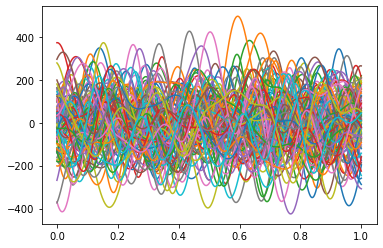

0.011313402652740478


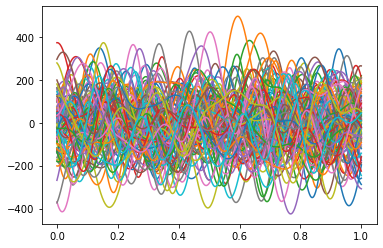

0.0006769037246704101
done


In [19]:
#Generating coefficients for trig functions
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.integrate import quad
#Generating a partition
Finite=20               #Maximum number of coefficients of a function
NuFuncTrig=100               #Number of functions
z=np.linspace(0,1,1000)
n=np.zeros((NuFuncTrig,Finite))
a=np.zeros((NuFuncTrig,Finite))
b=np.zeros((NuFuncTrig,Finite))
#Generating the coefficients of random continuous functions
for i in range (NuFuncTrig):
    for j in range (Finite):
        n[i][j]=np.random.randint(-50,50)
        a[i][j]=np.random.uniform(low=-50, high=50, size=None)
        b[i][j]=np.random.uniform(low=-50, high=50, size=None)
#        Lip[i]=Lip[i]+abs(n[i][j])*(abs(a[i][j])+abs(b[i][j]))
#Saving the coefficients
np.save('n.npy', n)
np.save('a.npy', a)
np.save('b.npy', b)
#n=np.array(n)
#a=np.array(a)
#b=np.array(b)
timeloop=[]
for i in range(NuFuncTrig):
    def f(x):
        y=sum(np.array(a[i])*np.cos(x*np.array(n[i]))+np.array(b[i])*np.sin(x*np.array(n[i])))
        return(y)
    Y=[]
    start = time.time()
    for Z in (z):
        Y.append(f(Z))
    end = time.time()
    timeadd = end - start
    timeloop.append(timeadd)
    plt.plot(z,Y)    
plt.show()
print(np.mean(timeloop))
timesingle=[]
for i in range(NuFuncTrig):
    def g(x):
        y=0
        for j in range(Finite):
            y=y+a[i][j]*np.cos(n[i][j]*x)+b[i][j]*np.sin(n[i][j]*x)
        return(y)
    start = time.time()
    Y=g(z)
    end = time.time()
    timeadd = end - start
    timesingle.append(timeadd)
    plt.plot(z,Y)
plt.show()
print(np.mean(timesingle))
print('done')

In [37]:
#Combining trig & linear to generate Time & Errortables, but this time the jump between partiion is different than 1, and faster encoding
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.interpolate import lagrange
from scipy.integrate import quad
from scipy.interpolate import make_interp_spline
from scipy.interpolate import splrep
from scipy.interpolate import PchipInterpolator
from scipy.interpolate import BarycentricInterpolator as baryinterpolation
#Generating a partition
Finite=20               #Maximum number of coefficients of a function
NuFuncTrig=0               #Number of functions made by trigs
NuFuncLinear=40
NuFuncPoly=0
NuFunc=NuFuncTrig+NuFuncLinear+NuFuncPoly
NuPoints=100
MaxNuPoint=1100           #Max Number of points in partition
Count=1000            #Min Number of points in partition 
Jump=5                #The jump in terms of points between each 2 partitions
#epsilon=1000  #Allowed error
#Lip=[0]*(NuFunc) #Lipschizt value 
z=np.linspace(0,1,1000)
n=np.load('n.npy')
a=np.load('a.npy')
b=np.load('b.npy')
Point=np.load('Point.npy')
Value=np.load('Value.npy')
Coefficient=np.load('Coefficient.npy')
NuPar=MaxNuPoint-Count
print('The number of Partitions is:', NuPar)
Partition=[]
PartitionList=[]
Timetable=np.zeros((NuPar,7))
DecodeTimetable=np.zeros((NuPar,7))
Errortable=np.zeros((NuPar,7))
#Generating a partition with the allowed error(epsilon)
for p in range(NuPar):
    step=1/Count
    X=[0]
    count=1
    x=0
####Defining the time arrays#####################################################
    timelinear=[]
    timequadratic=[]
    timecubic=[]
    timefifthpower=[]
    timeseventhpower=[]
    timelargepower=[]
#    timebaryinterpolation=[]
    timemonocubic=[]
#Generating partition#############################################################
    while (x<1-step):
        x=x+step
        X.append(x)
        count=count+1
    X.append(1)
    PartitionList.append(X)
    X=np.array(X)
    count=count+1
    Count+=Jump
    #Computing the values at the partition points#################################
    Partition.append(Count)
    encodetime=0
    Y=np.zeros((NuFuncTrig+NuFuncLinear+NuFuncPoly,count))
    for i in range(NuFuncTrig):
        def f(x):
            y=0
            for j in range(Finite):
                y=y+a[i][j]*np.cos(n[i][j]*x)+b[i][j]*np.sin(n[i][j]*x)
            return(y)
        start=time.time()
        Y[i]=f(X)
        end=time.time()
        encodetime+=end-start
    for i in range(NuFuncLinear):
        f=interp1d(Point[i],Value[i], kind='linear')
        k=i+NuFuncTrig
        start=time.time()
        Y[k]=f(X)
        end=time.time()
        encodetime+=end-start
    for i in range(NuFuncPoly):
        p = np.poly1d(Coefficient[i])
        h=i+NuFuncTrig+NuFuncLinear
        start=time.time()
        Y[h]=p(X)
        end=time.time()
        encodetime+=end-start
#####Interpolation & cost##################################################################
    ilinear=[0]*(NuFunc)
    iquadratic=[0]*(NuFunc)
    icubic=[0]*(NuFunc)
    ififthpower=[0]*(NuFunc)
    iseventhpower=[0]*(NuFunc)
    ilargepower=[0]*(NuFunc)
#    ibaryinterpolation=[0]*NuFunc
    imonocubic=[0]*(NuFunc)
####Defining the functions#################################################################    
    for i in range(NuFuncTrig):
        def f(x):
            y=0
            for j in range(Finite):
                y=y+a[i][j]*np.cos(n[i][j]*x)+b[i][j]*np.sin(n[i][j]*x)
            return(y)
########Computing the cost##################################################################
        #Linear##############################################################
        start = time.time()
        Linear=interp1d(X,Y[i], kind='linear')
        end = time.time()
        timelinear.append(end-start)
        #Quadratic###########################################################
        start = time.time()
        quadratic=make_interp_spline(X, Y[i], k=2, t=None, bc_type=None, axis=0)
        end = time.time()
        timequadratic.append(end-start)
        #Cubic###############################################################
        start = time.time()
        Cubic=CubicSpline(X,Y[i], bc_type='natural')
        end = time.time()
        timecubic.append(end-start)
        #fifthpower###############################################################
        start = time.time()
        fifthpower=make_interp_spline(X, Y[i], k=5, t=None, bc_type=None, axis=0)
        end = time.time()
        timefifthpower.append(end-start)
        #seventhpower###############################################################
        start = time.time()
        seventhpower=make_interp_spline(X, Y[i], k=7, t=None, bc_type=None, axis=0)
        end = time.time()
        timeseventhpower.append(end-start)
        #largepower###############################################################
        start = time.time()
        largepower=make_interp_spline(X, Y[i], k=17, t=None, bc_type=None, axis=0)
        end = time.time()
        timelargepower.append(end-start)
#        #Baryinterpolation########################################################
#        start = time.time()
#        Baryinterpolation=baryinterpolation(X,Y[i])
#        end = time.time()
#        timebaryinterpolation.append(end-start)
        #monocubic###############################################################
        start = time.time()
        monocubic=PchipInterpolator(X,Y[i], axis=0, extrapolate=None)
        end = time.time()
        timemonocubic.append(end-start)
        #Define the error####################################################
        def Flinear(x):
            return(pow(f(x)-Linear(x),2))
        def Fquadratic(x):
            return(pow(f(x)-quadratic(x),2))
        def Fcubic(x):
            return(pow(f(x)-Cubic(x),2))
        def Ffifthpower(x):
            return(pow(f(x)-fifthpower(x),2))
        def Fseventhpower(x):
            return(pow(f(x)-seventhpower(x),2))
        def Flargepower(x):
            return(pow(f(x)-largepower(x),2))
#        def Fbaryinterpolation(x):
#            return(pow(f(x)-Baryinterpolation(x),2))
        def Fmonocubic(x):
            return(pow(f(x)-monocubic(x),2))
        #Taking the error####################################################
        ilinear[i]= pow(quad(Flinear,0,1)[0],0.5)
        iquadratic[i]= pow(quad(Fquadratic,0,1)[0],0.5)
        icubic[i] = pow(quad(Fcubic,0,1)[0],0.5)
        ififthpower[i] = pow(quad(Ffifthpower,0,1)[0],0.5)
        iseventhpower[i] = pow(quad(Fseventhpower,0,1)[0],0.5)
        ilargepower[i] = pow(quad(Flargepower,0,1)[0],0.5)
#        ibaryinterpolation[i] = pow(quad(Fbaryinterpolation,0,1)[0],0.5)
        imonocubic[i] = pow(quad(Fmonocubic,0,1)[0],0.5)
#Error for Linear Functions##################################################################
####Defining the functions#################################################################    
    for i in range(NuFuncTrig,NuFuncTrig+NuFuncLinear):
        f=interp1d(Point[i-NuFuncTrig],Value[i-NuFuncTrig], kind='linear')
########Computing the cost##################################################################
        #Linear##############################################################
        start = time.time()
        Linear=interp1d(X,Y[i], kind='linear')
        end = time.time()
        timelinear.append(end-start)
        #Quadratic###########################################################
        start = time.time()
        quadratic=make_interp_spline(X, Y[i], k=2, t=None, bc_type=None, axis=0)
        end = time.time()
        timequadratic.append(end-start)
        #Cubic###############################################################
        start = time.time()
        Cubic=CubicSpline(X,Y[i], bc_type='natural')
        end = time.time()
        timecubic.append(end-start)
        #fifthpower###############################################################
        start = time.time()
        fifthpower=make_interp_spline(X, Y[i], k=5, t=None, bc_type=None, axis=0)
        end = time.time()
        timefifthpower.append(end-start)
        #seventhpower###############################################################
        start = time.time()
        seventhpower=make_interp_spline(X, Y[i], k=7, t=None, bc_type=None, axis=0)
        end = time.time()
        timeseventhpower.append(end-start)
        #largepower###############################################################
        start = time.time()
        largepower=make_interp_spline(X, Y[i], k=17, t=None, bc_type=None, axis=0)
        end = time.time()
        timelargepower.append(end-start)
#        #Baryinterpolation########################################################
#        start = time.time()
#        Baryinterpolation=baryinterpolation(X,Y[i])
#        end = time.time()
#        timebaryinterpolation.append(end-start)
        #monocubic###############################################################
        start = time.time()
        monocubic=PchipInterpolator(X,Y[i], axis=0, extrapolate=None)
        end = time.time()
        timemonocubic.append(end-start)
        #Define the error####################################################
        def Flinear(x):
            return(pow(f(x)-Linear(x),2))
        def Fquadratic(x):
            return(pow(f(x)-quadratic(x),2))
        def Fcubic(x):
            return(pow(f(x)-Cubic(x),2))
        def Ffifthpower(x):
            return(pow(f(x)-fifthpower(x),2))
        def Fseventhpower(x):
            return(pow(f(x)-seventhpower(x),2))
        def Flargepower(x):
            return(pow(f(x)-largepower(x),2))
#        def Fbaryinterpolation(x):
#            return(pow(f(x)-Baryinterpolation(x),2))
        def Fmonocubic(x):
            return(pow(f(x)-monocubic(x),2))
        #Taking the error####################################################
        ilinear[i]= pow(quad(Flinear,0,1)[0],0.5)
        iquadratic[i]= pow(quad(Fquadratic,0,1)[0],0.5)
        icubic[i] = pow(quad(Fcubic,0,1)[0],0.5)
        ififthpower[i] = pow(quad(Ffifthpower,0,1)[0],0.5)
        iseventhpower[i] = pow(quad(Fseventhpower,0,1)[0],0.5)
        ilargepower[i] = pow(quad(Flargepower,0,1)[0],0.5)
#        ibaryinterpolation[i] = pow(quad(Fbaryinterpolation,0,1)[0],0.5)
        imonocubic[i] = pow(quad(Fmonocubic,0,1)[0],0.5)
#Error for Polynomial Functions##################################################################
####Defining the functions#################################################################    
    for i in range(NuFuncTrig+NuFuncLinear,NuFuncTrig+NuFuncLinear+NuFuncPoly):
        f=np.poly1d(Coefficient[i-NuFuncTrig-NuFuncLinear])
########Computing the cost##################################################################
        #Linear##############################################################
        start = time.time()
        Linear=interp1d(X,Y[i], kind='linear')
        end = time.time()
        timelinear.append(end-start)
        #Quadratic###########################################################
        start = time.time()
        quadratic=make_interp_spline(X, Y[i], k=2, t=None, bc_type=None, axis=0)
        end = time.time()
        timequadratic.append(end-start)
        #Cubic###############################################################
        start = time.time()
        Cubic=CubicSpline(X,Y[i], bc_type='natural')
        end = time.time()
        timecubic.append(end-start)
        #fifthpower###############################################################
        start = time.time()
        fifthpower=make_interp_spline(X, Y[i], k=5, t=None, bc_type=None, axis=0)
        end = time.time()
        timefifthpower.append(end-start)
        #seventhpower###############################################################
        start = time.time()
        seventhpower=make_interp_spline(X, Y[i], k=7, t=None, bc_type=None, axis=0)
        end = time.time()
        timeseventhpower.append(end-start)
        #largepower###############################################################
        start = time.time()
        largepower=make_interp_spline(X, Y[i], k=17, t=None, bc_type=None, axis=0)
        end = time.time()
        timelargepower.append(end-start)
#        #Baryinterpolation########################################################
#        start = time.time()
#        Baryinterpolation=baryinterpolation(X,Y[i])
#        end = time.time()
#        timebaryinterpolation.append(end-start)
        #monocubic###############################################################
        start = time.time()
        monocubic=PchipInterpolator(X,Y[i], axis=0, extrapolate=None)
        end = time.time()
        timemonocubic.append(end-start)
        #Define the error####################################################
        def Flinear(x):
            return(pow(f(x)-Linear(x),2))
        def Fquadratic(x):
            return(pow(f(x)-quadratic(x),2))
        def Fcubic(x):
            return(pow(f(x)-Cubic(x),2))
        def Ffifthpower(x):
            return(pow(f(x)-fifthpower(x),2))
        def Fseventhpower(x):
            return(pow(f(x)-seventhpower(x),2))
        def Flargepower(x):
            return(pow(f(x)-largepower(x),2))
#        def Fbaryinterpolation(x):
#            return(pow(f(x)-Baryinterpolation(x),2))
        def Fmonocubic(x):
            return(pow(f(x)-monocubic(x),2))
        #Taking the error####################################################
        ilinear[i]= pow(quad(Flinear,0,1)[0],0.5)
        iquadratic[i]= pow(quad(Fquadratic,0,1)[0],0.5)
        icubic[i] = pow(quad(Fcubic,0,1)[0],0.5)
        ififthpower[i] = pow(quad(Ffifthpower,0,1)[0],0.5)
        iseventhpower[i] = pow(quad(Fseventhpower,0,1)[0],0.5)
        ilargepower[i] = pow(quad(Flargepower,0,1)[0],0.5)
#        ibaryinterpolation[i] = pow(quad(Fbaryinterpolation,0,1)[0],0.5)
        imonocubic[i] = pow(quad(Fmonocubic,0,1)[0],0.5)
#####Finding the mean error###################################################################   
    #Linear#############################################
    Ilinear=np.mean(ilinear)
    Errortable[p][0]=Ilinear
    #Quadratic#############################################
    Iquadratic=np.mean(iquadratic)
    Errortable[p][1]=Iquadratic
    #Cubic#############################################
    Icubic=np.mean(icubic)
    Errortable[p][2]=Icubic
    #Fifthpower#############################################
    Ififthpower=np.mean(ififthpower)
    Errortable[p][3]=Ififthpower
    #Fifthpower#############################################
    Iseventhpower=np.mean(iseventhpower)
    Errortable[p][4]=Iseventhpower
    #largepower#############################################
    Ilargepower=np.mean(ilargepower)
    Errortable[p][5]=Ilargepower
#    #baryinterpolation#############################################
#    Ibaryinterpolation=np.mean(ibaryinterpolation)
#    Errortable[p][6]=Ibaryinterpolation
    #monocubic#############################################
    Imonocubic=np.mean(imonocubic)
    Errortable[p][6]=Imonocubic
####DecodeTimetable##################################################################################
    DecodeTimetable[p][0]=np.mean(timelinear)
    DecodeTimetable[p][1]=np.mean(timequadratic)
    DecodeTimetable[p][2]=np.mean(timecubic)
    DecodeTimetable[p][3]=np.mean(timefifthpower)
    DecodeTimetable[p][4]=np.mean(timeseventhpower)
    DecodeTimetable[p][5]=np.mean(timelargepower)
#    DecodeTimetable[p][6]=np.mean(timebaryinterpolation)
    DecodeTimetable[p][6]=np.mean(timemonocubic)
####Timetable##################################################################################
    Timetable[p][0]=encodetime+np.mean(timelinear)
    Timetable[p][1]=encodetime+np.mean(timequadratic)
    Timetable[p][2]=encodetime+np.mean(timecubic)
    Timetable[p][3]=encodetime+np.mean(timefifthpower)
    Timetable[p][4]=encodetime+np.mean(timeseventhpower)
    Timetable[p][5]=encodetime+np.mean(timelargepower)
#    Timetable[p][6]=encodetime+np.mean(timebaryinterpolation)
    Timetable[p][6]=encodetime+np.mean(timemonocubic)
#Print & save###############################################
plt.show()
print('Partition count list')
print(Partition)
print('Partition list')
PartitionList=np.array(PartitionList, dtype=object)
print(PartitionList)
#################
print('Time table')
print(Timetable)
print('Errortable')
print(Errortable)
print('Encode Time table')
print(DecodeTimetable)
################################################################################
np.save('TmatrixLinear1000j10.npy', Timetable)
np.save('EmatrixLinear1000j10.npy', Errortable)
np.save('CountLinear1000j10.npy', Partition)
np.save('ListLinear1000j10.npy', PartitionList)
np.save('DecodeLinear1000j10.npy', DecodeTimetable)

The number of Partitions is: 100


<ipython-input-37-19d47e204036>:240: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  iquadratic[i]= pow(quad(Fquadratic,0,1)[0],0.5)
<ipython-input-37-19d47e204036>:241: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  icubic[i] = pow(quad(Fcubic,0,1)[0],0.5)
<ipython-input-37-19d47e204036>:242: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be det

Partition count list
[1005, 1010, 1015, 1020, 1025, 1030, 1035, 1040, 1045, 1050, 1055, 1060, 1065, 1070, 1075, 1080, 1085, 1090, 1095, 1100, 1105, 1110, 1115, 1120, 1125, 1130, 1135, 1140, 1145, 1150, 1155, 1160, 1165, 1170, 1175, 1180, 1185, 1190, 1195, 1200, 1205, 1210, 1215, 1220, 1225, 1230, 1235, 1240, 1245, 1250, 1255, 1260, 1265, 1270, 1275, 1280, 1285, 1290, 1295, 1300, 1305, 1310, 1315, 1320, 1325, 1330, 1335, 1340, 1345, 1350, 1355, 1360, 1365, 1370, 1375, 1380, 1385, 1390, 1395, 1400, 1405, 1410, 1415, 1420, 1425, 1430, 1435, 1440, 1445, 1450, 1455, 1460, 1465, 1470, 1475, 1480, 1485, 1490, 1495, 1500]
Partition list
[list([0, 0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009000000000000001, 0.010000000000000002, 0.011000000000000003, 0.012000000000000004, 0.013000000000000005, 0.014000000000000005, 0.015000000000000006, 0.016000000000000007, 0.017000000000000008, 0.01800000000000001, 0.01900000000000001, 0.02000000000000001, 0.02100000000000001, 0.0220000000000

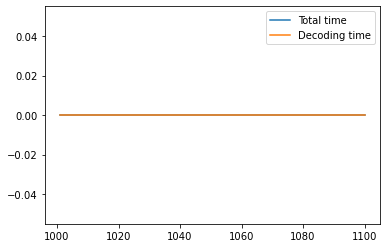

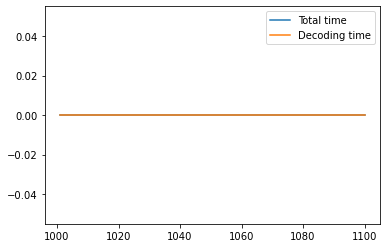

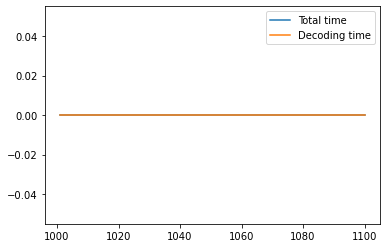

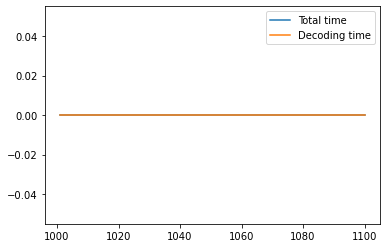

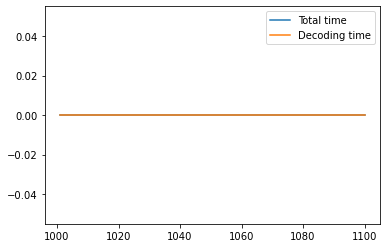

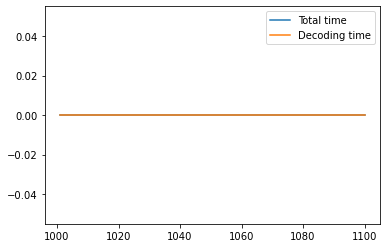

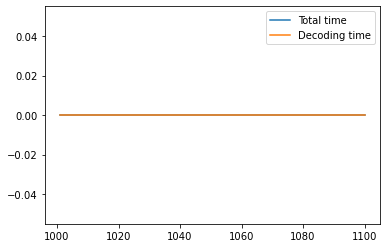

In [46]:
import numpy as np
from matplotlib import pyplot as plt
Timetable = np.load('TmatrixPoly1000.npy')
Errortable = np.load('EmatrixPoly1000.npy')
Decodetimetable=np.load('DecodePoly1000.npy')
partitioncount = np.load('CountPoly1000.npy')
Colorlist=['yellow','pink','lime','blue','red','brown','black']
Interpoltionlist=['Linear','Quadratic','Cubic','Fifthpower','Seventhpower','Largepower','Monocubic']
MinPar=1000
MaxPar=1100
NuPar=MaxPar-MinPar
Encodetimetable=Timetable-Decodetimetable
for i in range(7):
    #plt_1 = plt.figure(figsize=(15, 10))
    Y=[]
    for j in range(NuPar):
        Y.append(Timetable[j][i])
    plt.plot(partitioncount,Y,label='Total time')
    Y=[]
    for j in range(NuPar):
        Y.append(Encodetimetable[j][i])
    #plt.plot(partitioncount,Y,label='Encoding time')
    Y=[]
    for j in range(NuPar):
        Y.append(Decodetimetable[j][i])
    plt.plot(partitioncount,Y,label='Decoding time')
    plt.legend(loc="upper right")
    #plt.title(Interpoltionlist[i])
    plt.show()

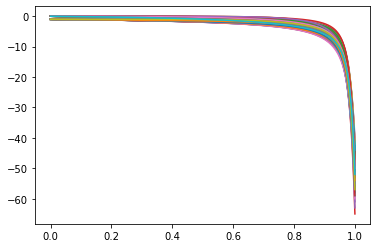

In [11]:
#Generating the coefficients of 
import time
import numpy as np
import matplotlib.pyplot as plt
import math
z=np.linspace(0,1,1000)
NuFuncPoly=100
NuTerms=100
Coefficient=np.random.randint(low=-1,high=1,size=(NuFuncPoly,NuTerms))
for i in range(NuFuncPoly):
    p = np.poly1d(Coefficient[i])
    plt.plot(z,p(z))
plt.show()
np.save('CoefficientTest.npy',Coefficient)

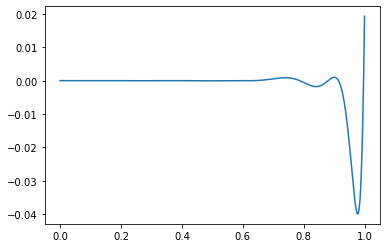

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import math
z=np.linspace(0,1,1000)
NuFuncPoly=5
NuTerms=20
Coefficient=10000
Roots=np.random.uniform(low=-1,high=1,size=(NuFuncPoly,NuTerms))
def f(x):
    y=1
    for i in range(NuTerms):
        y*=(x-Roots[0][i])
    y*=Coefficient    
    return(y)
plt.plot(z,f(z))
#plt.ylim([-1,1])
plt.show()

Totaltable= 0 *Timetable+ 1 *Errortable
[ 9 81  6  4  0  0  0]


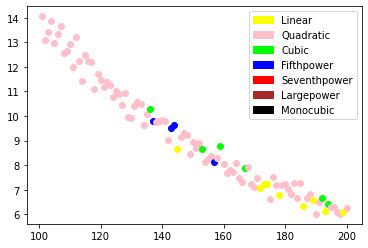

Totaltable= 0.05 *Timetable+ 0.95 *Errortable
[ 9 81  6  4  0  0  0]


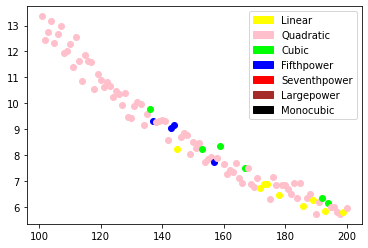

Totaltable= 0.1 *Timetable+ 0.9 *Errortable
[ 9 81  6  4  0  0  0]


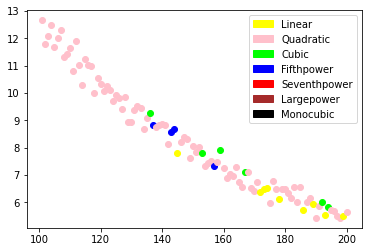

Totaltable= 0.15000000000000002 *Timetable+ 0.85 *Errortable
[ 9 81  6  4  0  0  0]


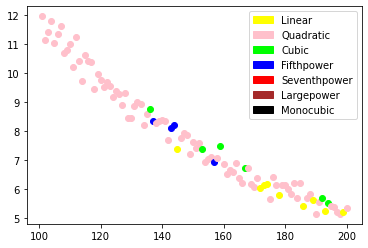

Totaltable= 0.2 *Timetable+ 0.8 *Errortable
[ 9 81  6  4  0  0  0]


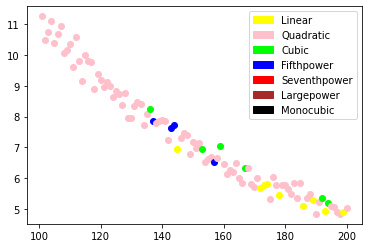

Totaltable= 0.25 *Timetable+ 0.75 *Errortable
[ 9 81  6  4  0  0  0]


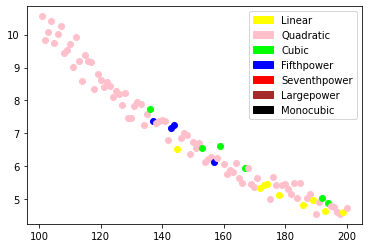

Totaltable= 0.3 *Timetable+ 0.7 *Errortable
[ 9 81  6  4  0  0  0]


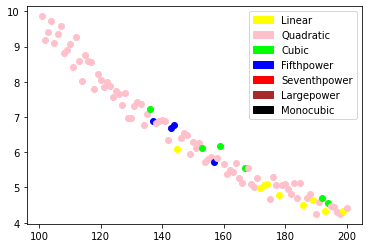

Totaltable= 0.35 *Timetable+ 0.65 *Errortable
[ 9 81  6  4  0  0  0]


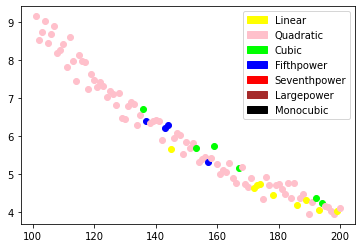

Totaltable= 0.39999999999999997 *Timetable+ 0.6000000000000001 *Errortable
[ 9 81  6  4  0  0  0]


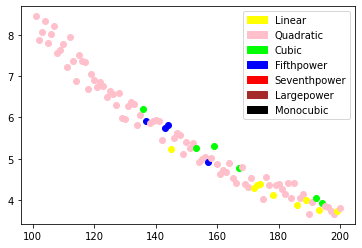

Totaltable= 0.44999999999999996 *Timetable+ 0.55 *Errortable
[ 9 81  6  4  0  0  0]


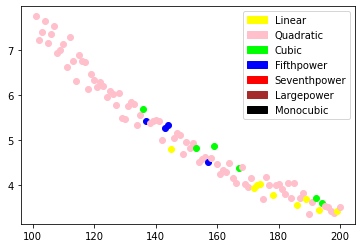

Totaltable= 0.49999999999999994 *Timetable+ 0.5 *Errortable
[ 9 81  6  4  0  0  0]


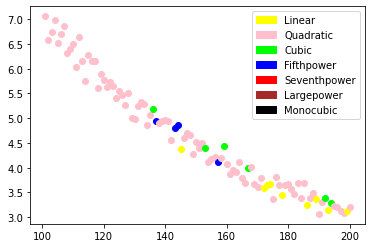

Totaltable= 0.5499999999999999 *Timetable+ 0.45000000000000007 *Errortable
[ 9 81  6  4  0  0  0]


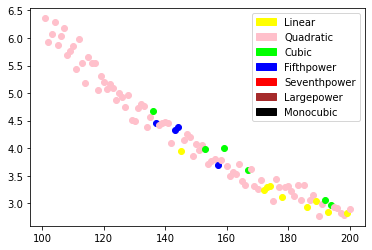

Totaltable= 0.6 *Timetable+ 0.4 *Errortable
[ 9 81  6  4  0  0  0]


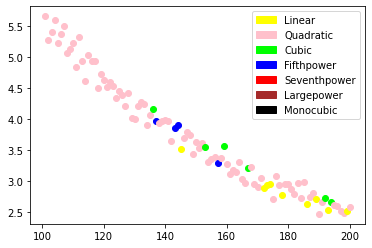

Totaltable= 0.65 *Timetable+ 0.35 *Errortable
[ 9 81  6  4  0  0  0]


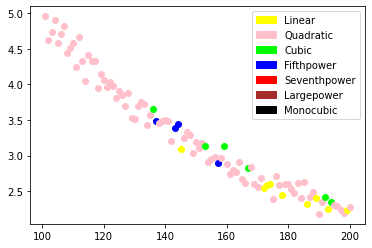

Totaltable= 0.7000000000000001 *Timetable+ 0.29999999999999993 *Errortable
[ 9 81  6  4  0  0  0]


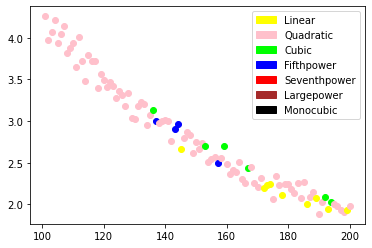

Totaltable= 0.7500000000000001 *Timetable+ 0.2499999999999999 *Errortable
[ 9 81  6  4  0  0  0]


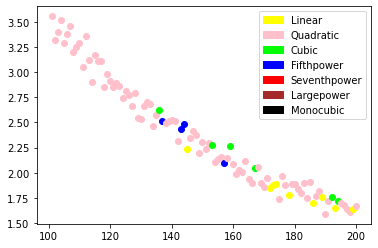

Totaltable= 0.8000000000000002 *Timetable+ 0.19999999999999984 *Errortable
[ 9 81  6  4  0  0  0]


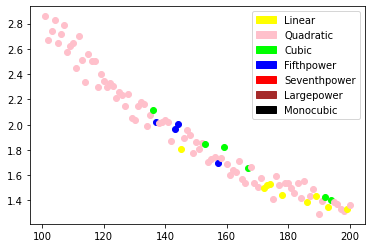

Totaltable= 0.8500000000000002 *Timetable+ 0.1499999999999998 *Errortable
[ 9 81  6  4  0  0  0]


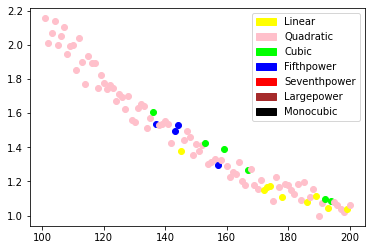

Totaltable= 0.9000000000000002 *Timetable+ 0.09999999999999976 *Errortable
[ 9 81  6  4  0  0  0]


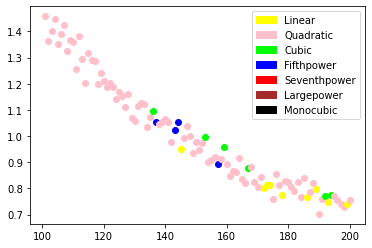

Totaltable= 0.9500000000000003 *Timetable+ 0.04999999999999971 *Errortable
[10 80  6  4  0  0  0]


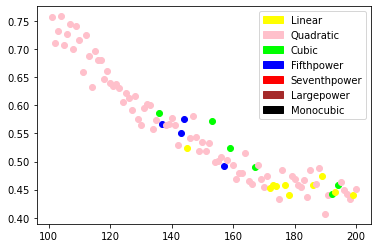

Totaltable= 1 *Timetable+ 0 *Errortable
[88  0  4  4  4  0  0]


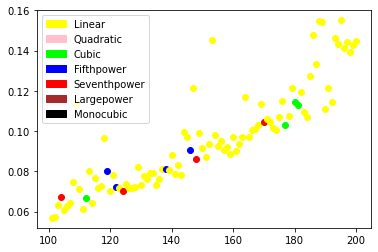

In [17]:
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches
Colorlist=['yellow','pink','lime','blue','red','brown','black']
Interpoltionlist=['Linear','Quadratic','Cubic','Fifthpower','Seventhpower','Largepower','Monocubic']
Timeconstant=1
Errorconstant=1
Timetable = np.load('TmatrixLinear.npy')
Timetable = Timetable*Timeconstant
Errortable = np.load('EmatrixLinear.npy')
Errortable = Errortable*Errorconstant
Decodetimetable=np.load('DecodeLinear.npy')
partitioncount = np.load('CountLinear.npy')
#Removing the monocubic##################################################################################
Timetable=np.delete(Timetable,6,1)
Errortable=np.delete(Errortable,6,1)
Decodetimetable=np.delete(Decodetimetable,6,1)
#########################################################################################################
MinPar=1000
MaxPar=1100
NuInt=6
NuPar=MaxPar-MinPar
i=0
e=0.05
A=[]
while i < 1:
    A.append(i)
    i=i+e
A.append(1)
for a in (A):
    CountTable=np.array([0,0,0,0,0,0,0])
    b=1-a
    Totaltable=a*Timetable+b*Errortable
    print('Totaltable=',a,'*Timetable+',b,'*Errortable')
    for i in range(NuPar):
        for j in range(NuInt):
            if Totaltable[i][j]==np.min(Totaltable[i]):
                CountTable[j]+=1
                x=partitioncount[i]
                if j==0:
                    plt.scatter(x,Totaltable[i][j],color= 'yellow' )
                if j==1:
                    plt.scatter(x,Totaltable[i][j],color= 'pink' )
                if j==2:
                    plt.scatter(x,Totaltable[i][j],color= 'lime' )
                if j==3:
                    plt.scatter(x,Totaltable[i][j],color= 'blue' )
                if j==4:
                    plt.scatter(x,Totaltable[i][j],color= 'red' )
                if j==5:
                    plt.scatter(x,Totaltable[i][j],color= 'brown' )
#                if j==6:
#                    plt.scatter(x,Totaltable[i][j],color= 'black' )
            else:
                pass
    print(CountTable)
    patches=[]
    for i in range(7):
        patch=mpatches.Patch(color=Colorlist[i], label=Interpoltionlist[i])
        patches.append(patch)
    plt.legend(handles=patches)
    plt.show()

Totaltable= 0 *Timetable+ 1 *Errortable


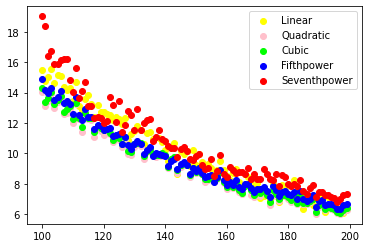

Totaltable= 0.1 *Timetable+ 0.9 *Errortable


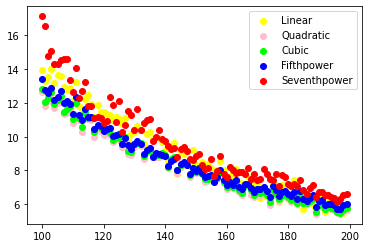

Totaltable= 0.2 *Timetable+ 0.8 *Errortable


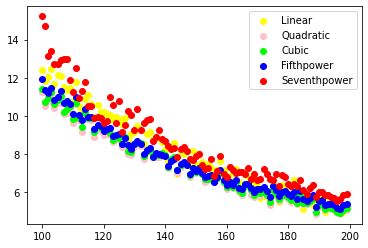

Totaltable= 0.30000000000000004 *Timetable+ 0.7 *Errortable


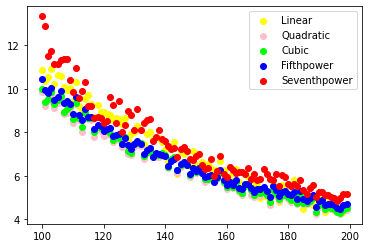

Totaltable= 0.4 *Timetable+ 0.6 *Errortable


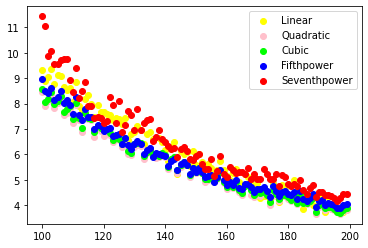

Totaltable= 0.5 *Timetable+ 0.5 *Errortable


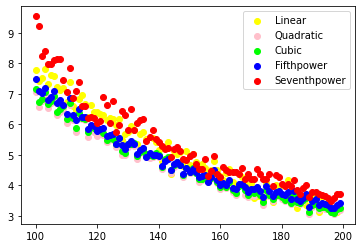

Totaltable= 0.6 *Timetable+ 0.4 *Errortable


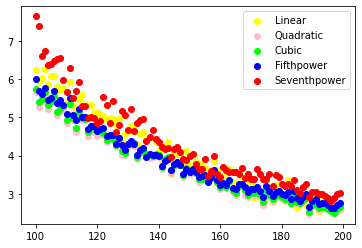

Totaltable= 0.7 *Timetable+ 0.30000000000000004 *Errortable


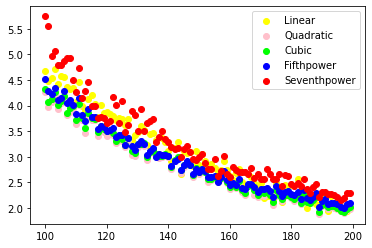

Totaltable= 0.7999999999999999 *Timetable+ 0.20000000000000007 *Errortable


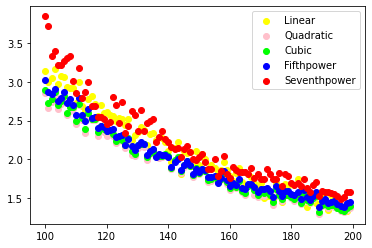

Totaltable= 0.8999999999999999 *Timetable+ 0.10000000000000009 *Errortable


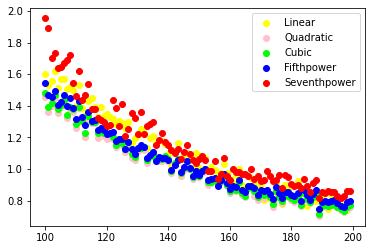

Totaltable= 0.9999999999999999 *Timetable+ 1.1102230246251565e-16 *Errortable


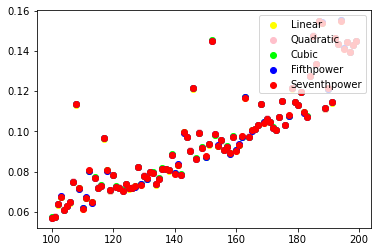

Totaltable= 1 *Timetable+ 0 *Errortable


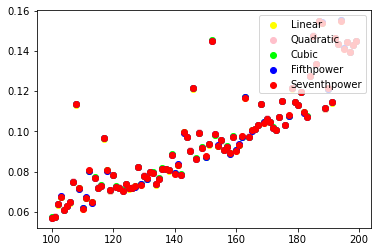

In [16]:
#Graph:x-axis is number of points in the partition, while y-axis is the value.
import numpy as np
from matplotlib import pyplot as plt
Timetable = np.load('TmatrixLinear.npy')
Errortable = np.load('EmatrixLinear.npy')
Decodetimetable=np.load('DecodeLinear.npy')
partitioncount = np.load('CountLinear.npy')
MinPar=100
MaxPar=200
NuPar=MaxPar-MinPar
#plt_1 = plt.figure(figsize=(15, 10))
i=0
e=0.1
A=[]
while i < 1:
    A.append(i)
    i=i+e
A.append(1)
for a in (A):
    b=1-a
    Totaltable=a*Timetable+b*Errortable
    print('Totaltable=',a,'*Timetable+',b,'*Errortable')
    ###############################################
    x=[]
    y=[]
    for i in range(NuPar):
        x.append(Totaltable[i][0])
        y.append(100+i)
    plt.scatter(y,x, color= 'yellow', label='Linear')
    #plt.plot(y,x,color = 'grey', linestyle = 'dashed')
    plt.legend(loc="upper right")
    #plt.show()
    ###############################################
    #plt_2 = plt.figure(figsize=(15, 15))
    x=[]
    y=[]
    for i in range(NuPar):
        x.append(Totaltable[i][1])
        y.append(100+i)
    plt.scatter(y,x, color= 'pink', label='Quadratic')
    #plt.plot(y,x,color = 'grey', linestyle = 'dashed')
    plt.legend(loc="upper right")
    #plt.show()
    ###############################################
    #plt_3 = plt.figure(figsize=(15, 15))
    x=[]
    y=[]
    for i in range(NuPar):
        x.append(Totaltable[i][2])
        y.append(100+i)
    plt.scatter(y,x, color= 'lime', label='Cubic')
    #plt.plot(y,x,color = 'grey', linestyle = 'dashed')
    plt.legend(loc="upper right")
    #plt.show()
    ###############################################
    #plt_3 = plt.figure(figsize=(15, 15))
    x=[]
    y=[]
    for i in range(NuPar):
        x.append(Totaltable[i][3])
        y.append(100+i)
    plt.scatter(y,x, color= 'blue', label='Fifthpower')
    #plt.plot(y,x,color = 'grey', linestyle = 'dashed')
    plt.legend(loc="upper right")
    #plt.show()
    ###############################################
    #plt_3 = plt.figure(figsize=(15, 15))
    #x=[]
    #y=[]
    #for i in range(NuPar):
    #    x.append(Totaltable[i][6])
    #    y.append(100+i)
    #plt.scatter(y,x, color= 'indigo', label='lagrange')
    #plt.legend(loc="upper right")
    #plt.show()
    ###############################################
    #plt_3 = plt.figure(figsize=(15, 15))
    x=[]
    y=[]
    for i in range(NuPar):
        x.append(Totaltable[i][4])
        y.append(100+i)
    plt.scatter(y,x, color= 'red', label='Seventhpower')
    #plt.plot(y,x,color = 'grey', linestyle = 'dashed')
    plt.legend(loc="upper right")
    #plt.show()
    #################################################
#    #plt_3 = plt.figure(figsize=(15, 15))
#    x=[]
#    y=[]
#    for i in range(NuPar):
#        x.append(Totaltable[i][5])
#        y.append(100+i)
#    plt.scatter(y,x, color= 'brown', label='Largepower')
#    plt.legend(loc="upper right")
    #plt.show()
    ###############################################
#    #plt_3 = plt.figure(figsize=(15, 15))
#    x=[]
#    y=[]
#    for i in range(NuPar):
#        x.append(Totaltable[i][6])
#        y.append(100+i)
#    plt.scatter(y,x, color= 'black', label='monocubic')
#    #plt.plot(y,x,color = 'grey', linestyle = 'dashed')
#    plt.legend(loc="upper right")
#    #plt.show()
    ###############################################
    plt.show()

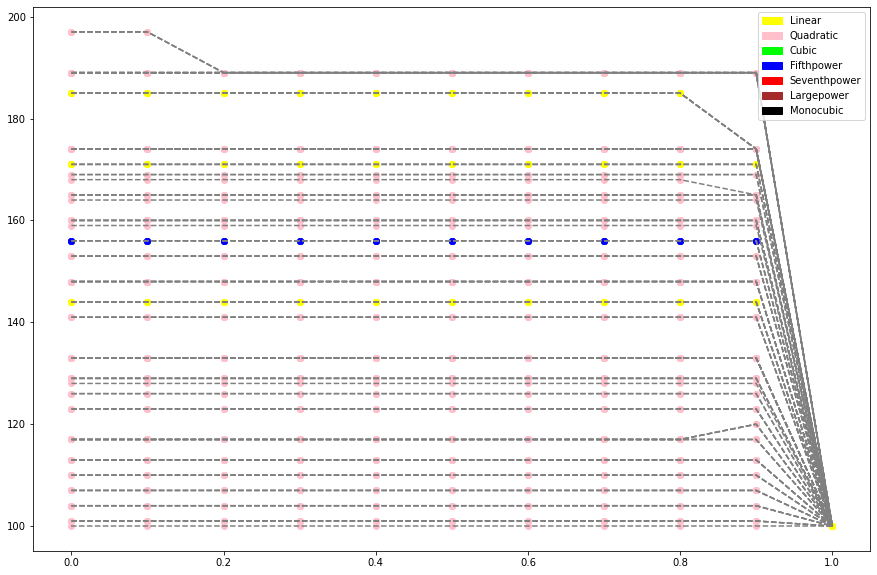

In [3]:
#Here each line represents a different matrix(from 100 to the maximum number of parition points)
#Here x-axis is value of a(the weight), and y-axis is the number of points in a partition
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import math
Colorlist=['yellow','pink','lime','blue','red','brown','black']
Interpoltionlist=['Linear','Quadratic','Cubic','Fifthpower','Seventhpower','Largepower','Monocubic']
plt_1 = plt.figure(figsize=(15, 10))
MinNuPoint=100
MaxNuPoint=200
#Creating the range of A###########################################
e=0.1
n=int(1/e)
A=[]
for i in range(n+1):
    A.append(i*e)
###################################################################
Step=1
CutNuPoint=200
NuInt=6
#Loading the tables################################################
Timetable=np.load('TmatrixLinear.npy')
Errortable=np.load('EmatrixLinear.npy')
Decodetimetable=np.load('DecodeLinear.npy')
Partition=np.load('CountLinear.npy')
#Removing the monocubic##################################################################################
Timetable=np.delete(Timetable,6,1)
Errortable=np.delete(Errortable,6,1)
Decodetimetable=np.delete(Decodetimetable,6,1)
#########################################################################################################
#Creating list of CutNuPoint#######################################
E=[]
m=int((MaxNuPoint-MinNuPoint)/Step)
for i in range(m):
    E.append(MinNuPoint+Step*(i+1))
###################################################################
for n in (E):
    CutNuPoint=n
    NuPar=CutNuPoint-MinNuPoint
    RestrictedTimetable=np.zeros((NuPar,NuInt))
    RestrictedErrortable=np.zeros((NuPar,NuInt))
    for i in range(NuPar):
        for j in range(NuInt):
            RestrictedTimetable[i][j]=Timetable[i][j]
            RestrictedErrortable[i][j]=Errortable[i][j]
    X=[]
    Y=[]
    for a in (A):
        Totaltable=a*RestrictedTimetable+(1-a)*RestrictedErrortable
        Min=np.min(Totaltable)
        for k in range(NuPar):
            for p in range(NuInt):
                if Totaltable[k][p] == Min:
                    x=100+k
                    X.append(x)
                    y=a
                    Y.append(y)
                    plt.scatter(y,x,color= Colorlist[p] )
    plt.plot(Y,X,color = 'grey', linestyle = 'dashed')
patches=[]
for i in range(7):
    patch=mpatches.Patch(color=Colorlist[i], label=Interpoltionlist[i])
    patches.append(patch)
plt.legend(handles=patches)
plt.show()

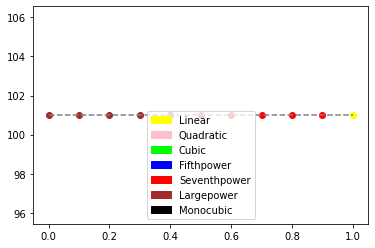

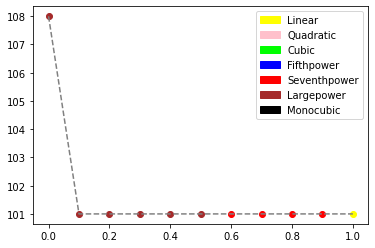

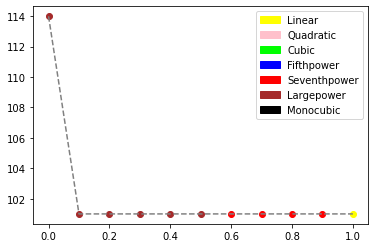

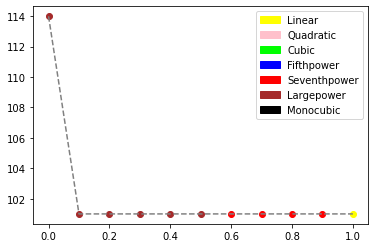

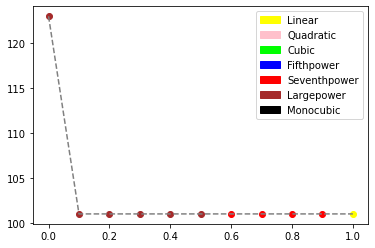

...

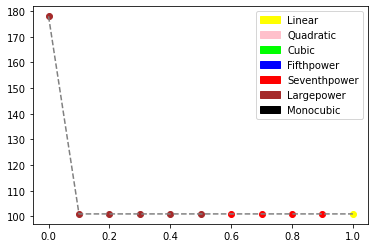

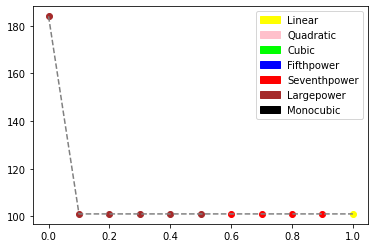

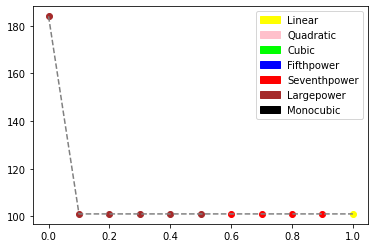

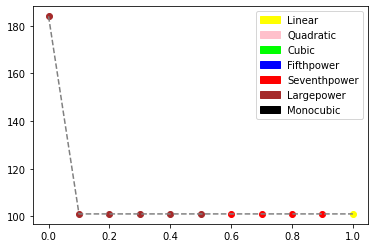

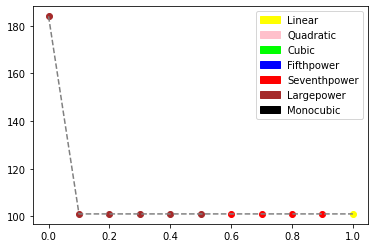

In [12]:
#Here each line represents a different matrix(from 100 to the maximum number of parition points)
#Here x-axis is value of a(the weight), and y-axis is the number of points in a partition
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import math
Colorlist=['yellow','pink','lime','blue','red','brown','black']
Interpoltionlist=['Linear','Quadratic','Cubic','Fifthpower','Seventhpower','Largepower','Monocubic']
MinNuPoint=100
MaxNuPoint=200
#Creating the range of A###########################################
e=0.1
n=int(1/e)
A=[]
for i in range(n+1):
    A.append(i*e)
###################################################################
Step=5
CutNuPoint=200
NuInt=6
#Loading the tables################################################
Timetable=np.load('TmatrixTrig.npy')
Errortable=np.load('EmatrixTrig.npy')
Decodetimetable=np.load('DecodeTrig.npy')
Partition=np.load('CountTrig.npy')
#Removing the monocubic##################################################################################
Timetable=np.delete(Timetable,6,1)
Errortable=np.delete(Errortable,6,1)
Decodetimetable=np.delete(Decodetimetable,6,1)
#########################################################################################################
#Creating list of CutNuPoint#######################################
E=[]
m=int((MaxNuPoint-MinNuPoint)/Step)
for i in range(m):
    E.append(MinNuPoint+Step*(i+1))
###################################################################
for n in (E):
    CutNuPoint=n
    NuPar=CutNuPoint-MinNuPoint
    RestrictedTimetable=np.zeros((NuPar,NuInt))
    RestrictedErrortable=np.zeros((NuPar,NuInt))
    for i in range(NuPar):
        for j in range(NuInt):
            RestrictedTimetable[i][j]=Timetable[i][j]
            RestrictedErrortable[i][j]=Errortable[i][j]
    X=[]
    Y=[]
    for a in (A):
        Totaltable=a*RestrictedTimetable+(1-a)*RestrictedErrortable
        Min=np.min(Totaltable)
        for k in range(NuPar):
            for p in range(NuInt):
                if Totaltable[k][p] == Min:
                    x=100+k
                    X.append(x)
                    y=a
                    Y.append(y)
                    plt.scatter(y,x,color= Colorlist[p] )
    plt.plot(Y,X,color = 'grey', linestyle = 'dashed')
    patches=[]
    for i in range(7):
        patch=mpatches.Patch(color=Colorlist[i], label=Interpoltionlist[i])
        patches.append(patch)
    plt.legend(handles=patches)
    plt.show()

0 *Timetable+ 1 Errortable


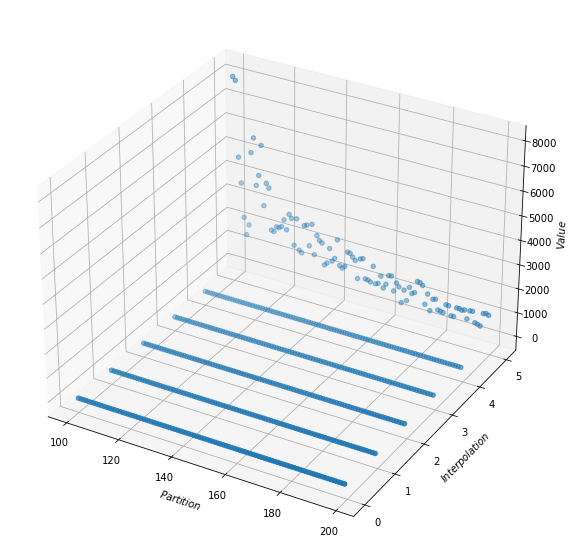

0.1 *Timetable+ 0.9 Errortable


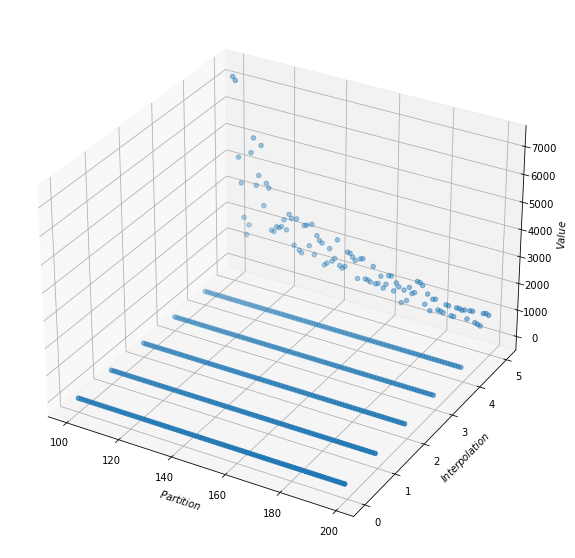

0.2 *Timetable+ 0.8 Errortable


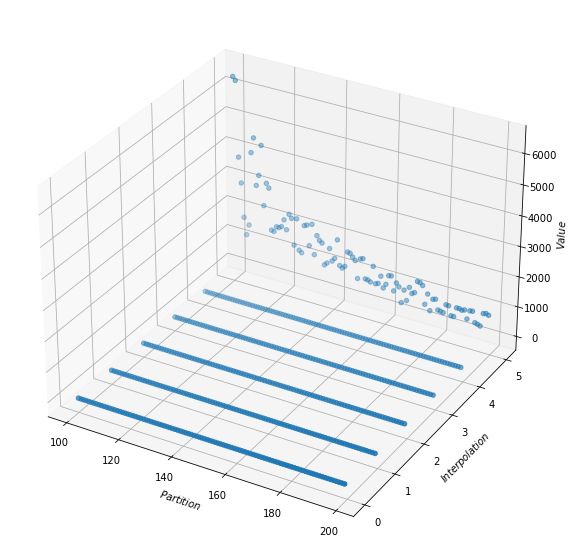

0.30000000000000004 *Timetable+ 0.7 Errortable


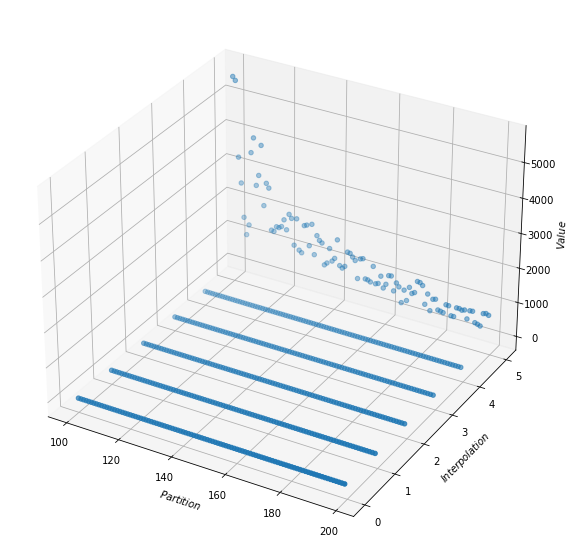

0.4 *Timetable+ 0.6 Errortable


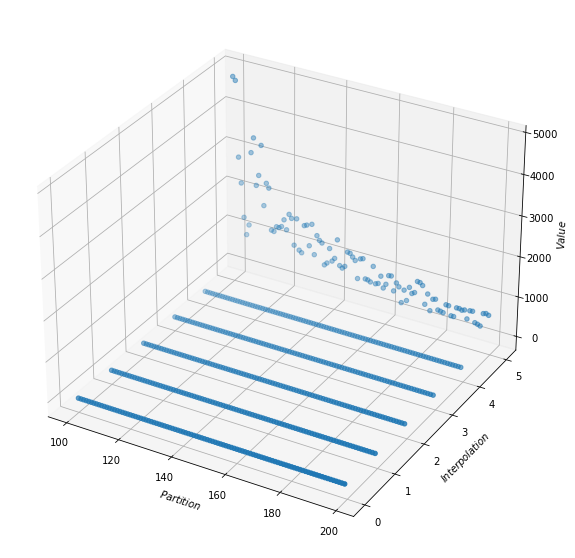

0.5 *Timetable+ 0.5 Errortable


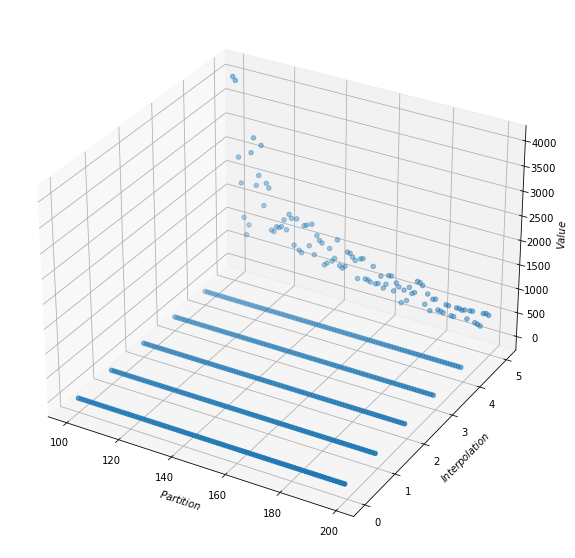

0.6 *Timetable+ 0.4 Errortable


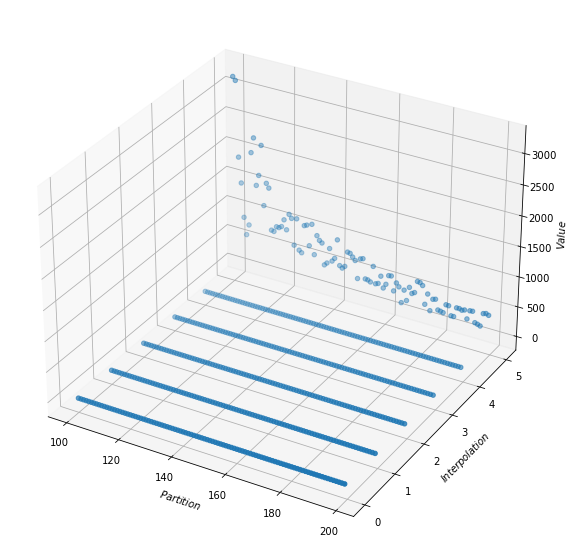

0.7 *Timetable+ 0.30000000000000004 Errortable


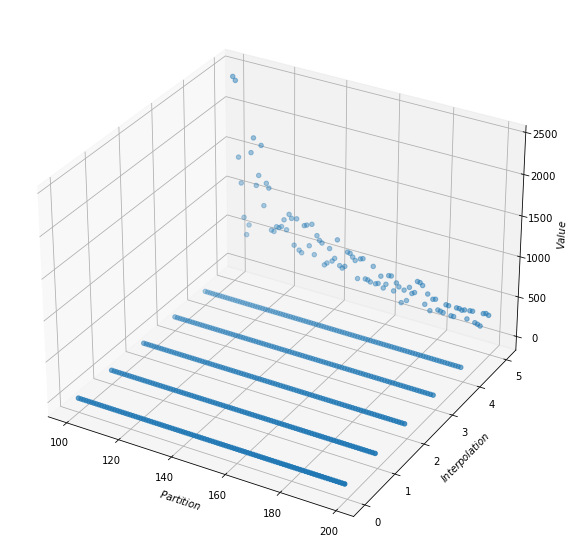

0.7999999999999999 *Timetable+ 0.20000000000000007 Errortable


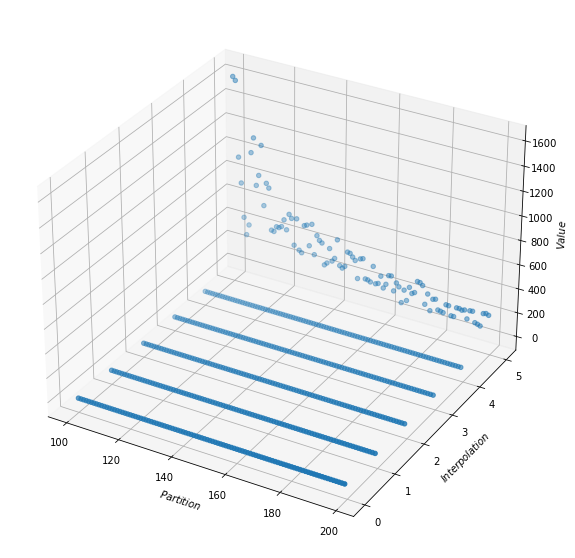

0.8999999999999999 *Timetable+ 0.10000000000000009 Errortable


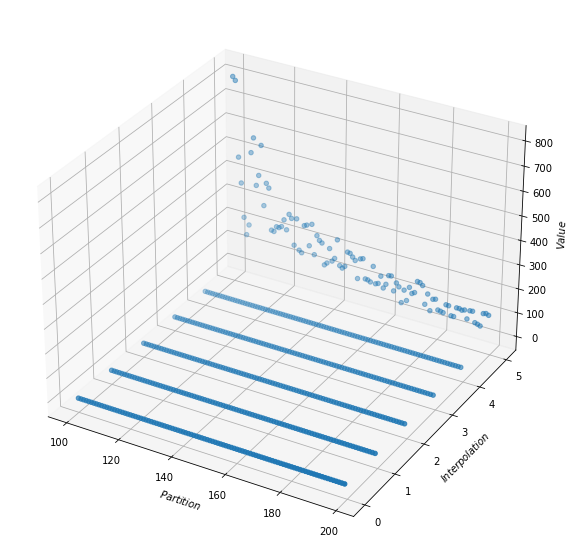

0.9999999999999999 *Timetable+ 1.1102230246251565e-16 Errortable


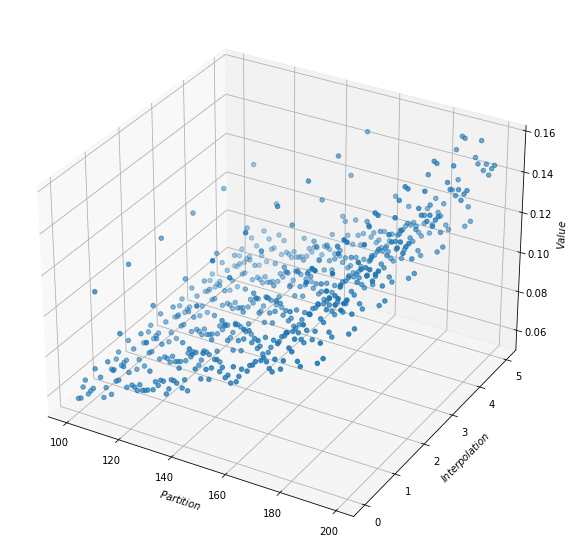

1 *Timetable+ 0 Errortable


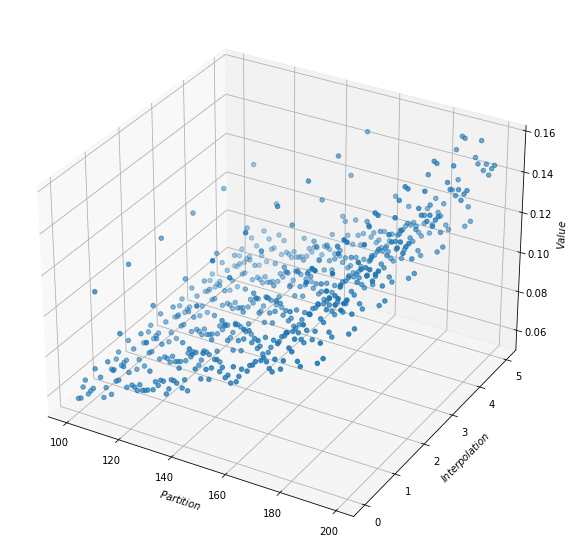

In [15]:
#3d scattered graph
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import math
MinPar=100
MaxPar=200
NuPar=MaxPar-MinPar
NuInt=6
#fig = plt.figure(figsize=(12,10))
#ax = plt.axes(projection='3d')
Timetable=np.load('TmatrixLinear.npy')
Errortable=np.load('EmatrixLinear.npy')
Decodetimetable=np.load('DecodeLinear.npy')
Partition=np.load('CountLinear.npy')
#Removing the monocubic##################################################################################
Timetable=np.delete(Timetable,6,1)
Errortable=np.delete(Errortable,6,1)
Decodetimetable=np.delete(Decodetimetable,6,1)
#########################################################################################################
i=0
e=0.1
A=[]
while i < 1:
    A.append(i)
    i=i+e
A.append(1)
for a in (A):
    print(a,'*Timetable+',1-a,'Errortable')
    fig = plt.figure(figsize=(12,10))
    ax = plt.axes(projection='3d')
    Totaltable=a*Timetable+(1-a)*Errortable
    X=[]
    Y=[]
    Z=[]
    for i in range(NuPar):
        for j in range(NuInt):
            X.append(i+MinPar)
            Y.append(j)
            Z.append(Totaltable[i][j])
    ax.set_xlabel('$Partition$', fontsize=10)
    ax.set_ylabel('$Interpolation$', fontsize=10)
    ax.set_zlabel('$Value$', fontsize=10)
    ax.scatter3D(X,Y,Z)
    plt.show()

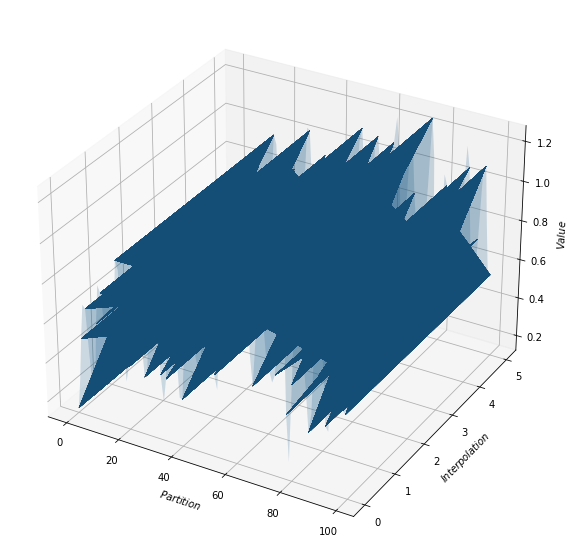

In [13]:
#3d graph, but smooth
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import math
import scipy as sp
import scipy.interpolate
MinPar=100
MaxPar=200
NuPar=MaxPar-MinPar
NuInt=6
Timetable=np.load('TmatrixTrig.npy')
Errortable=np.load('EmatrixTrig.npy')
Decodetimetable=np.load('DecodeTrig.npy')
Partition=np.load('CountTrig.npy')
#Removing the monocubic##################################################################################
Timetable=np.delete(Timetable,6,1)
Errortable=np.delete(Errortable,6,1)
Decodetimetable=np.delete(Decodetimetable,6,1)
#########################################################################################################
i=0
e=0.05
a=1
fig = plt.figure(figsize=(12,10))
ax = plt.axes(projection='3d')
Totaltable=a*Timetable+(1-a)*Errortable
X=[]
Y=[]
Z=[]
for i in range(NuPar):
    for j in range(NuInt):
        X.append(i)
        Y.append(j)
        Z.append(Totaltable[i][j])
B1, B2 = np.meshgrid(X,Y, indexing='xy')
spline = sp.interpolate.Rbf(X,Y,Z,function='thin_plate',smooth=5, episilon=5)
x=np.linspace(0,100,1000)
y=np.linspace(0,5,1000)
z=spline(B1,B2)
ax.set_xlabel('$Partition$', fontsize=10)
ax.set_ylabel('$Interpolation$', fontsize=10)
ax.set_zlabel('$Value$', fontsize=10)
#ax.plot_wireframe(B1, B2, z)
ax.plot_surface(B1, B2, z,alpha=0.2)
plt.show()

<ipython-input-14-bfe8696c90f7>:11: RuntimeWarning: divide by zero encountered in power
  return a * (x**b) * (y**c)
<ipython-input-14-bfe8696c90f7>:11: RuntimeWarning: invalid value encountered in multiply
  return a * (x**b) * (y**c)


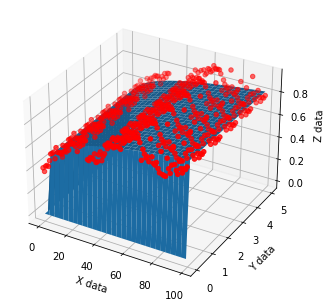

In [23]:
import numpy as np
from scipy.optimize import curve_fit
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import math
import scipy as sp
import scipy.interpolate
MinPar=100
MaxPar=200
NuPar=MaxPar-MinPar
NuInt=6
Timetable=np.load('TmatrixTrig.npy')
Errortable=np.load('EmatrixTrig.npy')
Decodetimetable=np.load('DecodeTrig.npy')
Partition=np.load('CountTrig.npy')
#Removing the monocubic##################################################################################
Timetable=np.delete(Timetable,6,1)
Errortable=np.delete(Errortable,6,1)
Decodetimetable=np.delete(Decodetimetable,6,1)
#########################################################################################################
# convert data into proper format
a=1
Totaltable=a*Timetable+(1-a)*Errortable
x_data = []
y_data = []
z_data = []
for i in range(NuPar):
    for j in range(NuInt):
        x_data.append(i)
        y_data.append(j)
        z_data.append(Totaltable[i][j])
# get fit parameters from scipy curve fit
parameters, covariance = curve_fit(function, [x_data, y_data], z_data)
# create surface function model
# setup data points for calculating surface model
model_x_data = np.linspace(min(x_data), max(x_data), 30)
model_y_data = np.linspace(min(y_data), max(y_data), 30)
# create coordinate arrays for vectorized evaluations
X, Y = np.meshgrid(model_x_data, model_y_data)
# calculate Z coordinate array
Z = function(np.array([X, Y]), *parameters)
# setup figure object
fig = plt.figure()
# setup 3d object
ax = Axes3D(fig)
# plot surface
ax.plot_surface(X, Y, Z)
# plot input data
ax.scatter(x_data, y_data, z_data, color='red')
# set plot descriptions
ax.set_xlabel('X data')
ax.set_ylabel('Y data')
ax.set_zlabel('Z data')
plt.show()

In [2]:
#Combining trig & linear to generate Time & Errortables
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.interpolate import lagrange
from scipy.integrate import quad
from scipy.interpolate import make_interp_spline
from scipy.interpolate import splrep
from scipy.interpolate import PchipInterpolator
from scipy.interpolate import BarycentricInterpolator as baryinterpolation
#Generating a partition
Finite=20               #Maximum number of coefficients of a function
NuFuncTrig=0               #Number of functions made by trigs
NuFuncLinear=40
NuFunc=NuFuncTrig+NuFuncLinear
NuInt=50
NuPoints=100
MaxNuPoint=200           #Max Number of points in partition
Count=100           #Min Number of points in partition 
Jump=1                #The jump in terms of points between each 2 partitions
#epsilon=1000  #Allowed error
#Lip=[0]*(NuFunc) #Lipschizt value 
z=np.linspace(0,1,1000)
n=np.load('n.npy')
a=np.load('a.npy')
b=np.load('b.npy')
Point=np.load('Point.npy')
Value=np.load('Value.npy')
NuPar=MaxNuPoint-Count
print('The number of Partitions is:', NuPar)
Partition=[]
PartitionList=[]
Timetable=np.zeros((NuPar,NuInt))
DecodeTimetable=np.zeros((NuPar,NuInt))
Errortable=np.zeros((NuPar,NuInt))
#Generating a partition with the allowed error(epsilon)
for p in range(NuPar):
    step=1/Count
    X=[0]
    count=1
    x=0
####Defining the time arrays#####################################################
    Time=np.zeros((NuInt,NuFunc))
#Generating partition#############################################################
    while (x<1-step):
        x=x+step
        X.append(x)
        count=count+1
    X.append(1)
    PartitionList.append(X)
    count=count+1
    Count+=1
    #Computing the values at the partition points#################################
    Partition.append(Count)
    Y=np.zeros((NuFuncTrig+NuFuncLinear,count))
    start=time.time()
    for i in range(NuFuncTrig):
        for j in range(count):
            for k in range(Finite):
                Y[i][j]=Y[i][j]+a[i][k]*np.cos(n[i][k]*X[j])+b[i][k]*np.sin(n[i][k]*X[j])
    end=time.time()
    encodetime=end-start
    for i in range(NuFuncLinear):
        f=interp1d(Point[i],Value[i], kind='linear')
        start=time.time()
        k=i+NuFuncTrig
        for j in range(count):
            Y[k][j]=f(X[j])
        end=time.time()
        encodetime+=end-start
#####Interpolation & cost##################################################################
    interpolationcost=np.zeros((NuInt,NuFunc))
    Interpolationcost=np.zeros(NuInt)
####Defining the Trig functions#################################################################    
    for i in range(NuFuncTrig):
        def f(x):
            y=0
            for j in range(Finite):
                y=y+a[i][j]*np.cos(n[i][j]*x)+b[i][j]*np.sin(n[i][j]*x)
            return(y)
########Computing the cost##################################################################
        for j in range(NuInt):
            start = time.time()
            function=make_interp_spline(X, Y[i], k=2*j+1, t=None, bc_type=None, axis=0)
            end = time.time()
            Time[j][i] = end-start
            #Define the function#############################
            def F(x):
                return(pow(f(x)-function(x),2))
            #Taking the error################################
            interpolationcost[j][i]= pow(quad(F,0,1)[0],0.5)        
####Defining the Linear functions#################################################################    
    for i in range(NuFuncTrig,NuFuncTrig+NuFuncLinear):
        f=interp1d(Point[i-NuFuncTrig],Value[i-NuFuncTrig], kind='linear')
########Computing the cost##################################################################
        for j in range(NuInt):
            start = time.time()
            function=make_interp_spline(X, Y[i], k=2*j+1, t=None, bc_type=None, axis=0)
            end = time.time()
            Time[j][i] = end-start
            #Define the function#############################
            def F(x):
                return(pow(f(x)-function(x),2))
            #Taking the error################################
            interpolationcost[j][i]= pow(quad(F,0,1)[0],0.5)        
#####Finding the mean error###################################################################   
    for i in range(NuInt):
        Interpolationcost[i]=np.mean(interpolationcost[i])
        Errortable[p][i]=Interpolationcost[i]
####EncodeTimetable##################################################################################
#    for i in range(NuInt):
        DecodeTimetable[p][i]=np.mean(Time[i])
####Timetable##################################################################################
#    for i in range(NuInt):
        Timetable[p][i]=encodetime+np.mean(Time[i])
#Print & save###############################################
plt.show()
print('Partition count list')
print(Partition)
print('Partition list')
PartitionList=np.array(PartitionList, dtype=object)
print(PartitionList)
#################
print('Time table')
print(Timetable)
print('Errortable')
print(Errortable)
print('Encode Time table')
print(DecodeTimetable)
################################################################################
np.save('TmatrixLinear100X50.npy', Timetable)
np.save('EmatrixLinear100X50.npy', Errortable)
np.save('DecodematrixLinear100X50.npy', DecodeTimetable)
np.save('CountLinear100X50.npy', Partition)
np.save('ListLinear100X50.npy', PartitionList)

The number of Partitions is: 100


<ipython-input-2-fad9ba99a5be>:108: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  interpolationcost[j][i]= pow(quad(F,0,1)[0],0.5)


Partition count list
[101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200]
Partition list
[list([0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.060000000000000005, 0.07, 0.08, 0.09, 0.09999999999999999, 0.10999999999999999, 0.11999999999999998, 0.12999999999999998, 0.13999999999999999, 0.15, 0.16, 0.17, 0.18000000000000002, 0.19000000000000003, 0.20000000000000004, 0.21000000000000005, 0.22000000000000006, 0.23000000000000007, 0.24000000000000007, 0.25000000000000006, 0.26000000000000006, 0.2700000000000001, 0.2800000000000001, 0.2900000000000001, 0.300000000

0 *Timetable+ 1 Errortable


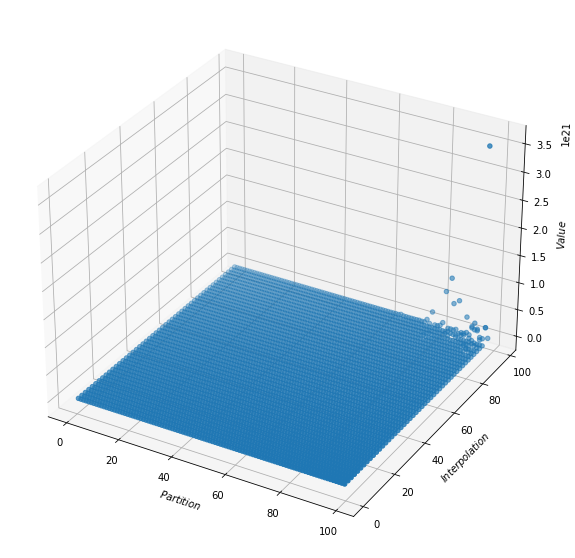

0.05 *Timetable+ 0.95 Errortable


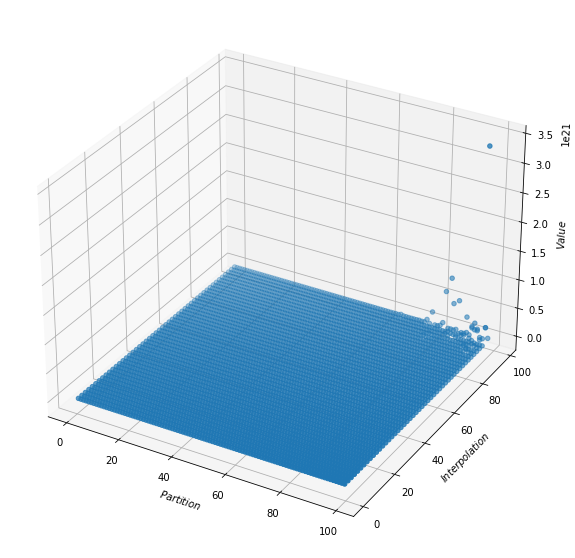

0.1 *Timetable+ 0.9 Errortable


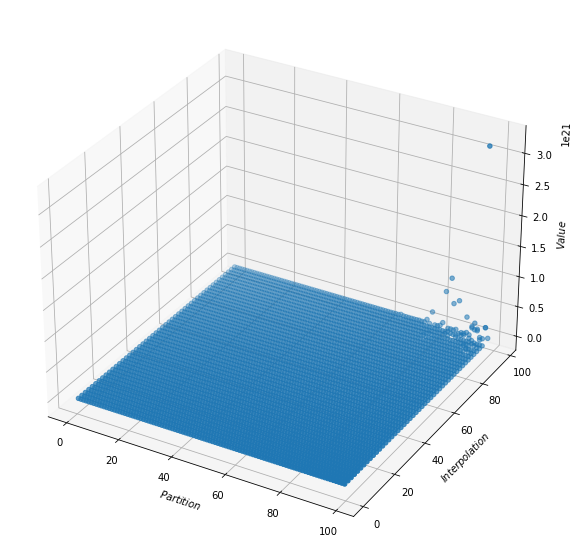

0.15000000000000002 *Timetable+ 0.85 Errortable


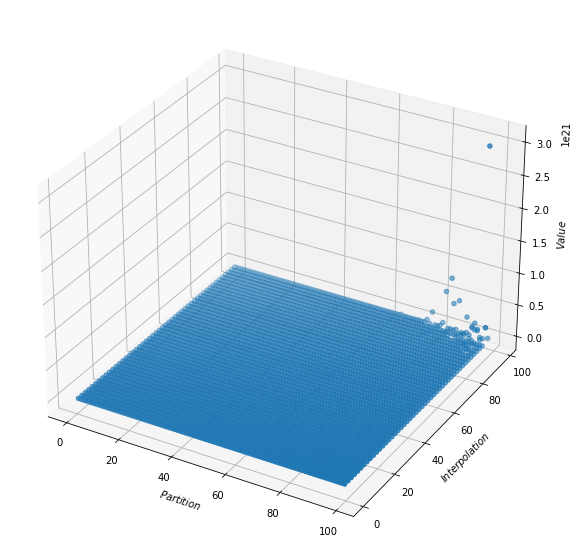

0.2 *Timetable+ 0.8 Errortable


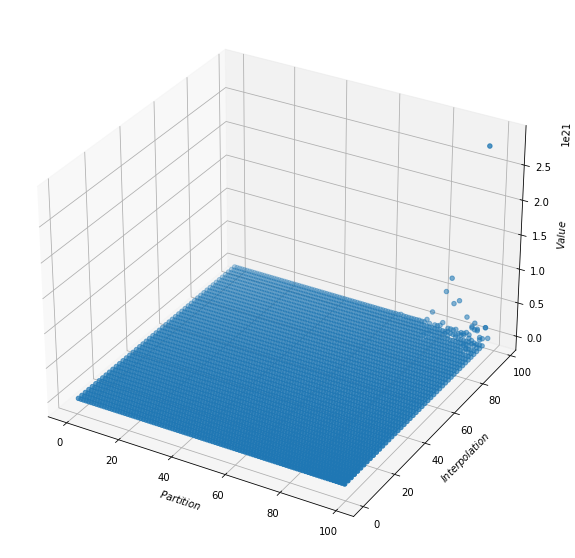

0.25 *Timetable+ 0.75 Errortable


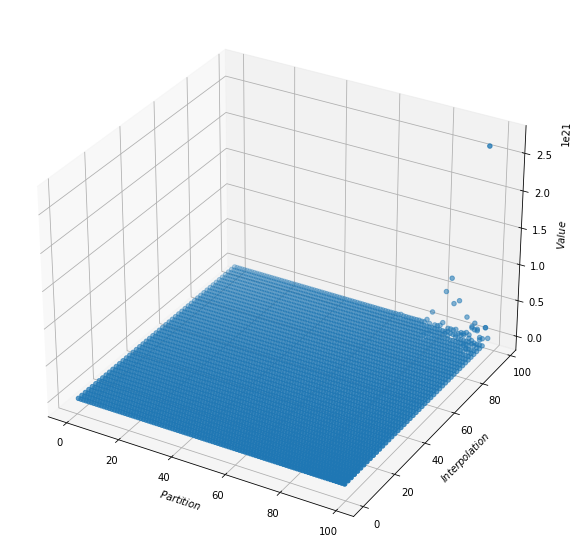

0.3 *Timetable+ 0.7 Errortable


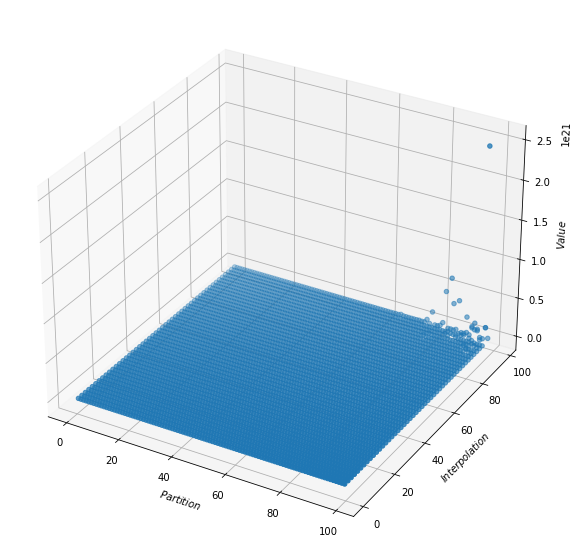

0.35 *Timetable+ 0.65 Errortable


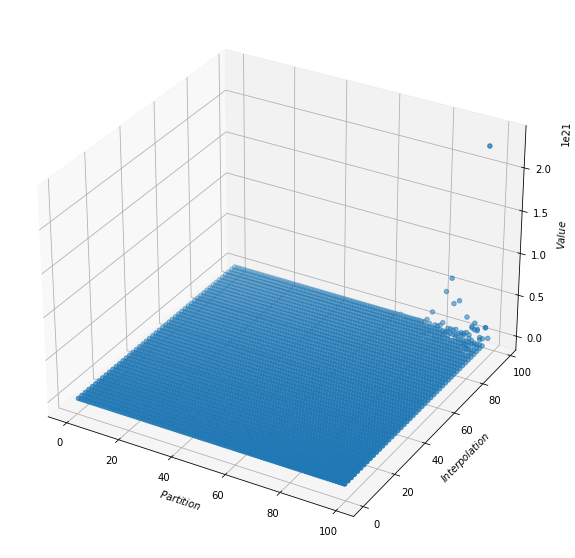

0.39999999999999997 *Timetable+ 0.6000000000000001 Errortable


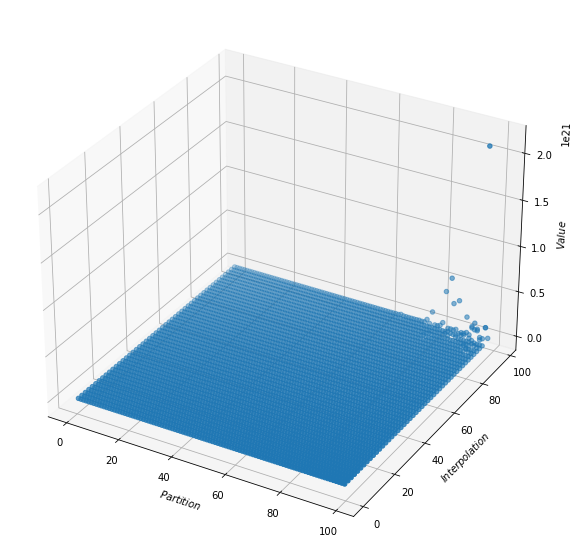

0.44999999999999996 *Timetable+ 0.55 Errortable


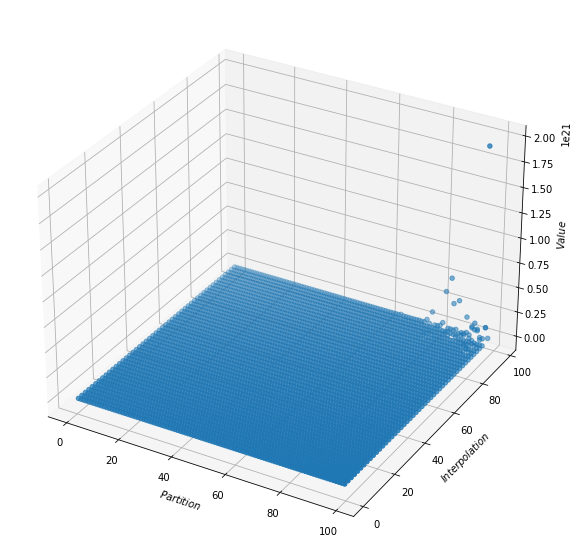

0.49999999999999994 *Timetable+ 0.5 Errortable


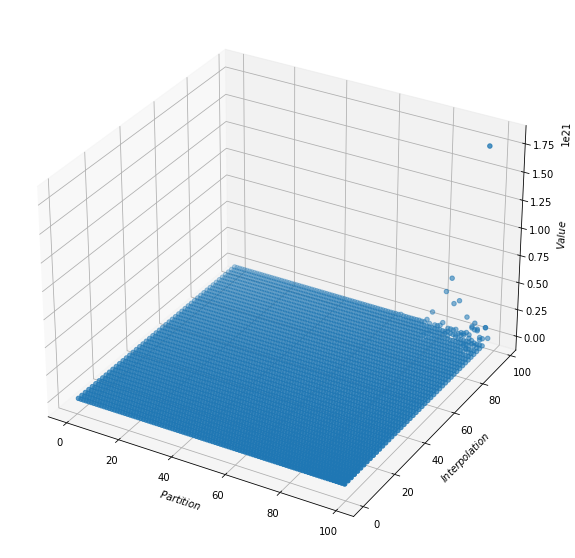

0.5499999999999999 *Timetable+ 0.45000000000000007 Errortable


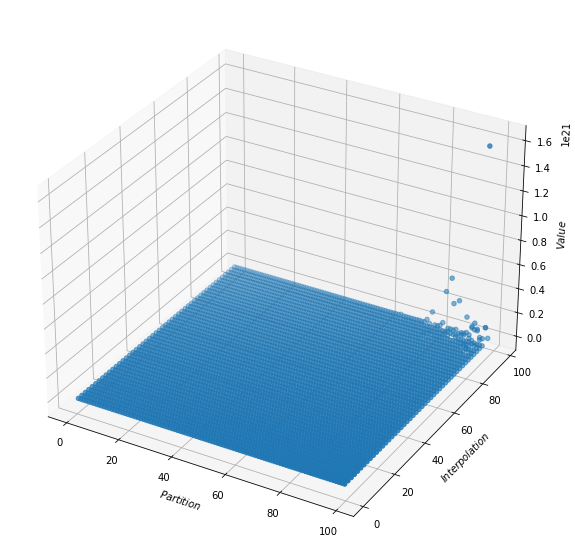

0.6 *Timetable+ 0.4 Errortable


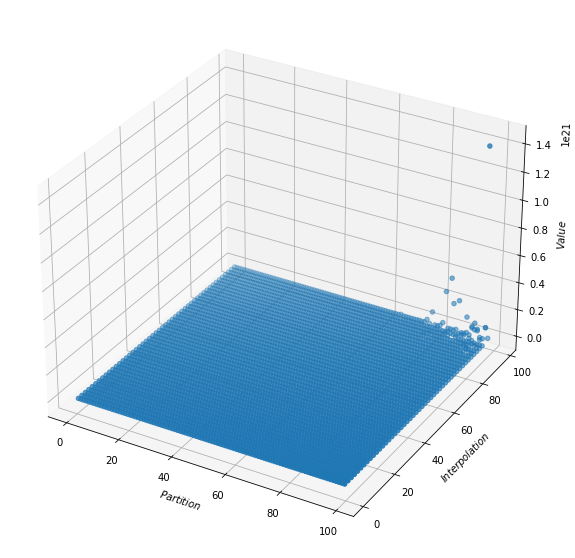

0.65 *Timetable+ 0.35 Errortable


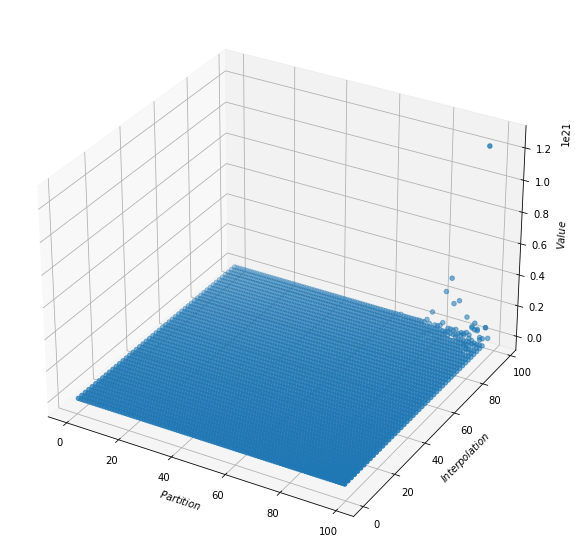

0.7000000000000001 *Timetable+ 0.29999999999999993 Errortable


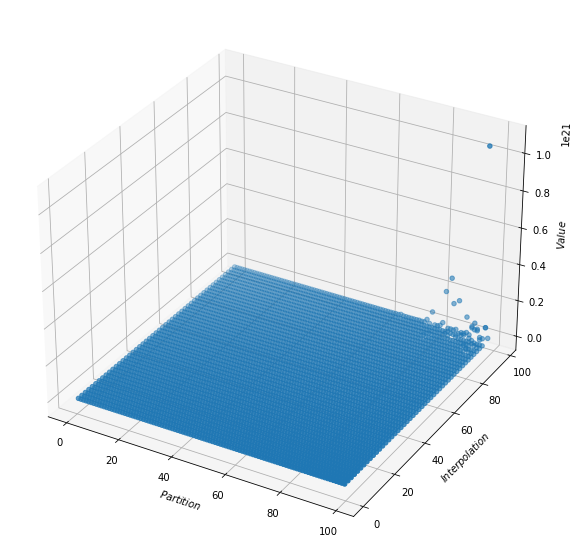

0.7500000000000001 *Timetable+ 0.2499999999999999 Errortable


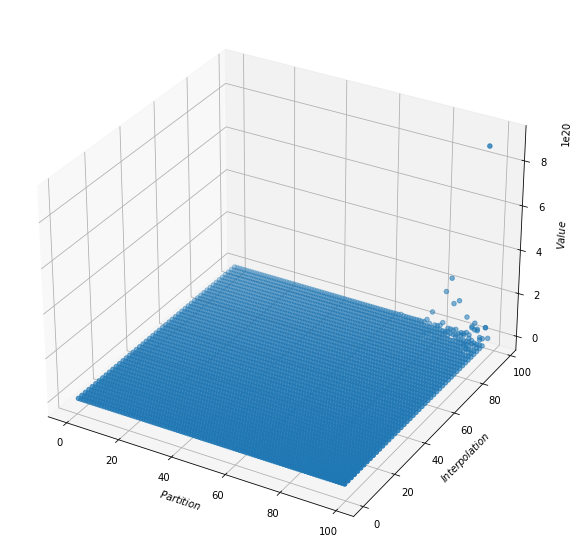

0.8000000000000002 *Timetable+ 0.19999999999999984 Errortable


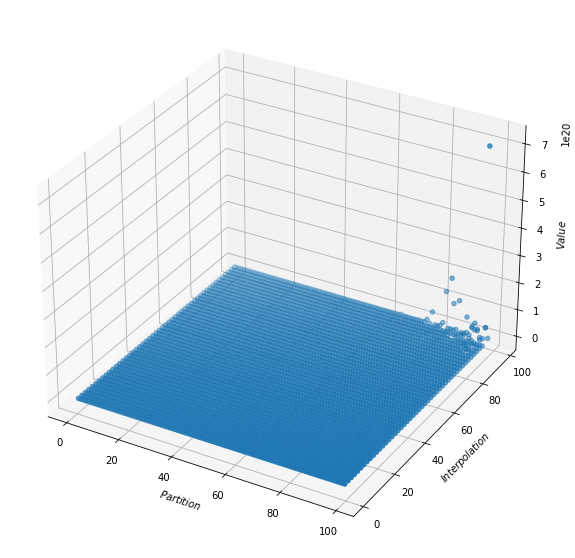

0.8500000000000002 *Timetable+ 0.1499999999999998 Errortable


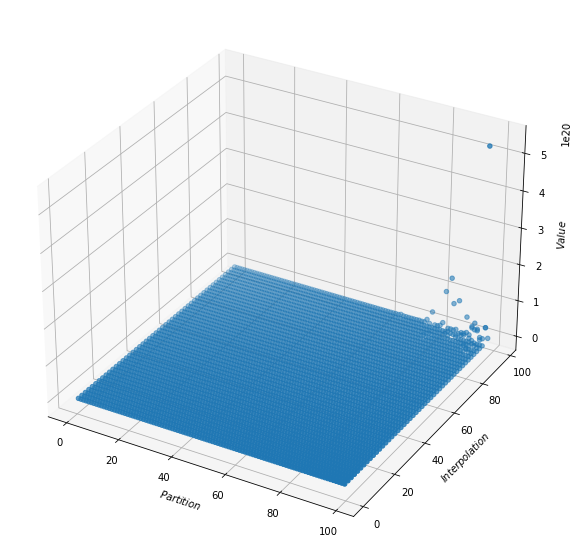

0.9000000000000002 *Timetable+ 0.09999999999999976 Errortable


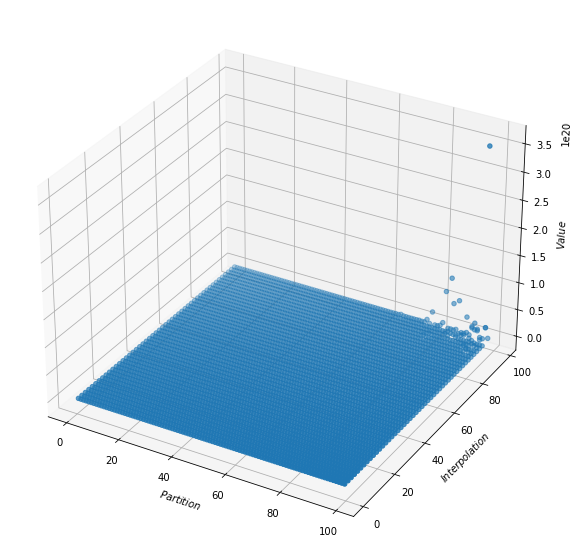

0.9500000000000003 *Timetable+ 0.04999999999999971 Errortable


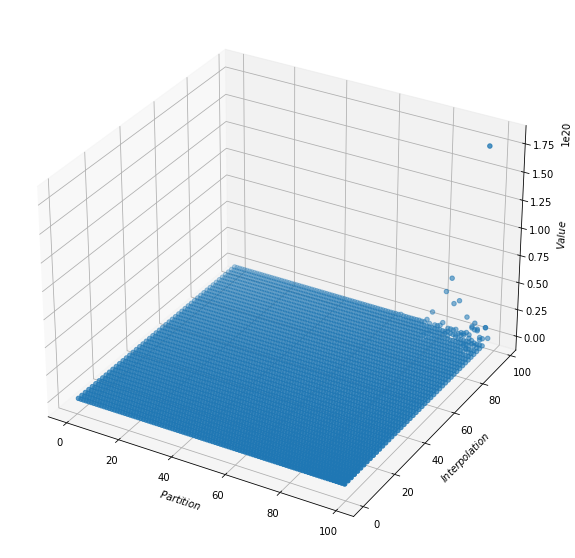

1 *Timetable+ 0 Errortable


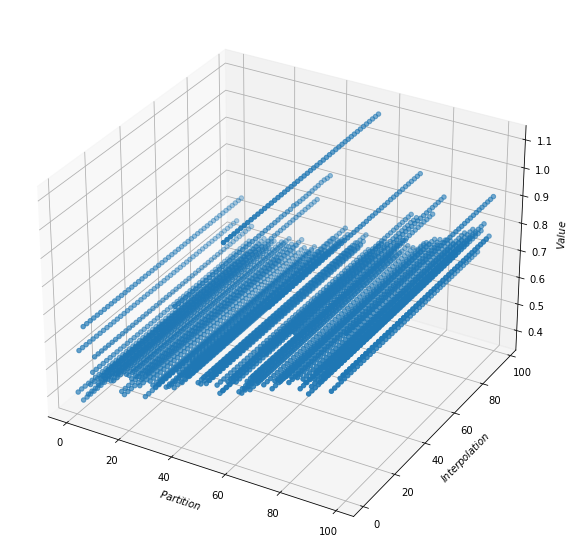

In [3]:
#3d scattered graph
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import math
MinPar=100
MaxPar=200
NuPar=MaxPar-MinPar
NuInt=49
#fig = plt.figure(figsize=(12,10))
#ax = plt.axes(projection='3d')
Timetable=np.load('TmatrixTrig100X50.npy')
Errortable=np.load('EmatrixTrig100X50.npy')
Decodetimetable=np.load('DecodematrixTrig100X50.npy')
Partition=np.load('CountTrig100X50.npy')
#Removing the monocubic##################################################################################
Timetable=np.delete(Timetable,6,1)
Errortable=np.delete(Errortable,6,1)
Decodetimetable=np.delete(Decodetimetable,6,1)
#########################################################################################################
i=0
e=0.05
A=[]
while i < 1:
    A.append(i)
    i=i+e
A.append(1)
for a in (A):
    print(a,'*Timetable+',1-a,'Errortable')
    fig = plt.figure(figsize=(12,10))
    ax = plt.axes(projection='3d')
    Totaltable=a*Timetable+(1-a)*Errortable
    X=[]
    Y=[]
    Z=[]
    for i in range(NuPar):
        for j in range(NuInt):
            X.append(i)
            Y.append(2*j+1)
            Z.append(Totaltable[i][j])
    ax.set_xlabel('$Partition$', fontsize=10)
    ax.set_ylabel('$Interpolation$', fontsize=10)
    ax.set_zlabel('$Value$', fontsize=10)
    ax.scatter3D(X,Y,Z)
    plt.show()

In [5]:
import numpy as np
# Taking a 3 * 3 matrix
A = np.array([[6, 1, 1],
              [4, -2, 5],
              [2, 8, 7]])
# Calculating the inverse of the matrix
print(np.linalg.inv(A))

[[ 0.17647059 -0.00326797 -0.02287582]
 [ 0.05882353 -0.13071895  0.08496732]
 [-0.11764706  0.1503268   0.05228758]]


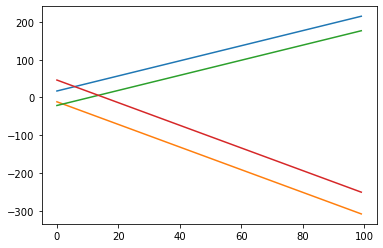

In [1]:
#Changing 
import numpy as np
import math
import matplotlib.pyplot as plt
x0=0
y0=1
x1=0.5
y1=0.3
x2=1
y2=2
a=0
b=0
cof1=[]
cof2=[]
cof3=[]
cof4=[]
Z=[]
for i in range(100):
    Y=np.array([[y0],[y2],[y1],[y1],[0],[0],[a],[b]])
    A=np.array([[pow(x0,3),pow(x0,2),x0,1,0,0,0,0],
               [0,0,0,0,pow(x2,3),pow(x2,2),x2,1],
               [pow(x1,3),pow(x1,2),x1,1,0,0,0,0],
               [0,0,0,0,pow(x1,3),pow(x1,2),x1,1],
               [3*pow(x1,2),2*x1,1,0,-3*pow(x1,2),-2*x1,-1,0],
               [6*x1,2,0,0,-6*x1,-2,0,0],
               [3*pow(x0,2),2*x0,1,0,0,0,0,0],
               [0,0,0,0,3*pow(x2,2),2*x2,1,0]])
    B=np.linalg.inv(A)
    X=B @ Y
    Z.append(a)
    cof1.append(X[0])
    cof2.append(X[1])
    cof3.append(X[4])
    cof4.append(X[5])
    a+=1
    b+=1
plt.plot(Z,cof1)
plt.plot(Z,cof2)
plt.plot(Z,cof3)
plt.plot(Z,cof4)
plt.show()

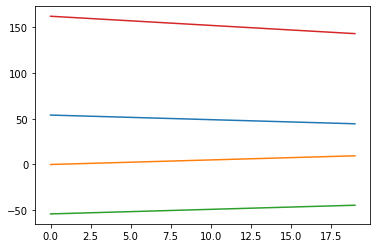

In [11]:
import numpy as np
import math
import matplotlib.pyplot as plt
x0=0
y0=10
x1=0.5
y1=-5
x2=1
y2=7
a=0
b=0
cof1=[]
cof2=[]
cof3=[]
cof4=[]
Z=[]
for i in range(20):
    Y=np.array([[y0],[y2],[y1],[y1],[0],[0],[a],[b]])
    A=np.array([[pow(x0,3),pow(x0,2),x0,1,0,0,0,0],
               [0,0,0,0,pow(x2,3),pow(x2,2),x2,1],
               [pow(x1,3),pow(x1,2),x1,1,0,0,0,0],
               [0,0,0,0,pow(x1,3),pow(x1,2),x1,1],
               [3*pow(x1,2),2*x1,1,0,-3*pow(x1,2),-2*x1,-1,0],
               [6*x1,2,0,0,-6*x1,-2,0,0],
               [6*x0,2,0,0,0,0,0,0],
               [0,0,0,0,6*x2,2,0,0]])
    B=np.linalg.inv(A)
    X=B @ Y
    Z.append(i)
    cof1.append(X[0])
    cof2.append(X[1])
    cof3.append(X[4])
    cof4.append(X[5])
    a+=1
    b+=1
    #print(x1)
plt.plot(Z,cof1)
plt.plot(Z,cof2)
plt.plot(Z,cof3)
plt.plot(Z,cof4)
plt.show()

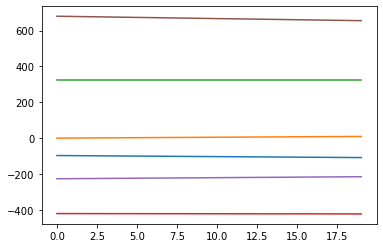

In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
x0=0
x1=1/3
x2=2/3
x3=1
y0=10
y1=3
y2=-10
y3=7
a=0
b=0
cof1=[]
cof2=[]
cof3=[]
cof4=[]
cof5=[]
cof6=[]
Z=[]
for i in range(20):
    Y=np.array([[y0],[y1],[y1],[0],[0],[y2],[y2],[0],[0],[y3],[a],[b]])
    A=np.array([[pow(x0,3),pow(x0,2),x0,1,0,0,0,0,0,0,0,0],
               [pow(x1,3),pow(x1,2),x1,1,0,0,0,0,0,0,0,0],
               [0,0,0,0,pow(x1,3),pow(x1,2),x1,1,0,0,0,0],
               [3*pow(x1,2),2*x1,1,0,-3*pow(x1,2),-2*x1,-1,0,0,0,0,0],
                [6*x1,2,0,0,-6*x1,-2,0,0,0,0,0,0],
                [0,0,0,0,pow(x2,3),pow(x2,2),x2,1,0,0,0,0],
               [0,0,0,0,0,0,0,0,pow(x2,3),pow(x2,2),x2,1],
               [0,0,0,0,3*pow(x2,2),2*x2,1,0,-3*pow(x2,2),-2*x2,-1,0],
               [0,0,0,0,6*x2,2,0,0,-6*x2,-2,0,0],
                [0,0,0,0,0,0,0,0,pow(x3,3),pow(x3,2),x3,1],
                [6*x0,2,0,0,0,0,0,0,0,0,0,0],
                [0,0,0,0,0,0,0,0,6*x3,2,0,0]])
    B=np.linalg.inv(A)
    X=B @ Y
    Z.append(i)
    cof1.append(X[0])
    cof2.append(X[1])
    cof3.append(X[4])
    cof4.append(X[5])
    cof5.append(X[8])
    cof6.append(X[9])
    a+=1
    b+=1
plt.plot(Z,cof1)
plt.plot(Z,cof2)
plt.plot(Z,cof3)
plt.plot(Z,cof4)
plt.plot(Z,cof5)
plt.plot(Z,cof6)
plt.show()

In [4]:
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.interpolate import lagrange
from scipy.integrate import quad
from scipy.interpolate import make_interp_spline
from scipy.interpolate import splrep
from scipy.interpolate import PchipInterpolator
from scipy.interpolate import BarycentricInterpolator as baryinterpolation
n=50
delta=1/n
X=[]
Y=[]
y=10
for i in range(n):
    X.append(i*delta)
X.append(1)
print(X)
for i in range(n):
    y=-y
    Y.append(y)
Y.append(-y)
print(Y)
#f=make_interp_spline(X, Y, k=3, t=None, bc_type=None, axis=0)
f=CubicSpline(X,Y)
f.c

[0.0, 0.02, 0.04, 0.06, 0.08, 0.1, 0.12, 0.14, 0.16, 0.18, 0.2, 0.22, 0.24, 0.26, 0.28, 0.3, 0.32, 0.34, 0.36, 0.38, 0.4, 0.42, 0.44, 0.46, 0.48, 0.5, 0.52, 0.54, 0.56, 0.58, 0.6, 0.62, 0.64, 0.66, 0.68, 0.7000000000000001, 0.72, 0.74, 0.76, 0.78, 0.8, 0.8200000000000001, 0.84, 0.86, 0.88, 0.9, 0.92, 0.9400000000000001, 0.96, 0.98, 1]
[-10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10, 10, -10]


array([[ 2.88675135e+06,  2.88675135e+06, -4.43375673e+06,
         4.84827557e+06, -4.95934556e+06,  4.98910668e+06,
        -4.99708114e+06,  4.99921789e+06, -4.99979044e+06,
         4.99994385e+06, -4.99998495e+06,  4.99999597e+06,
        -4.99999892e+06,  4.99999971e+06, -4.99999992e+06,
         4.99999998e+06, -4.99999999e+06,  5.00000000e+06,
        -5.00000000e+06,  5.00000000e+06, -5.00000000e+06,
         5.00000000e+06, -5.00000000e+06,  5.00000000e+06,
        -5.00000000e+06,  5.00000000e+06, -5.00000000e+06,
         5.00000000e+06, -5.00000000e+06,  5.00000000e+06,
        -5.00000000e+06,  5.00000000e+06, -5.00000000e+06,
         4.99999999e+06, -4.99999998e+06,  4.99999992e+06,
        -4.99999971e+06,  4.99999892e+06, -4.99999597e+06,
         4.99998495e+06, -4.99994385e+06,  4.99979044e+06,
        -4.99921789e+06,  4.99708114e+06, -4.98910668e+06,
         4.95934556e+06, -4.84827557e+06,  4.43375673e+06,
        -2.88675135e+06, -2.88675135e+06],
       [-2.23

In [4]:
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.interpolate import lagrange
from scipy.integrate import quad
from scipy.interpolate import make_interp_spline
from scipy.interpolate import splrep
from scipy.interpolate import PchipInterpolator
from scipy.interpolate import BarycentricInterpolator as baryinterpolation
k=3
n=50
Delta=1/n
delta=Delta/k
X=[]
Y=[]
Sigma=[]
def f(x):
    return(7*pow(x,7)-5*pow(2.71,-x)+x)
for i in range(n):
    X.append(i*Delta)
X.append(1)
print(X)
for i in range(n):
    y=f(X[i])
    Y.append(y)
Y.append(f(1))
print(Y)
P=[]
f=make_interp_spline(X, Y, k=3, t=None, bc_type="natural", axis=0)
for i in range(n):
    p=[]
    a=i*Delta
    b=a+Delta
    for j in range(k+1):
        x=a+j*delta
        p.append(x)
    P.append(p)
P=np.array(P)
print(P)
for i in range(n):
    F=[]
    A=np.zeros((k+1,k+1))
    for j in range(k+1):
        F.append([f(P[i][j])])
        for h in range(k+1):
            A[j][h]=pow(P[i][j],k-h)
    A=np.array(A)
    F=np.array(F)
    #print(A)
    #print(F)
    B=np.linalg.inv(A)
    C=B @ F
    print(C)
    print('Bound on first derivative is',3*abs(C[0])/pow(n,2)+2*abs(C[1])/n+abs(C[2]))
    print('Bound on second derivative is',3*abs(C[0])/n+abs(C[1]))

[0.0, 0.02, 0.04, 0.06, 0.08, 0.1, 0.12, 0.14, 0.16, 0.18, 0.2, 0.22, 0.24, 0.26, 0.28, 0.3, 0.32, 0.34, 0.36, 0.38, 0.4, 0.42, 0.44, 0.46, 0.48, 0.5, 0.52, 0.54, 0.56, 0.58, 0.6, 0.62, 0.64, 0.66, 0.68, 0.7000000000000001, 0.72, 0.74, 0.76, 0.78, 0.8, 0.8200000000000001, 0.84, 0.86, 0.88, 0.9, 0.92, 0.9400000000000001, 0.96, 0.98, 1]
[-5.0, -4.881292470054567, -4.764533574273405, -4.6496848274794464, -4.5367084286675246, -4.425567095483966, -4.31622376352695, -4.208641105303414, -4.102780823678338, -3.9986026746524357, -3.8960631743043193, -3.7951139447333566, -3.6956996538395295, -3.597755503776707, -3.5012042229158533, -3.405952516154785, -3.3118869284112087, -3.218869076135832, -3.1267302016824647, -3.03526500537212, -2.9442247100881938, -2.8533093132399014, -2.762158980931255, -2.670344539172915, -2.577357016974366, -2.482596196153935, -2.3853581227042393, -2.28482153455076, -2.180033160541287, -2.0698918455040634, -1.9531314562125504, -1.828302523094778, -1.6937525725253355, -1.5

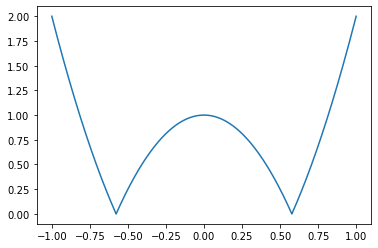

2.0


In [2]:
#Estimating the sup norm
import numpy as np
import matplotlib.pyplot as plt
import math
def f(x):
    return 3*pow(x,2)-1
z=np.linspace(-1,1,1000000)
y=abs(f(z))
plt.plot(z,y)
plt.show()
print(np.max(y))

[8.881784197001252e-15, 0, 4.4408920985006246e-15, 0, 4.440892098500627e-15, 0, 0, 0, 0, 1.7763568394002508e-14]
[0, 0, 4.440892098500627e-14, 0, 0, 4.440892098500629e-14, 0, 0, 0, 2.2204460492503112e-14, 2.2204460492503143e-14, 0, 0, 4.4408920985006224e-14, 0, 0, 0, 0, 0, 2.2204460492503112e-14, 0, 2.2204460492503112e-14, 0, 2.2204460492503172e-14, 2.2204460492503112e-14, 0, 2.2204460492503112e-14, 0, 0, 0, 0, 0, 1.1102230246251556e-14, 0, 0, 0, 0, 5.551115123125778e-15, 0, 0, 0, 0, 1.1102230246251556e-14, 0, 0, 0, 2.2204460492503112e-14, 0, 0, 0]
[8.881784197001252e-14, 0, 0, 8.881784197001251e-14, 8.881784197001251e-14, 0, 0, 0, 8.881784197001257e-14, 0, 0, 0, 0, 0, 0, 0, 8.881784197001245e-14, 8.881784197001269e-14, 4.4408920985006224e-14, 4.4408920985006224e-14, 0, 4.4408920985006224e-14, 0, 0, 0, 4.4408920985006224e-14, 0, 0, 0, 0, 8.881784197001245e-14, 0, 0, 8.881784197001245e-14, 4.4408920985006224e-14, 0, 0, 4.4408920985006224e-14, 4.4408920985006224e-14, 0, 4.440892098500622

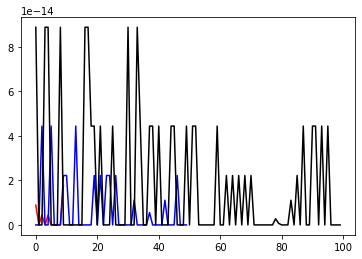

In [21]:
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.interpolate import lagrange
from scipy.integrate import quad
from scipy.interpolate import make_interp_spline
from scipy.interpolate import splrep
from scipy.interpolate import PchipInterpolator
from scipy.interpolate import BarycentricInterpolator as baryinterpolation
k=3
n=10
Delta=1/n
delta=Delta/k
X=[]
Y=[]
Sigma=[]
def f(x):
    return(7*pow(x,7)-5*pow(2.71,-x)+x)
for i in range(n):
    X.append(i*Delta)
X.append(1)
#print(X)
for i in range(n):
    y=f(X[i])
    Y.append(y)
Y.append(f(1))
#print(Y)
Z=[]
s=make_interp_spline(X, Y, k=3, t=None, bc_type="natural", axis=0)
for i in range(n):
    Z.append(i)
    sigma=0
    z=np.linspace(X[i],X[i+1],10)
    a=np.min([Y[i],Y[i+1]])
    b=np.max([Y[i],Y[i+1]])
    for x in z:
        if s(x) < a-sigma*(X[i+1]-X[i]):
            sigma=(a-s(x))/(X[i+1]-X[i])
        elif s(x) > b+sigma*(X[i+1]-X[i]):
            sigma=(s(x)-b)/(X[i+1]-X[i])
        else:
            pass
    Sigma.append(sigma)
print(Sigma)
plt.plot(Z,Sigma,color="red")
#plt.show()
############################################
n=50
Delta=1/n
delta=Delta/k
X=[]
Y=[]
Sigma=[]
def f(x):
    return(7*pow(x,7)-5*pow(2.71,-x)+x)
for i in range(n):
    X.append(i*Delta)
X.append(1)
#print(X)
for i in range(n):
    y=f(X[i])
    Y.append(y)
Y.append(f(1))
#print(Y)
Z=[]
s=make_interp_spline(X, Y, k=3, t=None, bc_type="natural", axis=0)
for i in range(n):
    Z.append(i)
    sigma=0
    z=np.linspace(X[i],X[i+1],10)
    a=np.min([Y[i],Y[i+1]])
    b=np.max([Y[i],Y[i+1]])
    for x in z:
        if s(x) < a-sigma*(X[i+1]-X[i]):
            sigma=(a-s(x))/(X[i+1]-X[i])
        elif s(x) > b+sigma*(X[i+1]-X[i]):
            sigma=(s(x)-b)/(X[i+1]-X[i])
        else:
            pass
    Sigma.append(sigma)
print(Sigma)
plt.plot(Z,Sigma,color="blue")
############################################
n=100
Delta=1/n
delta=Delta/k
X=[]
Y=[]
Sigma=[]
def f(x):
    return(7*pow(x,7)-5*pow(2.71,-x)+x)
for i in range(n):
    X.append(i*Delta)
X.append(1)
#print(X)
for i in range(n):
    y=f(X[i])
    Y.append(y)
Y.append(f(1))
#print(Y)
Z=[]
s=make_interp_spline(X, Y, k=3, t=None, bc_type="natural", axis=0)
for i in range(n):
    Z.append(i)
    sigma=0
    z=np.linspace(X[i],X[i+1],10)
    a=np.min([Y[i],Y[i+1]])
    b=np.max([Y[i],Y[i+1]])
    for x in z:
        if s(x) < a-sigma*(X[i+1]-X[i]):
            sigma=(a-s(x))/(X[i+1]-X[i])
        elif s(x) > b+sigma*(X[i+1]-X[i]):
            sigma=(s(x)-b)/(X[i+1]-X[i])
        else:
            pass
    Sigma.append(sigma)
print(Sigma)
plt.plot(Z,Sigma,color="black")
plt.show()

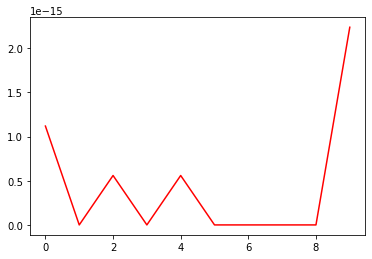

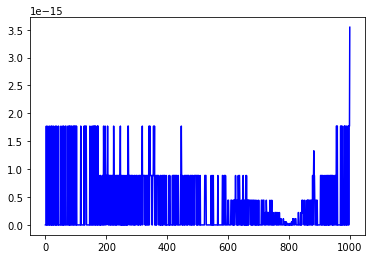

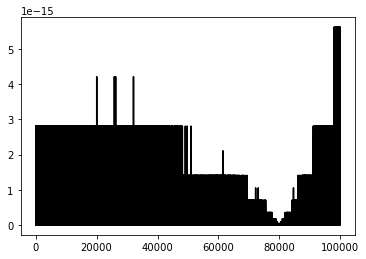

In [17]:
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.interpolate import lagrange
from scipy.integrate import quad
from scipy.interpolate import make_interp_spline
from scipy.interpolate import splrep
from scipy.interpolate import PchipInterpolator
from scipy.interpolate import BarycentricInterpolator as baryinterpolation
beta=0.1
k=3
n=10
Delta=1/n
delta=Delta/k
X=[]
Y=[]
Sigma=[]
def f(x):
    return(7*pow(x,7)-5*pow(2.71,-x)+x)
for i in range(n):
    X.append(i*Delta)
X.append(1)
#print(X)
for i in range(n):
    y=f(X[i])
    Y.append(y)
Y.append(f(1))
#print(Y)
Z=[]
s=make_interp_spline(X, Y, k=3, t=None, bc_type="natural", axis=0)
for i in range(n):
    Z.append(i)
    sigma=0
    z=np.linspace(X[i],X[i+1],10)
    a=np.min([Y[i],Y[i+1]])
    b=np.max([Y[i],Y[i+1]])
    for x in z:
        if s(x) < a-sigma*(pow(X[i+1]-X[i],beta)):
            sigma=(a-s(x))/(pow(X[i+1]-X[i],beta))
        elif s(x) > b+sigma*(pow(X[i+1]-X[i],beta)):
            sigma=(s(x)-b)/(pow(X[i+1]-X[i],beta))
        else:
            pass
    Sigma.append(sigma)
#print(Sigma)
plt.plot(Z,Sigma,color="red")
plt.show()
############################################
n=1000
Delta=1/n
delta=Delta/k
X=[]
Y=[]
Sigma=[]
def f(x):
    return(7*pow(x,7)-5*pow(2.71,-x)+x)
for i in range(n):
    X.append(i*Delta)
X.append(1)
#print(X)
for i in range(n):
    y=f(X[i])
    Y.append(y)
Y.append(f(1))
#print(Y)
Z=[]
s=make_interp_spline(X, Y, k=3, t=None, bc_type="natural", axis=0)
for i in range(n):
    Z.append(i)
    sigma=0
    z=np.linspace(X[i],X[i+1],10)
    a=np.min([Y[i],Y[i+1]])
    b=np.max([Y[i],Y[i+1]])
    for x in z:
        if s(x) < a-sigma*(pow(X[i+1]-X[i],beta)):
            sigma=(a-s(x))/(pow(X[i+1]-X[i],beta))
        elif s(x) > b+sigma*(pow(X[i+1]-X[i],beta)):
            sigma=(s(x)-b)/(pow(X[i+1]-X[i],beta))
        else:
            pass
    Sigma.append(sigma)
#print(Sigma)
plt.plot(Z,Sigma,color="blue")
plt.show()
############################################
n=100000
Delta=1/n
delta=Delta/k
X=[]
Y=[]
Sigma=[]
def f(x):
    return(7*pow(x,7)-5*pow(2.71,-x)+x)
for i in range(n):
    X.append(i*Delta)
X.append(1)
#print(X)
for i in range(n):
    y=f(X[i])
    Y.append(y)
Y.append(f(1))
#print(Y)
Z=[]
s=make_interp_spline(X, Y, k=3, t=None, bc_type="natural", axis=0)
for i in range(n):
    Z.append(i)
    sigma=0
    z=np.linspace(X[i],X[i+1],10)
    a=np.min([Y[i],Y[i+1]])
    b=np.max([Y[i],Y[i+1]])
    for x in z:
        if s(x) < a-sigma*(pow(X[i+1]-X[i],beta)):
            sigma=(a-s(x))/(pow(X[i+1]-X[i],beta))
        elif s(x) > b+sigma*(pow(X[i+1]-X[i],beta)):
            sigma=(s(x)-b)/(pow(X[i+1]-X[i],beta))
        else:
            pass
    Sigma.append(sigma)
#print(Sigma)
plt.plot(Z,Sigma,color="black")
plt.show()

[8.881784197001252e-16, 0, 4.440892098500626e-16, 0, 4.440892098500626e-16, 0, 0, 0, 0, 1.7763568394002505e-15]
[0, 0, 0, 8.881784197001252e-16, 0, 0, 8.881784197001252e-16, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4.440892098500626e-16, 4.440892098500626e-16, 0, 4.440892098500626e-16, 0, 4.440892098500626e-16, 0, 0, 0, 0, 0, 4.440892098500626e-16, 4.440892098500626e-16, 0, 4.440892098500626e-16, 0, 0, 0, 0, 0, 0, 4.440892098500626e-16, 0, 0, 2.220446049250313e-16, 0, 2.220446049250313e-16, 0, 2.220446049250313e-16, 0, 2.220446049250313e-16, 0, 0, 0, 1.1102230246251565e-16, 0, 0, 2.7755575615628914e-17, 5.551115123125783e-17, 0, 1.1102230246251565e-16, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.6645352591003757e-15]
[0, 8.881784197001252e-16, 0, 0, 8.881784197001252e-16, 0, 0, 8.881784197001252e-16, 0, 8.881784197001252e-16, 8.881784197001252e-16, 0, 0, 8.881784197001252e-16, 0, 0, 0, 0, 8.881784197001252e-16, 8.881784197001252e-16, 0, 8.881784197001252e-16, 8.881784197001252e-16, 0, 8.881784197001252e-1

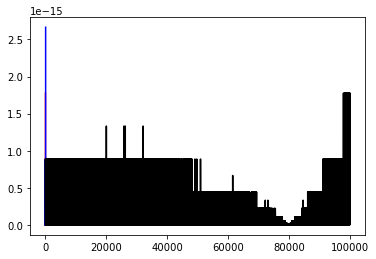

In [2]:
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.interpolate import lagrange
from scipy.integrate import quad
from scipy.interpolate import make_interp_spline
from scipy.interpolate import splrep
from scipy.interpolate import PchipInterpolator
from scipy.interpolate import BarycentricInterpolator as baryinterpolation
k=3
n=10
Delta=1/n
delta=Delta/k
X=[]
Y=[]
Sigma=[]
def f(x):
    return(7*pow(x,7)-5*pow(2.71,-x)+x)
for i in range(n):
    X.append(i*Delta)
X.append(1)
#print(X)
for i in range(n):
    y=f(X[i])
    Y.append(y)
Y.append(f(1))
#print(Y)
Z=[]
s=make_interp_spline(X, Y, k=3, t=None, bc_type="natural", axis=0)
for i in range(n):
    Z.append(i)
    sigma=0
    z=np.linspace(X[i],X[i+1],10)
    a=np.min([Y[i],Y[i+1]])
    b=np.max([Y[i],Y[i+1]])
    for x in z:
        if s(x) < a-sigma:
            sigma=(a-s(x))
        elif s(x) > b+sigma:
            sigma=(s(x)-b)
        else:
            pass
    Sigma.append(sigma)
print(Sigma)
plt.plot(Z,Sigma,color="red")
#plt.show()
############################################
n=70
Delta=1/n
delta=Delta/k
X=[]
Y=[]
Sigma=[]
def f(x):
    return(7*pow(x,7)-5*pow(2.71,-x)+x)
for i in range(n):
    X.append(i*Delta)
X.append(1)
#print(X)
for i in range(n):
    y=f(X[i])
    Y.append(y)
Y.append(f(1))
#print(Y)
Z=[]
s=make_interp_spline(X, Y, k=3, t=None, bc_type="natural", axis=0)
for i in range(n):
    Z.append(i)
    sigma=0
    z=np.linspace(X[i],X[i+1],10)
    a=np.min([Y[i],Y[i+1]])
    b=np.max([Y[i],Y[i+1]])
    for x in z:
        if s(x) < a-sigma:
            sigma=(a-s(x))
        elif s(x) > b+sigma:
            sigma=(s(x)-b)
        else:
            pass
    Sigma.append(sigma)
print(Sigma)
plt.plot(Z,Sigma,color="blue")
############################################
n=100000
Delta=1/n
delta=Delta/k
X=[]
Y=[]
Sigma=[]
def f(x):
    return(7*pow(x,7)-5*pow(2.71,-x)+x)
for i in range(n):
    X.append(i*Delta)
X.append(1)
#print(X)
for i in range(n):
    y=f(X[i])
    Y.append(y)
Y.append(f(1))
#print(Y)
Z=[]
s=make_interp_spline(X, Y, k=3, t=None, bc_type="natural", axis=0)
for i in range(n):
    Z.append(i)
    sigma=0
    z=np.linspace(X[i],X[i+1],10)
    a=np.min([Y[i],Y[i+1]])
    b=np.max([Y[i],Y[i+1]])
    for x in z:
        if s(x) < a-sigma:
            sigma=(a-s(x))
        elif s(x) > b+sigma:
            sigma=(s(x)-b)
        else:
            pass
    Sigma.append(sigma)
print(Sigma)
plt.plot(Z,Sigma,color="black")
plt.show()

[0.050919966119021165, 0, 0, 0, 0, 2.220446049250313e-16, 2.220446049250313e-16, 2.220446049250313e-16, 0.06426886206046123, 1.7763568394002505e-15]
[0.050916076349430295, 2.220446049250313e-16, 2.220446049250313e-16, 0, 0, 0, 0, 2.220446049250313e-16, 2.220446049250313e-16, 0, 0, 0, 0, 0, 0, 0, 2.220446049250313e-16, 2.220446049250313e-16, 2.220446049250313e-16, 2.220446049250313e-16, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.220446049250313e-16, 2.220446049250313e-16, 0, 4.440892098500626e-16, 4.440892098500626e-16, 0, 2.220446049250313e-16, 2.220446049250313e-16, 0, 0, 2.220446049250313e-16, 2.220446049250313e-16, 2.220446049250313e-16, 0, 0, 2.220446049250313e-16, 2.220446049250313e-16, 2.220446049250313e-16, 2.220446049250313e-16, 0, 2.220446049250313e-16, 2.220446049250313e-16, 2.220446049250313e-16, 2.220446049250313e-16, 2.220446049250313e-16, 2.220446049250313e-16, 2.220446049250313e-16, 2.220446049250313e-16, 2.220446049250313e-16, 2.220446049250313e-16, 0, 0, 0.06426

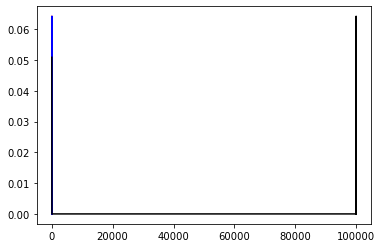

In [4]:
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.interpolate import lagrange
from scipy.integrate import quad
from scipy.interpolate import make_interp_spline
from scipy.interpolate import splrep
from scipy.interpolate import PchipInterpolator
from scipy.interpolate import BarycentricInterpolator as baryinterpolation
k=3
n=10
Delta=1/n
delta=Delta/k
X=[]
Y=[]
Sigma=[]
for i in range(n):
    X.append(i*Delta)
X.append(1)
#print(X)
for i in range(n):
    y=pow(-1,i)
    Y.append(y)
Y.append(f(1))
#print(Y)
Z=[]
s=make_interp_spline(X, Y, k=3, t=None, bc_type="natural", axis=0)
for i in range(n):
    Z.append(i)
    sigma=0
    z=np.linspace(X[i],X[i+1],10)
    a=np.min([Y[i],Y[i+1]])
    b=np.max([Y[i],Y[i+1]])
    for x in z:
        if s(x) < a-sigma:
            sigma=(a-s(x))
        elif s(x) > b+sigma:
            sigma=(s(x)-b)
        else:
            pass
    Sigma.append(sigma)
print(Sigma)
plt.plot(Z,Sigma,color="red")
#plt.show()
############################################
n=70
Delta=1/n
delta=Delta/k
X=[]
Y=[]
Sigma=[]
for i in range(n):
    X.append(i*Delta)
X.append(1)
#print(X)
for i in range(n):
    y=pow(-1,i)
    Y.append(y)
Y.append(f(1))
#print(Y)
Z=[]
s=make_interp_spline(X, Y, k=3, t=None, bc_type="natural", axis=0)
for i in range(n):
    Z.append(i)
    sigma=0
    z=np.linspace(X[i],X[i+1],10)
    a=np.min([Y[i],Y[i+1]])
    b=np.max([Y[i],Y[i+1]])
    for x in z:
        if s(x) < a-sigma:
            sigma=(a-s(x))
        elif s(x) > b+sigma:
            sigma=(s(x)-b)
        else:
            pass
    Sigma.append(sigma)
print(Sigma)
plt.plot(Z,Sigma,color="blue")
############################################
n=100000
Delta=1/n
delta=Delta/k
X=[]
Y=[]
Sigma=[]
for i in range(n):
    X.append(i*Delta)
X.append(1)
#print(X)
for i in range(n):
    y=pow(-1,i)
    Y.append(y)
Y.append(f(1))
#print(Y)
Z=[]
s=make_interp_spline(X, Y, k=3, t=None, bc_type="natural", axis=0)
for i in range(n):
    Z.append(i)
    sigma=0
    z=np.linspace(X[i],X[i+1],10)
    a=np.min([Y[i],Y[i+1]])
    b=np.max([Y[i],Y[i+1]])
    for x in z:
        if s(x) < a-sigma:
            sigma=(a-s(x))
        elif s(x) > b+sigma:
            sigma=(s(x)-b)
        else:
            pass
    Sigma.append(sigma)
print(Sigma)
plt.plot(Z,Sigma,color="black")
plt.show()

[0.005091361056165644, 1.3877787807814457e-17, 0, 2.7755575615628914e-17, 2.7755575615628914e-17, 2.7755575615628914e-17, 1.3877787807814457e-17, 1.3877787807814457e-17, 0, 0.005091361056165644]


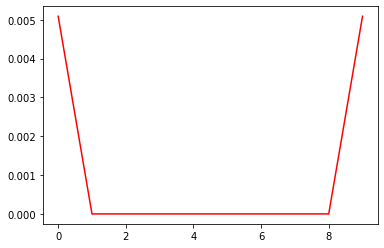

In [3]:
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.interpolate import lagrange
from scipy.integrate import quad
from scipy.interpolate import make_interp_spline
from scipy.interpolate import splrep
from scipy.interpolate import PchipInterpolator
from scipy.interpolate import BarycentricInterpolator as baryinterpolation
k=3
n=10
Delta=1/n
delta=Delta/k
X=[]
Y=[]
Sigma=[]
for i in range(n):
    X.append(i*Delta)
X.append(1)
for i in range(n):
    y=pow(-1,i)*Delta
    Y.append(y)
Y.append(pow(-1,n)*Delta)
Z=[]
s=make_interp_spline(X, Y, k=3, t=None, bc_type="natural", axis=0)
for i in range(n):
    Z.append(i)
    sigma=0
    z=np.linspace(X[i],X[i+1],10)
    a=np.min([Y[i],Y[i+1]])
    b=np.max([Y[i],Y[i+1]])
    for x in z:
        if s(x) < a-sigma:
            sigma=(a-s(x))
        elif s(x) > b+sigma:
            sigma=(s(x)-b)
        else:
            pass
    Sigma.append(sigma)
print(Sigma)
plt.plot(Z,Sigma,color="red")
plt.show()

[[ 1.06744316e+22]
 [ 3.26837614e+22]
 [-3.93291534e+21]
 [ 1.66725601e+20]
 [-2.87232129e+18]
 [-5.92076661e+12]
 [ 7.77093933e+14]
 [-1.24000329e+13]
 [ 8.36229063e+10]
 [-2.16868128e+08]]


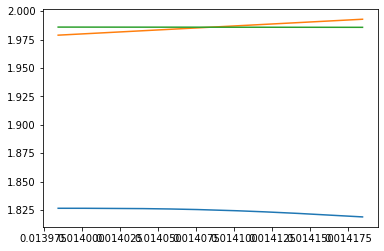

In [3]:
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.interpolate import lagrange
from scipy.integrate import quad
from scipy.interpolate import make_interp_spline
from scipy.interpolate import splrep
from scipy.interpolate import PchipInterpolator
from scipy.interpolate import BarycentricInterpolator as baryinterpolation
a=70
b=-1
m=0
n=1
c=1
d=1
def h(x):
    return(a*(x-m)+c)
def l(x):
    return(b*(x-n)+d)
intersect=(a*m-b*n-c+d)/(a-b)
epsilon=0.0001
x1=intersect-epsilon
x2=intersect+epsilon
y1=h(x1)
y2=l(x2)
A=np.array([[pow(x1,9),pow(x1,8),pow(x1,7),pow(x1,6),pow(x1,5),pow(x1,4),pow(x1,3),pow(x1,2),x1,1],
            [pow(x2,9),pow(x2,8),pow(x2,7),pow(x2,6),pow(x2,5),pow(x2,4),pow(x2,3),pow(x2,2),x2,1],
            [9*pow(x1,8),8*pow(x1,7),7*pow(x1,6),6*pow(x1,5),5*pow(x1,4),4*pow(x1,3),3*pow(x1,2),2*x1,1,0],
            [9*pow(x2,8),8*pow(x2,7),7*pow(x2,6),6*pow(x2,5),5*pow(x2,4),4*pow(x2,3),3*pow(x2,2),2*x2,1,0],
            [72*pow(x1,7),56*pow(x1,6),42*pow(x1,5),30*pow(x1,4),20*pow(x1,3),12*pow(x1,2),6*x1,2,0,0],
            [72*pow(x2,7),56*pow(x2,6),42*pow(x2,5),30*pow(x2,4),20*pow(x2,3),12*pow(x2,2),6*x2,2,0,0],
            [501*pow(x1,6),336*pow(x1,5),210*pow(x1,4),120*pow(x1,3),60*pow(x1,2),21*x1,6,0,0,0],
            [501*pow(x2,6),336*pow(x2,5),210*pow(x2,4),120*pow(x2,3),60*pow(x2,2),21*x2,6,0,0,0],
            [3024*pow(x1,5),1680*pow(x1,4),840*pow(x1,3),360*pow(x1,2),120*x1,24,0,0,0,0],
            [3024*pow(x2,5),1680*pow(x2,4),840*pow(x2,3),360*pow(x2,2),120*x2,24,0,0,0,0]])
Y=np.array([[y1],[y2],[a],[b],[0],[0],[0],[0],[0],[0]])
B=np.linalg.inv(A)
C= B @ Y
print(C)
def f(x):
    A0=C[0][0]*pow(x,9)
    A1=C[1][0]*pow(x,8)
    A2=C[2][0]*pow(x,7)
    A3=C[3][0]*pow(x,6)
    A4=C[4][0]*pow(x,5)
    A5=C[5][0]*pow(x,4)
    A6=C[6][0]*pow(x,3)
    A7=C[7][0]*pow(x,2)
    A8=C[8][0]*x
    A9=C[9][0]
    return(A0+A1+A2+A3+A4+A5+A6+A7+A8+A9)
z=np.linspace(x1,x2,1000)
plt.plot(z,f(z))
plt.plot(z,h(z))
plt.plot(z,l(z))
plt.plot(intersect,h(intersect))
plt.show()
#print(intersect)
#print(x1)
#print(x2)

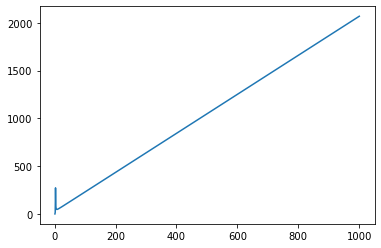

In [18]:
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.interpolate import lagrange
from scipy.integrate import quad
from scipy.interpolate import make_interp_spline
from scipy.interpolate import splrep
from scipy.interpolate import PchipInterpolator
from scipy.interpolate import BarycentricInterpolator as baryinterpolation
Determinant=[]
NORM=[]
N=[]
for j in range(1000):
    n=j+1
    N.append(n)
    a=0
    b=1
    delta=(b-a)/n
    X=[]
    for i in range(n+1):
        X.append(delta*i)
    #print(X)
    C=np.zeros((4*n, 4*n))
    for i in range(n):
        C[i][4*i]=pow(X[i],3)
        C[i][4*i+1]=pow(X[i],2)
        C[i][4*i+2]=pow(X[i],3)
        C[i][4*i+3]=1
        C[n+i][4*i]=pow(X[i+1],3)
        C[n+i][4*i+1]=pow(X[i+1],2)
        C[n+i][4*i+2]=X[i+1]
        C[n+i][4*i+3]=1
    for i in range(n-1):
        C[2*n+i][4*i]=3*pow(X[i+1],2)
        C[2*n+i][4*i+1]=2*X[i+1]
        C[2*n+i][4*i+2]=1
        C[2*n+i][4*i+4]=-3*pow(X[i+1],2)
        C[2*n+i][4*i+5]=-2*X[i+1]
        C[2*n+i][4*i+6]=-1
    for i in range(n-1):
        C[3*n+i-1][4*i]=6*X[i+1]
        C[3*n+i-1][4*i+1]=2
        C[3*n+i-1][4*i+4]=-6*X[i+1]
        C[3*n+i-1][4*i+5]=-2
    #Additional conditions
    C[4*n-2][0]=6*X[0]
    C[4*n-2][1]=2
    C[4*n-1][4*n-4]=6*X[n]
    C[4*n-1][4*n-3]=2
    #print(C)
    d=np.linalg.det(C)
    Determinant.append(d)
    inverse=np.linalg.inv(C)
    norm=np.linalg.norm(inverse)
    NORM.append(norm)
#print(N)
#print(Determinant)
#print(NORM)
for j in range(1000):
    n=j+1
    NORM[j]=NORM[j]/(pow(n,2))
LOG=[]
#for i in range(600):
#    l=math.log(abs(Determinant[i]))
#    LOG.append(l)
#plt.plot(N,LOG)
#plt.show()
plt.plot(N,NORM)
plt.show()

In [1]:
# Generating coefficients c's & k's for exponential functions
import numpy as np
n=40
C=[]
K=[]
for i in range(n):
    c = np.random.uniform(low=-1.0, high=1.0, size=None)
    C.append(c)
for i in range(n):
    k = np.random.uniform(low=-1.0, high=1.0, size=None)
    K.append(k)
print(C)
print(K)
np.save('C.npy', C)
np.save('K.npy', K)

[0.2343078665472691, -0.7592686078152542, -0.7557652963539994, 0.2650067113406043, -0.14272366903705236, 0.4953542173184189, 0.5439857310893317, -0.6799084861724642, 0.8673413799144098, -0.8209734095777748, 0.8359730949223021, -0.45368371571476596, -0.45944935873792536, 0.1253470896276545, -0.6621181957185469, 0.5524037151537013, -0.7388594161247488, 0.367762401179905, 0.7868533216422369, 0.03291715095826242, -0.28629173725043944, 0.626409361612887, 0.29215771421501247, -0.37142180974043937, -0.6453213588534847, -0.6086801951716938, 0.9046993003099046, -0.45378015312489306, 0.13694647692556172, 0.7771620932206875, -0.47641674909137555, -0.468034024889588, -0.9369445059913315, -0.37375148903045896, -0.4248906273488, 0.3774099605585126, 0.5750960564167347, -0.3395935700434076, -0.45951245860936507, -0.2095634829385713]
[0.6311986828562812, 0.3896025718662013, 0.20886702687005698, -0.8416174898642497, -0.6201482639428324, 0.618853160346015, 0.7844574656664993, 0.550476841713992, -0.660004

In [7]:
#Combining trig & Exponential to generate Time & Errortables
import time
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
from scipy.interpolate import CubicSpline
from scipy.interpolate import lagrange
from scipy.integrate import quad
from scipy.interpolate import make_interp_spline
from scipy.interpolate import splrep
from scipy.interpolate import PchipInterpolator
from scipy.interpolate import BarycentricInterpolator as baryinterpolation
#Generating a partition
Finite=20               #Maximum number of coefficients of a function
NuFuncTrig=20               #Number of functions made by trigs
NuFuncExpo=20
NuFunc=NuFuncTrig+NuFuncExpo
NuPoints=100
MaxNuPoint=400           #Max Number of points in partition
Count=100           #Min Number of points in partition 
Jump=1                #The jump in terms of points between each 2 partitions
#epsilon=1000  #Allowed error
#Lip=[0]*(NuFunc) #Lipschizt value 
z=np.linspace(0,1,1000)
n=np.load('n.npy')
a=np.load('a.npy')
b=np.load('b.npy')
C=np.load('C.npy')
K=np.load('K.npy')
NuPar=MaxNuPoint-Count
print('The number of Partitions is:', NuPar)
Partition=[]
PartitionList=[]
Timetable=np.zeros((NuPar,7))
EncodeTimetable=np.zeros((NuPar,7))
Errortable=np.zeros((NuPar,7))
#Generating a partition with the allowed error(epsilon)
for p in range(NuPar):
    step=1/Count
    X=[0]
    count=1
    x=0
####Defining the time arrays#####################################################
    timelinear=[]
    timequadratic=[]
    timecubic=[]
    timefifthpower=[]
    timeseventhpower=[]
    timelargepower=[]
#    timebaryinterpolation=[]
    timemonocubic=[]
#Generating partition#############################################################
    while (x<1-step):
        x=x+step
        X.append(x)
        count=count+1
    X.append(1)
    PartitionList.append(X)
    count=count+1
    Count+=1
    #Computing the values at the partition points#################################
    Partition.append(Count)
    Y=np.zeros((NuFunc,count))
    start=time.time()
    for i in range(NuFuncTrig):
        for j in range(count):
            for k in range(Finite):
                Y[i][j]=Y[i][j]+a[i][k]*np.cos(n[i][k]*X[j])+b[i][k]*np.sin(n[i][k]*X[j])
    end=time.time()
    encodetime=end-start
    for i in range(NuFuncExpo):
        def f(x):
            return(C[i-NuFuncTrig]*pow(math.e,K[i-NuFuncTrig]*x))
        start=time.time()
        k=i+NuFuncTrig
        for j in range(count):
            Y[k][j]=f(X[j])
        end=time.time()
        encodetime+=end-start
#####Interpolation & cost##################################################################
    ilinear=[0]*(NuFunc)
    iquadratic=[0]*(NuFunc)
    icubic=[0]*(NuFunc)
    ififthpower=[0]*(NuFunc)
    iseventhpower=[0]*(NuFunc)
    ilargepower=[0]*(NuFunc)
#    ibaryinterpolation=[0]*NuFunc
    imonocubic=[0]*(NuFunc)
####Defining the functions#################################################################    
    for i in range(NuFuncTrig):
        def f(x):
            y=0
            for j in range(Finite):
                y=y+a[i][j]*np.cos(n[i][j]*x)+b[i][j]*np.sin(n[i][j]*x)
            return(y)
########Computing the cost##################################################################
        #Linear##############################################################
        start = time.time()
        Linear=interp1d(X,Y[i], kind='linear')
        end = time.time()
        timelinear.append(end-start)
        #Quadratic###########################################################
        start = time.time()
        quadratic=make_interp_spline(X, Y[i], k=2, t=None, bc_type=None, axis=0)
        end = time.time()
        timequadratic.append(end-start)
        #Cubic###############################################################
        start = time.time()
        Cubic=CubicSpline(X,Y[i], bc_type='natural')
        end = time.time()
        timecubic.append(end-start)
        #fifthpower###############################################################
        start = time.time()
        fifthpower=make_interp_spline(X, Y[i], k=5, t=None, bc_type=None, axis=0)
        end = time.time()
        timefifthpower.append(end-start)
        #seventhpower###############################################################
        start = time.time()
        seventhpower=make_interp_spline(X, Y[i], k=7, t=None, bc_type=None, axis=0)
        end = time.time()
        timeseventhpower.append(end-start)
        #largepower###############################################################
        start = time.time()
        largepower=make_interp_spline(X, Y[i], k=17, t=None, bc_type=None, axis=0)
        end = time.time()
        timelargepower.append(end-start)
#        #Baryinterpolation########################################################
#        start = time.time()
#        Baryinterpolation=baryinterpolation(X,Y[i])
#        end = time.time()
#        timebaryinterpolation.append(end-start)
        #monocubic###############################################################
        start = time.time()
        monocubic=PchipInterpolator(X,Y[i], axis=0, extrapolate=None)
        end = time.time()
        timemonocubic.append(end-start)
        #Define the error####################################################
        def Flinear(x):
            return(pow(f(x)-Linear(x),2))
        def Fquadratic(x):
            return(pow(f(x)-quadratic(x),2))
        def Fcubic(x):
            return(pow(f(x)-Cubic(x),2))
        def Ffifthpower(x):
            return(pow(f(x)-fifthpower(x),2))
        def Fseventhpower(x):
            return(pow(f(x)-seventhpower(x),2))
        def Flargepower(x):
            return(pow(f(x)-largepower(x),2))
#        def Fbaryinterpolation(x):
#            return(pow(f(x)-Baryinterpolation(x),2))
        def Fmonocubic(x):
            return(pow(f(x)-monocubic(x),2))
        #Taking the error####################################################
        ilinear[i]= pow(quad(Flinear,0,1)[0],0.5)
        iquadratic[i]= pow(quad(Fquadratic,0,1)[0],0.5)
        icubic[i] = pow(quad(Fcubic,0,1)[0],0.5)
        ififthpower[i] = pow(quad(Ffifthpower,0,1)[0],0.5)
        iseventhpower[i] = pow(quad(Fseventhpower,0,1)[0],0.5)
        ilargepower[i] = pow(quad(Flargepower,0,1)[0],0.5)
#        ibaryinterpolation[i] = pow(quad(Fbaryinterpolation,0,1)[0],0.5)
        imonocubic[i] = pow(quad(Fmonocubic,0,1)[0],0.5)
####Defining the functions#################################################################    
    for i in range(NuFuncTrig,NuFunc):
        def f(x):
            return(C[i-NuFuncTrig]*pow(math.e,K[i-NuFuncTrig]*x))
        #f=interp1d(Point[i-NuFuncTrig],Value[i-NuFuncTrig], kind='linear')
########Computing the cost##################################################################
        #Linear##############################################################
        start = time.time()
        Linear=interp1d(X,Y[i], kind='linear')
        end = time.time()
        timelinear.append(end-start)
        #Quadratic###########################################################
        start = time.time()
        quadratic=make_interp_spline(X, Y[i], k=2, t=None, bc_type=None, axis=0)
        end = time.time()
        timequadratic.append(end-start)
        #Cubic###############################################################
        start = time.time()
        Cubic=CubicSpline(X,Y[i], bc_type='natural')
        end = time.time()
        timecubic.append(end-start)
        #fifthpower###############################################################
        start = time.time()
        fifthpower=make_interp_spline(X, Y[i], k=5, t=None, bc_type=None, axis=0)
        end = time.time()
        timefifthpower.append(end-start)
        #seventhpower###############################################################
        start = time.time()
        seventhpower=make_interp_spline(X, Y[i], k=7, t=None, bc_type=None, axis=0)
        end = time.time()
        timeseventhpower.append(end-start)
        #largepower###############################################################
        start = time.time()
        largepower=make_interp_spline(X, Y[i], k=17, t=None, bc_type=None, axis=0)
        end = time.time()
        timelargepower.append(end-start)
#        #Baryinterpolation########################################################
#        start = time.time()
#        Baryinterpolation=baryinterpolation(X,Y[i])
#        end = time.time()
#        timebaryinterpolation.append(end-start)
        #monocubic###############################################################
        start = time.time()
        monocubic=PchipInterpolator(X,Y[i], axis=0, extrapolate=None)
        end = time.time()
        timemonocubic.append(end-start)
        #Define the error####################################################
        def Flinear(x):
            return(pow(f(x)-Linear(x),2))
        def Fquadratic(x):
            return(pow(f(x)-quadratic(x),2))
        def Fcubic(x):
            return(pow(f(x)-Cubic(x),2))
        def Ffifthpower(x):
            return(pow(f(x)-fifthpower(x),2))
        def Fseventhpower(x):
            return(pow(f(x)-seventhpower(x),2))
        def Flargepower(x):
            return(pow(f(x)-largepower(x),2))
#        def Fbaryinterpolation(x):
#            return(pow(f(x)-Baryinterpolation(x),2))
        def Fmonocubic(x):
            return(pow(f(x)-monocubic(x),2))
        #Taking the error####################################################
        ilinear[i]= pow(quad(Flinear,0,1)[0],0.5)
        iquadratic[i]= pow(quad(Fquadratic,0,1)[0],0.5)
        icubic[i] = pow(quad(Fcubic,0,1)[0],0.5)
        ififthpower[i] = pow(quad(Ffifthpower,0,1)[0],0.5)
        iseventhpower[i] = pow(quad(Fseventhpower,0,1)[0],0.5)
        ilargepower[i] = pow(quad(Flargepower,0,1)[0],0.5)
#        ibaryinterpolation[i] = pow(quad(Fbaryinterpolation,0,1)[0],0.5)
        imonocubic[i] = pow(quad(Fmonocubic,0,1)[0],0.5)
#####Finding the mean error###################################################################   
    #Linear#############################################
    Ilinear=np.mean(ilinear)
    Errortable[p][0]=Ilinear
    #Quadratic#############################################
    Iquadratic=np.mean(iquadratic)
    Errortable[p][1]=Iquadratic
    #Cubic#############################################
    Icubic=np.mean(icubic)
    Errortable[p][2]=Icubic
    #Fifthpower#############################################
    Ififthpower=np.mean(ififthpower)
    Errortable[p][3]=Ififthpower
    #Fifthpower#############################################
    Iseventhpower=np.mean(iseventhpower)
    Errortable[p][4]=Iseventhpower
    #largepower#############################################
    Ilargepower=np.mean(ilargepower)
    Errortable[p][5]=Ilargepower
#    #baryinterpolation#############################################
#    Ibaryinterpolation=np.mean(ibaryinterpolation)
#    Errortable[p][6]=Ibaryinterpolation
    #monocubic#############################################
    Imonocubic=np.mean(imonocubic)
    Errortable[p][6]=Imonocubic
####EncodeTimetable##################################################################################
    EncodeTimetable[p][0]=np.mean(timelinear)
    EncodeTimetable[p][1]=np.mean(timequadratic)
    EncodeTimetable[p][2]=np.mean(timecubic)
    EncodeTimetable[p][3]=np.mean(timefifthpower)
    EncodeTimetable[p][4]=np.mean(timeseventhpower)
    EncodeTimetable[p][5]=np.mean(timelargepower)
#    EncodeTimetable[p][6]=np.mean(timebaryinterpolation)
    EncodeTimetable[p][6]=np.mean(timemonocubic)
####Timetable##################################################################################
    Timetable[p][0]=encodetime+np.mean(timelinear)
    Timetable[p][1]=encodetime+np.mean(timequadratic)
    Timetable[p][2]=encodetime+np.mean(timecubic)
    Timetable[p][3]=encodetime+np.mean(timefifthpower)
    Timetable[p][4]=encodetime+np.mean(timeseventhpower)
    Timetable[p][5]=encodetime+np.mean(timelargepower)
#    Timetable[p][6]=encodetime+np.mean(timebaryinterpolation)
    Timetable[p][6]=encodetime+np.mean(timemonocubic)
#Print & save###############################################
plt.show()
print('Partition count list')
print(Partition)
print('Partition list')
PartitionList=np.array(PartitionList, dtype=object)
print(PartitionList)
#################
print('Time table')
print(Timetable)
print('Errortable')
print(Errortable)
print('Encode Time table')
print(EncodeTimetable)
################################################################################
np.save('TmatrixTrigExpo300.npy', Timetable)
np.save('EmatrixTrigExpo300.npy', Errortable)
np.save('CountTrigExpo300.npy', Partition)
np.save('ListTrigExpo300.npy', PartitionList)

The number of Partitions is: 300


<ipython-input-7-68675e08bffa>:156: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  ilinear[i]= pow(quad(Flinear,0,1)[0],0.5)
<ipython-input-7-68675e08bffa>:157: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpo

Partition count list
[101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296